# GPU

In [113]:
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = 'cpu'
print(device)

cpu


# Funciones de preproc

In [10]:
import os
import glob
from dicompylercore import dicomparser as dp
import torch
from torchvision import transforms
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re

def get_rt_parser(ruta):
    
    ''' Esta funcion recibe una ruta con archivos DICOM de un paciente y te devuelve un
    diccionario con los objetos instanciados de la clase DicomParser diferenciados por su tipo
    '''
    
    # Crear diccionario para almacenar los rt_parsers
    rt_parsers = {'RTSTRUCT': None, 'RTDOSE': None, 'CT': []}

    # Obtener la lista de archivos dicom dentro de la subcarpeta del paciente
    archivos_dicom = glob.glob(os.path.join(ruta, "*.dcm*"))

    # Procesar cada archivo DICOM
    for archivo_dicom in archivos_dicom:
        # Crear el path completo al archivo DICOM
        ruta_dicom = os.path.join(ruta, archivo_dicom)
        # Crear un objeto DicomParser para el archivo DICOM
        dicom_parser = dp.DicomParser(ruta_dicom)
        # Obtenemos la informacion de ese objeto 
        series_info = dicom_parser.GetSeriesInfo()

        # Verificar el atributo 'Modality' 
        if series_info['modality'] == 'CT':
            rt_parsers['CT'].append(dicom_parser)
        elif series_info['modality'] == 'RTSTRUCT':
            rt_parsers['RTSTRUCT'] = dicom_parser
        elif series_info['modality'] == 'RTDOSE':
            rt_parsers['RTDOSE'] = dicom_parser

    return rt_parsers

def detectar_etiqueta(texto, etiqueta):
    '''Esta funcion utiliza expresiones regulares para reconocer las etiquetas de las estructuras'''

    patrones = [
        r'\b{}\b'.format(etiqueta),
        r'\b[^\s]*{}[^\s]*\b'.format(etiqueta),  
    ]
    for patron in patrones:
        coincidencias = re.findall(patron, texto, flags=re.IGNORECASE)
        if coincidencias:
            return coincidencias[0] 
            
    return None

def get_dic_posiciones(rt_parsers): 
    
    ''' Esta funcion te devuelve la posicion en la que se encuentra la estructura ordenadas en un diccionario'''
    
    dic_posiciones = dict()
    structure_parser = rt_parsers['RTSTRUCT']
    structures = structure_parser.GetStructures()
    
    for referencia in ['PTV', 'vejiga', 'recto', 'cuerpo']:
        for posicion, dic_info in structures.items():
            match = detectar_etiqueta(dic_info['name'], referencia)
            if match is not None: 
                dic_posiciones[referencia] = posicion
                
    return dic_posiciones, structure_parser

def get_coordenadas(dic_posiciones, structure_parser):
    
    ''' Esta funcion te devuelve las coordenadas de las estructuras'''
    
    dic_coordenadas = dict()
    dic_coordenadas_ok = dict()

    for etiqueta, posicion in dic_posiciones.items():
        coordenadas = structure_parser.GetStructureCoordinates(posicion) 
        dic_coordenadas[etiqueta] = coordenadas

    for etiqueta, coordenadas_sucias in dic_coordenadas.items():
        dic_aux = dict()  # Inicializar dic_aux en cada iteración del bucle exterior
        for z, lista_diccionarios in coordenadas_sucias.items():
            data = lista_diccionarios[0]['data']
            dic_aux[z] = data
        dic_coordenadas_ok[etiqueta] = dic_aux 

    return dic_coordenadas_ok

def get_tensor_ct(rt_parsers):

    '''Con esta funcion obtenemos el tensor RGB con la ct ubicada en el canal B'''
    
    informacion_cortes = dict()
    ct_parsers = rt_parsers['CT']
    
    for ct_parser in ct_parsers:
        coordenada_z = ct_parser.GetImageLocation()
        datos_ct = ct_parser.GetImageData()
        imagen_ct = ct_parser.GetImage()

        # Acceder a las filas y columnas
        filas = datos_ct['rows']
        columnas = datos_ct['columns']

        position_ct = datos_ct['position']
        x_ct = position_ct[0]
        y_ct = position_ct[1]

        pixel_spacing_ct = datos_ct['pixelspacing']

        # Almacenar la información en el diccionario
        informacion_cortes[coordenada_z] = {'coordenada_z': coordenada_z, 'imagen_ct': imagen_ct}
        
    # Obtener las coordenadas Z ordenadas
    coordenadas_z_ordenadas = sorted(informacion_cortes.keys())
    profundidad = len(coordenadas_z_ordenadas)
    
    # Crear un tensor RGB 
    tensor_rgb = torch.zeros((profundidad, filas, columnas, 3), dtype=torch.float32)

    # Crear un objeto ToTensor para convertir la imagen a tensor
    to_tensor = transforms.ToTensor()
    
    for i, coordenada_z in enumerate(coordenadas_z_ordenadas):
        # Acceder a la imagen CT del diccionario
        imagen_ct = informacion_cortes[coordenada_z]['imagen_ct']
    
        # Convertir la imagen a tensor
        tensor_imagen_ct = to_tensor(imagen_ct)
    
        # Asignar la imagen CT al canal B del tensor RGB
        tensor_rgb[i, :, :, 2] = tensor_imagen_ct[0]  

    return tensor_rgb, filas, columnas, coordenadas_z_ordenadas, datos_ct, informacion_cortes, x_ct, y_ct, pixel_spacing_ct

def get_tensor_estructuras(dic_coordenadas, tensor_rgb, filas, columnas, coordenadas_z_ordenadas):

    '''Con esta funcion obtenemos el tensor RGB con las estructuras colocadas en su canal correspondiente'''
    
    dic_mascaras = dict()
    dic_coordenadas_sinz_estructuras = dict()
    
    # vamos a preparar las coordenadas para conseguir las mascaras
    for estructura, coordenadas in dic_coordenadas.items():
        coordenadas_sinz = dict()
        
        # Iterar sobre los cortes y coordenadas
        for corte, coordenadas_conz in coordenadas.items():
            # Convertir a numpy array
            coordenadas_conz = np.array(coordenadas_conz, dtype=float)
            coordenadas_sin_z = coordenadas_conz[:, :2]
            # guardar las coordenadas por su z
            coordenadas_sinz[corte] = coordenadas_sin_z
            
        dic_coordenadas_sinz_estructuras[estructura] = coordenadas_sinz

    # vamos a formar las mascaras de las estructuras
    for estructura, coordenadas_sinz in dic_coordenadas_sinz_estructuras.items():
        
        dic_mascaras_aux = dict()
        
        for corte, coordenadas in coordenadas_sinz.items():
            # Centrar la figura (ajustar al centro de la imagen)
            coordenadas[:, :2] += [columnas // 2, filas // 2]
            coordenadas_ajustadas = (coordenadas).astype(np.int32)
            # Crear una imagen en blanco
            img = np.zeros((filas, columnas), dtype=np.uint8)
            
            # Dibujar el polígono en la imagen
            cv2.fillPoly(img, [coordenadas_ajustadas], 255)

            #guardamos
            dic_mascaras_aux[corte] = img
            
        dic_mascaras[estructura] = dic_mascaras_aux

    # Crear un objeto ToTensor para convertir la imagen a tensor
    to_tensor = transforms.ToTensor()
    
    # vamos a cargar las mascaras en el tensor
    for estructuras, dic_masc in dic_mascaras.items():
       
        for corte, mascara in dic_masc.items(): 
            corte_2 = round(float(corte), 2)
            for i, coordenada_z in enumerate(coordenadas_z_ordenadas):
                if estructuras == "PTV" and corte_2 == coordenada_z:
                    #Convertir la imagen a tensor
                    tensor_mascara = to_tensor(mascara)
                    # Asignar la mascara al canal G del tensor RGB
                    tensor_rgb[i, :, :, 1] = tensor_mascara
                    
                if estructuras == "recto" and corte_2 == coordenada_z:
                    # Convertir la imagen a tensor
                    tensor_mascara = to_tensor(mascara)
                    # Asignar la imagen CT al canal B del tensor RGB
                    tensor_rgb[i, :, :, 0] = tensor_rgb[i, :, :, 0] + tensor_mascara
                    
                if estructuras == "vejiga" and corte_2 == coordenada_z:
                    # Convertir la imagen a tensor
                    tensor_mascara = to_tensor(mascara)
                    # Asignar la imagen CT al canal B del tensor RGB
                    tensor_rgb[i, :, :, 0] = tensor_rgb[i, :, :, 0] + tensor_mascara*0.75
                         
    return tensor_rgb, dic_coordenadas_sinz_estructuras
    

    
def get_tensor_dosis(rt_parsers, coordenadas_z_ordenadas):

    ''' Con esta funcion obtenemos el tensor de la dosis'''
    
    dic_dosis = dict()
    dic_dosis_array = dict()
    profundidad = len(coordenadas_z_ordenadas)

    # Crear un objeto ToTensor para convertir la imagen a tensor
    to_tensor = transforms.ToTensor()

    dosis_parser = rt_parsers['RTDOSE']

    data_dosis = dosis_parser.GetDoseData()

    position_dosis = data_dosis['position']
    x_dosis = position_dosis[0]
    y_dosis = position_dosis[1]

    pixel_spacing_dosis = data_dosis['pixelspacing']
    
    for i, coordenada_z in enumerate(coordenadas_z_ordenadas):
        dosis_array = np.array(dosis_parser.GetDoseGrid(coordenada_z), dtype=float)
        dic_dosis_array[coordenada_z] = dosis_array
        shape = dosis_array.shape
        filas = shape[0]
        columnas = shape[1]
        tensor = to_tensor(dosis_array)
        dic_dosis[i] = tensor

    # Crear un tensor
    tensor_dosis = torch.zeros((profundidad, filas, columnas), dtype=torch.float32)
    for i, tensord in dic_dosis.items():
        tensor_dosis[i, :, :] = tensord

    return tensor_dosis, dic_dosis_array, x_dosis, y_dosis, pixel_spacing_dosis

def get_tensor_dosis_interpolado(tensor_dosis, pixel_spacing_dosis, pixel_spacing_ct):

    '''Con esta funcion interpolamos el tensor de la dosis'''
    
    tensor_original = tensor_dosis
    
    factor_escala = pixel_spacing_dosis[0] / pixel_spacing_ct[0]
    
    # Utilizar F.interpolate para cambiar el espaciado de píxeles
    tensor_interpolado = F.interpolate(tensor_original, scale_factor=factor_escala, mode='nearest')
    tensor_interpolado = tensor_interpolado.permute(0,2,1)
    tensor_interpolado = F.interpolate(tensor_interpolado, scale_factor=factor_escala, mode='nearest')
    tensor_interpolado = tensor_interpolado.permute(0,2,1)
    
    # Verificar la nueva forma y el nuevo espaciado de píxeles
    nueva_forma = tensor_interpolado.size()
    nuevo_pixel_spacing = pixel_spacing_dosis[0]/factor_escala

    return tensor_interpolado

def get_tensor_recortado(tensor_rgb, dic_coordenadas_sinz_estructuras, tensor_interpolado, x_dosis, y_dosis, x_ct, y_ct, pixel_spacing_ct):

    ''' Con esta funcion obtenemos los tensor de dosis y RGB  recortados sin fondo y correlacionados espacialmente'''
    
    mascaras_rectan = dict()
    lista_x = []
    lista_y = []
    lista_xw = []
    lista_yh = []

    size_interp = tensor_interpolado.size()
    
    filas_interp = size_interp[1]
    columnas_interp = size_interp[2]
    profundidad_interp = size_interp[0]

    size_rgb = tensor_rgb.size()
   
    filas_rgb = size_rgb[1]
    columnas_rgb = size_rgb[2]
    profundidad_rgb = size_rgb[0]

    profundidad_total = profundidad_interp + profundidad_rgb + 1
    
    tensor_recorte = torch.zeros([profundidad_total, filas_rgb, columnas_rgb, 3])

    tensor_recorte[0:profundidad_rgb, :,:,:] = tensor_rgb

    lim_x = (x_ct - x_dosis)/pixel_spacing_ct[0]  # aca faltaria ver cuantos pixeles (multiplicando por el dcm)
    # print(x_ct)
    # print(x_dosis)
    # print(pixel_spacing_ct)
    lim_x = int(-lim_x)
    lim_x2 = int(lim_x + columnas_interp)
    # print(lim_x,lim_x2)
    lim_y = (y_ct - y_dosis)/pixel_spacing_ct[0]
    lim_y = int(-lim_y)
    lim_y2 = int(lim_y + filas_interp)
    # print(lim_y,lim_y2)

    # print(tensor_interpolado.size())
    # print(tensor_rgb.size())
    
    tensor_recorte[profundidad_rgb+1:profundidad_total, lim_y:lim_y2,lim_x:lim_x2,0] =  tensor_interpolado

    for corte, coordenadas in dic_coordenadas_sinz_estructuras["cuerpo"].items():
        coordenadas1 = [coordenadas.astype(int)]
        x, y, w, h = cv2.boundingRect(coordenadas1[0])
        lista_x.append(x)
        lista_y.append(y)
        lista_xw.append(x + w)
        lista_yh.append(y + h)

    min_x = min(lista_x)
    min_y = min(lista_y)
    max_xw = max(lista_xw)
    max_yh = max(lista_yh)
    
    tensor_recortado = tensor_recorte[:, min_y - 4 : max_yh + 4, min_x - 4 : max_xw + 4, :]

    tensor_rgb_recortado = tensor_recortado[0:profundidad_rgb, :,:,:]

    tensor_rgb_recortado = tensor_rgb_recortado.permute(3,0,1,2) # esto le cambie

    tensor_dosis_recortado = tensor_recortado[profundidad_rgb+1:profundidad_total, :,:,0]
    
    return tensor_rgb_recortado, tensor_dosis_recortado

# Funcion cargador de pacientes

In [11]:

import os
import glob
import torch

def Cargador_de_pacientes(root_folder, output_root_folder): 
    ''' A esta funcion le ingresamos la ruta con las carpetas de los pacientes que tienen 
    los archivos DICOM y le pasamos la ruta donde queremos que nos guarde los tensores'''

    if root_folder != None and output_root_folder != None: 

            
        # Obtener la lista de subcarpetas (pacientes) dentro de la carpeta raíz
        subfolders = sorted(next(os.walk(root_folder))[1])
            
        # Iterar sobre cada subcarpeta (paciente)
        for subfolder in subfolders:
            patient_folder = os.path.join(root_folder, subfolder)
            output_folder = output_root_folder
            
            # llamamos a la funcion que devuelve un diccionario con los rt parsers
            rt_parsers = get_rt_parser(patient_folder)
                
            # llamamos a la funcion que nos devuelve un diccionario de posiciones y el structure_parser, la misma tiene como argumento los rt_parsers
            dic_posiciones, structure_parser = get_dic_posiciones(rt_parsers)
               
            # llamamos a la funcion que nos devuelve el diccionario de coordenadas de cada estructura, tiene como argumento el diccionario de posiciones y structure_parser
            dic_coordenadas = get_coordenadas(dic_posiciones, structure_parser)
                
            # llamamos a la funcion que nos devuelve el tensor rgb (con la CT cargada en el canal B) y otras variables de utilidad, tiene como argumento los rt_parsers
            tensor_rgb, filas, columnas, coordenadas_z_ordenadas, datos_ct, informacion_cortes, x_ct, y_ct, pixel_spacing_ct = get_tensor_ct(rt_parsers)
                
            # llamamos a la funcion que nos devuelve el tensor rgb normalizado, con las estructuras y CT cargados en los canales correspondientes. 
            tensor_rgb_2, dic_coordenadas_sinz_estructuras = get_tensor_estructuras(dic_coordenadas, tensor_rgb, filas, columnas, coordenadas_z_ordenadas)
        
            # llamamos a la funcion que nos devuelve el tensor de dosis normalizado 
            tensor_dosis, dic_dosis_array, x_dosis, y_dosis, pixel_spacing_dosis = get_tensor_dosis(rt_parsers, coordenadas_z_ordenadas)
                
            # llamamos a la funcion que interpola el tensor de dosis
            tensor_interpolado = get_tensor_dosis_interpolado(tensor_dosis, pixel_spacing_dosis, pixel_spacing_ct)
                
            # llamamos a la funcion que nos devuelve el tensor recortado con dimensiones de [x,128,128,3]
            tensor_rgb_recortado, tensor_dosis_recortado = get_tensor_recortado(tensor_rgb, dic_coordenadas_sinz_estructuras, tensor_interpolado, x_dosis, y_dosis, x_ct, y_ct, pixel_spacing_ct)
            
            # Obtener el nombre del archivo sin la ruta y la extensión
            filename = os.path.splitext(os.path.basename(subfolder))[0]
                
            # Construir la ruta de salida para el tensor rgb
            output_file = os.path.join(output_folder, filename + ".pt")
            
            # Asignar el contenido de las variables a un diccionario
            variable = {"imagen": tensor_rgb_recortado, "dosis": tensor_dosis_recortado}
                
            # Guardar el diccionario utilizando el nombre de la variable como nombre de archivo
        
            torch.save(variable, output_file)
        
            print(f"Se guardo el paciente {filename}")
            print('type_ct',tensor_rgb_recortado.type(), 'type_ds', tensor_dosis_recortado.type())
            print('size_ct',tensor_rgb_recortado.size(), 'size_ds', tensor_dosis_recortado.size())
                
        print(f'Se cargaron todos los pacientes ingresados')
        
    return None

In [13]:

root_folder = r"C:\Users\ortma\Desktop\FACULTAD\PI-2\PI-GAN-2\Pre_procesamiento\ARCHIVOS-DICOM"
output_root_folder = r"C:\Users\ortma\Desktop\FACULTAD\PI-2\PI-GAN-2\Pre_procesamiento\TENSORES PACIENTES"
Cargador_de_pacientes(root_folder, output_root_folder)

Se guardo el paciente 001
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 123, 287, 375]) size_ds torch.Size([123, 287, 375])
Se guardo el paciente 002
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 143, 298, 385]) size_ds torch.Size([143, 298, 385])
Se guardo el paciente 003
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 107, 241, 373]) size_ds torch.Size([107, 241, 373])
Se guardo el paciente 004
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 131, 270, 395]) size_ds torch.Size([131, 270, 395])
Se guardo el paciente 005
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 115, 278, 381]) size_ds torch.Size([115, 278, 381])
Se guardo el paciente 006
type_ct torch.FloatTensor type_ds torch.FloatTensor
size_ct torch.Size([3, 120, 204, 351]) size_ds torch.Size([120, 204, 351])
Se guardo el paciente 007
type_ct torch.FloatTensor type_ds torch.FloatTensor
size

# Transformaciones

In [14]:
import torchvision.transforms as transforms
import torch.nn.functional as F
import torch
import numpy as np
import random

#definimos funcion para la carga de tensores


    
# definjcion de las transformaciones para ct , dosis y data augmentation 

def get_transform_dosis(dim_3D):
    transform_list = []
    transform_list.append(transforms.Lambda(lambda dose_val : transformacion_valores_tensores_dosis(dose_val)))
    transform_list.append(transforms.Lambda(lambda dose_val : normalized(dose_val,0.5,0.5)))
    transform_list.append(transforms.Lambda(lambda dose_val : trilinear_interpolation(dose_val, dim_3D))) # que la medida sea parametro
    return transforms.Compose(transform_list)
    
# compose compone varias funciones juntas, admite una lista de transformaciones 

def transformacion_valores_tensores_dosis(dose_val):
    dose_val = dose_val.numpy()
    if dose_val.dtype == np.uint8 or dose_val.dtype == np.uint16:
        dose_val= dose_val / 256
    dose_val = torch.from_numpy(dose_val).float()

    return dose_val

def normalized(img, mean, std):
    img = img.unsqueeze(0)
    max_img = img.max()
    img = img/max_img
    img = img.sub_(mean).div_(std)
    return img

def get_transform_ct(dim_3D):
    transform_list = []
    transform_list.append(transforms.Lambda(lambda ct_image : transformacion_valores_tensores_ct(ct_image)))
    transform_list.append(transforms.Lambda(lambda ct_image : normalize3d(ct_image, (0.5, 0.5, 0.5), (0.5, 0.5, 0.5))))
    transform_list.append(transforms.Lambda(lambda ct_image : trilinear_interpolation(ct_image, dim_3D)))

    return transforms.Compose(transform_list)
    

def transformacion_valores_tensores_ct(ct_image):
    ct_image = ct_image.numpy()
    if ct_image.dtype == np.uint8 or ct_image.dtype == np.uint16:
        ct_image = ct_image / 256
    ct_image = torch.from_numpy(ct_image).float()

    return ct_image

def normalize3d(img, mean, std):
    ''' Normalizes a voxel Tensor (C x D x H x W) by mean and std. '''
    if len(mean) < 3 or len(std) < 3:
        raise TypeError('not enough means and standard deviations')
    for t, m, s in zip(img, mean, std):
        t.sub_(m).div_(s)
    return img

def trilinear_interpolation(tensor, target_size):
    # Redimensionar usando interpolación trilineal con el tamaño objetivo
    tensor_resized = F.interpolate(tensor.unsqueeze(0), size=target_size, mode='trilinear', align_corners=False).squeeze(0)
    return tensor_resized

def get_transform_data_augmentation(dim, modo = None):

    '''Esta funcion por me de devuelve las transformaciones que hay que aplicar para el aumento de datos, se puede elegir el modo pero por defecto es ramdom'''
    
    if modo == None:
        random_aug = random.randint(0, 5)
    elif modo == 'FandP':
        random_aug = 0
    elif modo == 'Flip':
        random_aug = 2
    elif modo == 'Crop':
        random_aug = 4
 
    # flip and crop
    if random_aug == 0 or random_aug == 1:
        transform = transforms.Compose(
            [transforms.RandomCrop(100),
             transforms.RandomHorizontalFlip(1), 
             transforms.Lambda(lambda ct_image : trilinear_interpolation(ct_image, dim))] )
    # flip
    elif random_aug == 2 or random_aug == 3: 
        transform = transforms.RandomHorizontalFlip(1)
    #crop
    elif random_aug == 4 or random_aug == 5: 
        transform = transforms.Compose(
            [transforms.RandomCrop(100),
             transforms.Lambda(lambda ct_image : trilinear_interpolation(ct_image, dim))] )
    # print(random_aug)
    return transform


# DataSet y DataLoader

In [72]:

import torch.utils.data as data
import os.path
from torch.utils.data import DataLoader, Dataset, random_split 

def make_dataset(dir, filetypes):
    images = []
    assert os.path.isdir(dir), '%s is not a valid directory' % dir
    for root, _, fnames in sorted(os.walk(dir)):
        for fname in fnames:
            path = os.path.join(root, fname)
            images.append(path)
    return images
    
class CustomImageDataset(data.Dataset):

    def __init__(self, ruta, ct_transform, target_transform, transform_data_augmentation = None):
        self.dir_AB = ruta
        self.transform_ct = ct_transform
        self.target_transform = target_transform 
        self.transform_data_augmentation = transform_data_augmentation
        slice_filetype = ['.pt'] 
        self.AB_paths = sorted(make_dataset(self.dir_AB, slice_filetype))
        self.longuitud = len(self.AB_paths)
       
        
    
    def __getitem__(self, index):
        AB_path = self.AB_paths[index]
        #Cargar el archivo utilizando el nombre de la variable
        loaded = torch.load(AB_path)
        # Acceder a los tensores por separado
        tensor_ct = loaded["imagen"]
        dose_val = loaded["dosis"]
        tensor_ct = self.transform_ct(tensor_ct)
        dose_val = self.target_transform(dose_val)
        if self.transform_data_augmentation: 
            tensor_transform = torch.zeros([3, 257, 128, 128])
            tensor_transform[:,0:128,:,:] = tensor_ct 
            tensor_transform[0,129:257,:,:] = dose_val 
            
            tensor_transform = self.transform_data_augmentation(tensor_transform)
    
            tensor_ct2 = tensor_transform[:,0:128,:,:]
            dose_val2 = (tensor_transform[0,129:257,:,:]).unsqueeze(0)

            return tensor_ct2, dose_val2
        else: 
            return tensor_ct, dose_val        

    def __len__(self):
        return self.longuitud

    def name(self):
        return 'CustomImageDataset'

In [129]:
# para instanciar un objeto de nuestra clase dataset primero debemos definir que transformaciones le vamos a aplicar

# para esto primero debemos definir la dimension a la que queremos redimensionar nuestros tensores:

dim_3D = [128,128,128]
dim = [dim_3D[0]*2+1, dim_3D[1], dim_3D[2]]

ct_transform = get_transform_ct(dim_3D)

target_transform = get_transform_dosis(dim_3D)

#definimos el modo de dataaug:  
#Modo = None  #'FandP' , 'Flip' , 'Crop' or None para que sea aleatorio

transform_data_augmentation = get_transform_data_augmentation(dim)

#definimos la ruta donde se encuentran los tensores de los pacientes: 
ruta = r"C:\Users\ortma\Desktop\FACULTAD\PI-2\PI-GAN-2\Pre_procesamiento\tensor_prueba"


In [130]:
dataset = CustomImageDataset(ruta, ct_transform, target_transform)

BATCH_SIZE = 1
TRAIN_SIZE = int(len(dataset)*0.8)
VAL_SIZE = len(dataset)-TRAIN_SIZE

print(TRAIN_SIZE, VAL_SIZE)

11 3


In [131]:
train_dataset, val_dataset = random_split(dataset, [TRAIN_SIZE, VAL_SIZE])

train_loader = DataLoader(train_dataset, batch_size= BATCH_SIZE, shuffle=True )
val_loader = DataLoader(val_dataset, batch_size= BATCH_SIZE, shuffle=True )

imgs, masks = next(iter(train_loader))

print(imgs.shape, masks.shape)


torch.Size([1, 3, 128, 128, 128]) torch.Size([1, 1, 128, 128, 128])


In [76]:
import torch
import matplotlib.pyplot as plt
# Display image and label.
train_features, train_labels = next(iter(dataLoaded))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

img = train_features[0]
label = train_labels[0]

print(f"Feature batch shape: {img.size()}")
print(f"Labels batch shape: {label.size()}")
img = img.permute(1,2,3,0)
label = label.permute(1,2,3,0)

img = (img+1)/2
label = (label+1)/2

# Calcular los valores mínimos y máximos para ambas imágenes
min_value = min(img.min(), label.min())
max_value = max(img.max(), label.max())

profundidad = img.size()[1]


for i in range(profundidad):
    # Crear las figuras y los ejes
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))  # Ajusta el tamaño de la figura

    imagen1 =  img[i].numpy()
    imagen2 =  label[i].numpy()
    
    # Mostrar la primera imagen
    im1 = axs[0].imshow(imagen1, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[0].set_title('RGB')

    # Añadir una barra de color vertical para la primera imagen
    cbar1 = fig.colorbar(im1, ax=axs[0])
    cbar1.set_label('Valores')
    
    # Mostrar la segunda imagen
    im2 = axs[1].imshow(imagen2, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[1].set_title('Dosis')

    # Añadir una barra de color vertical para la segunda imagen
    cbar2 = fig.colorbar(im2, ax=axs[1])
    cbar2.set_label('Valores')

    # Mostrar las imágenes
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\ortma\\Desktop\\FACULTAD\\PI-2\\PI-GAN-2\\Pre_procesamiento\\TENSORES PACIENTES\\001.pt'

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


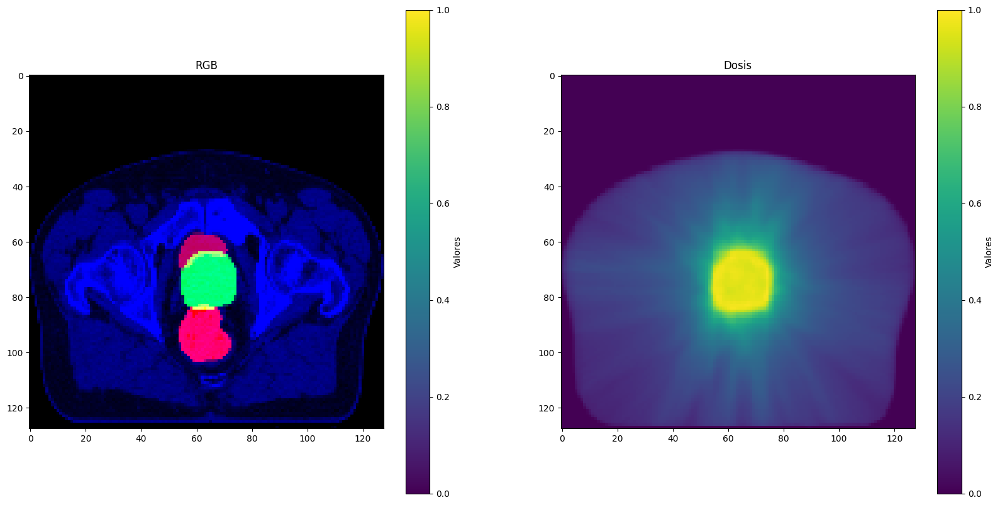

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


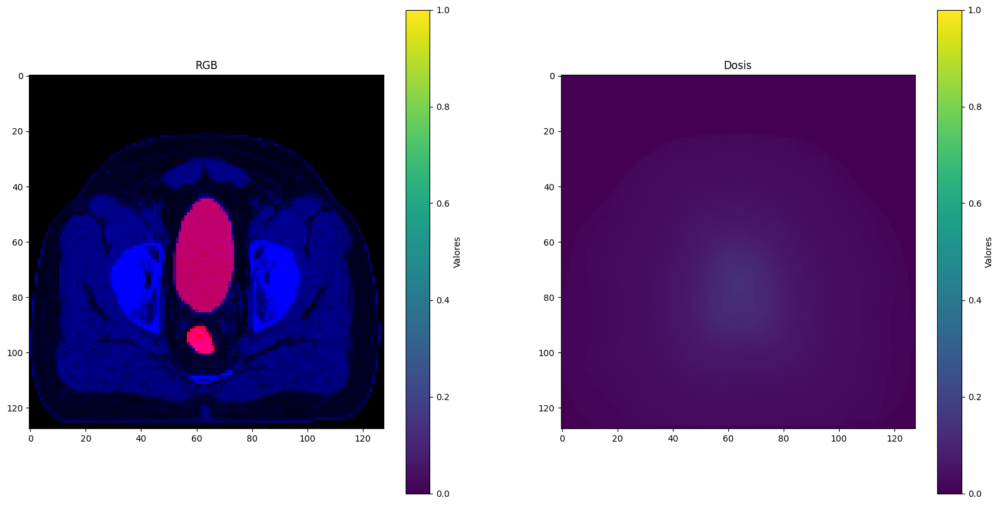

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


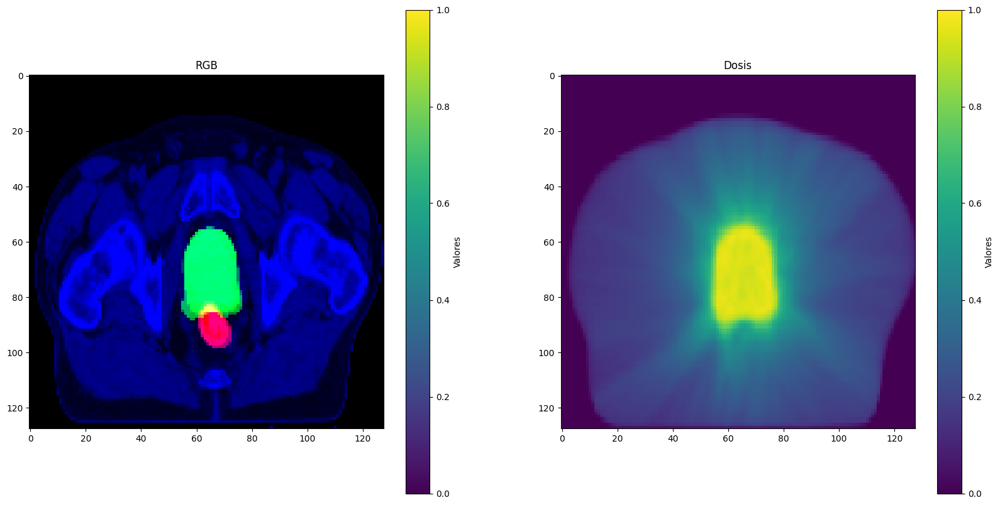

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


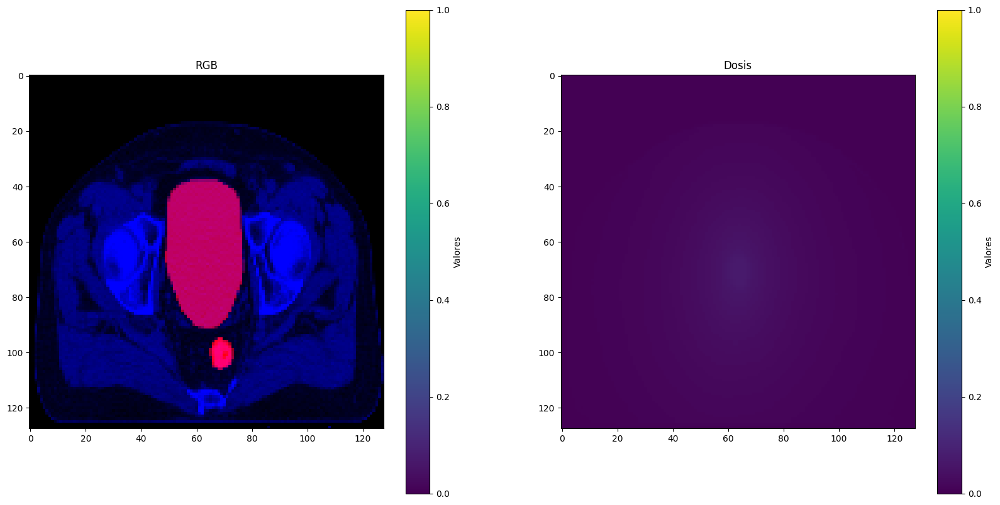

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


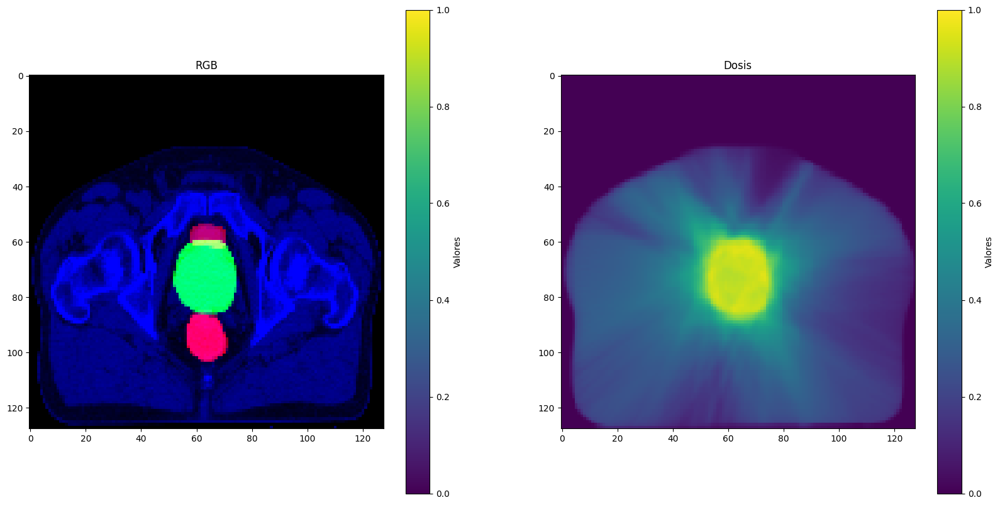

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


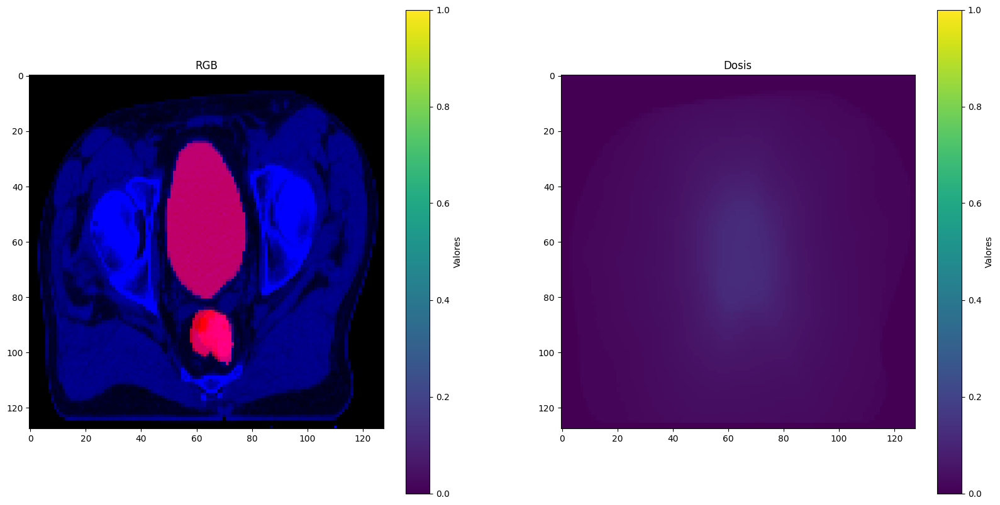

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


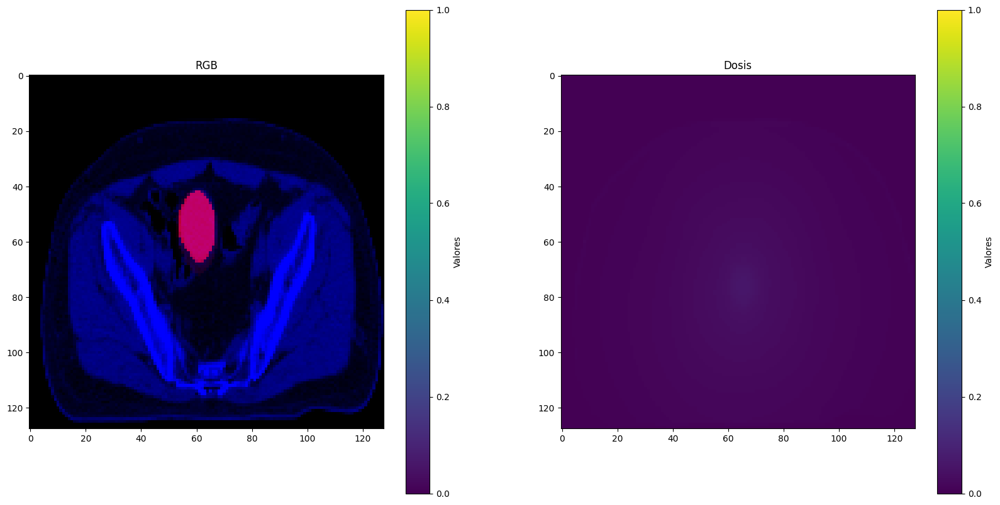

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


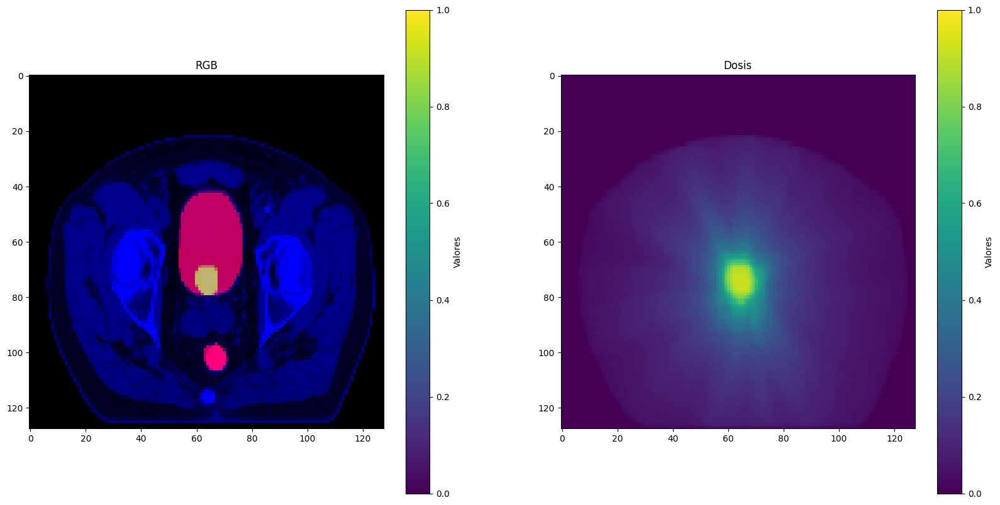

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


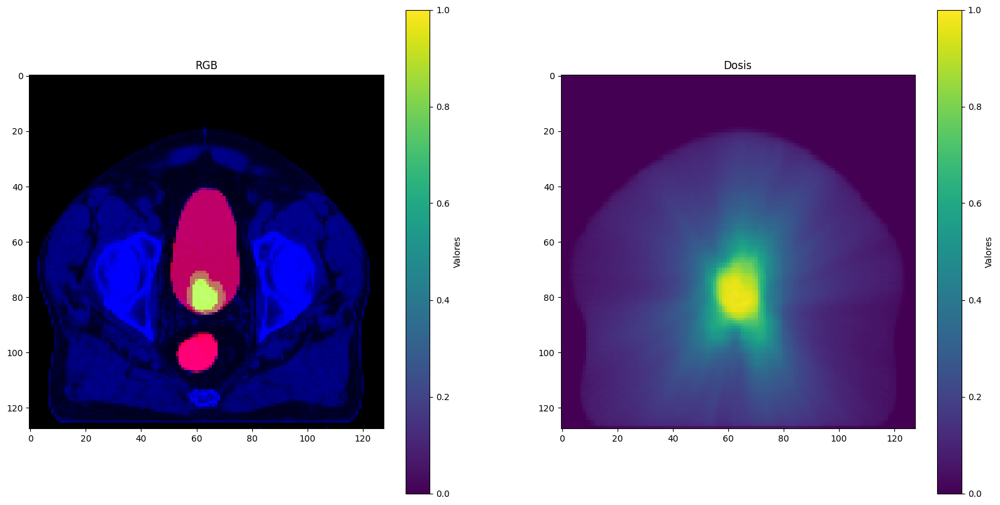

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


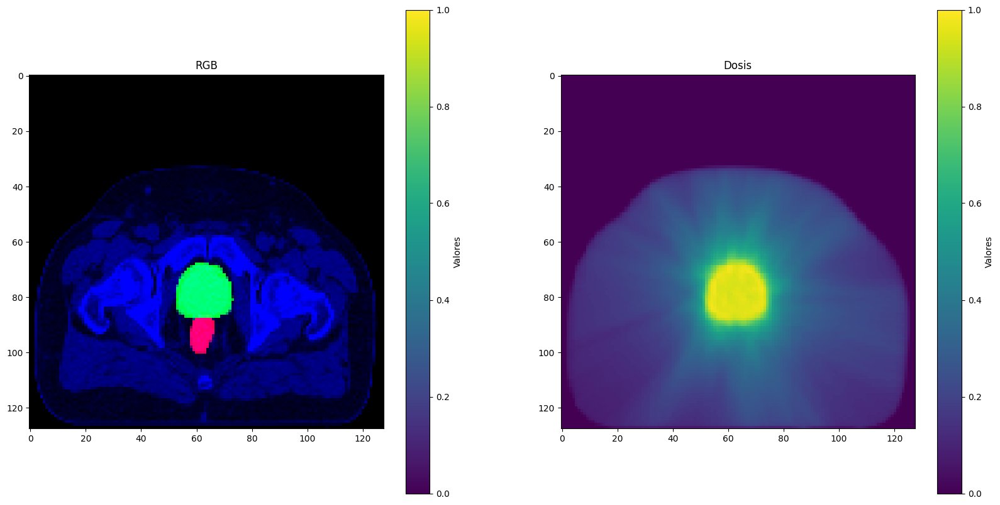

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


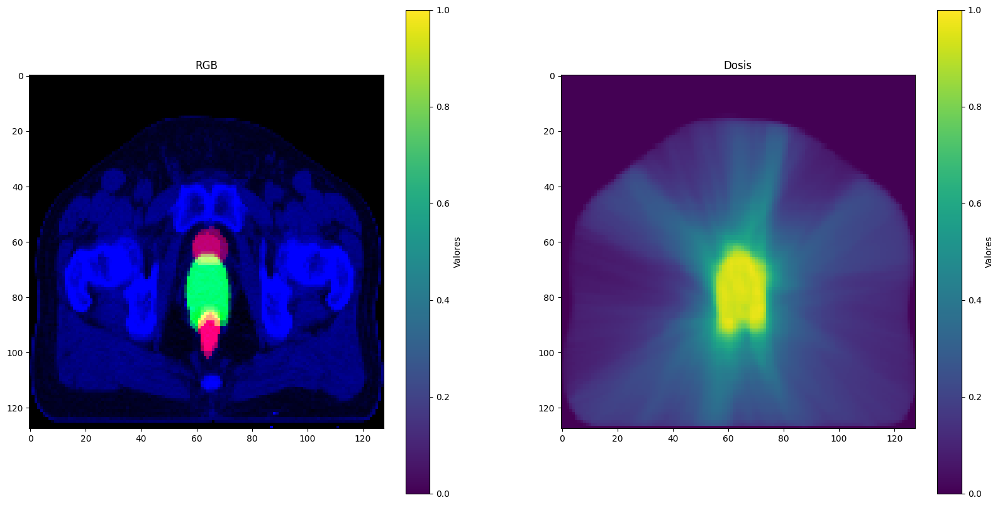

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


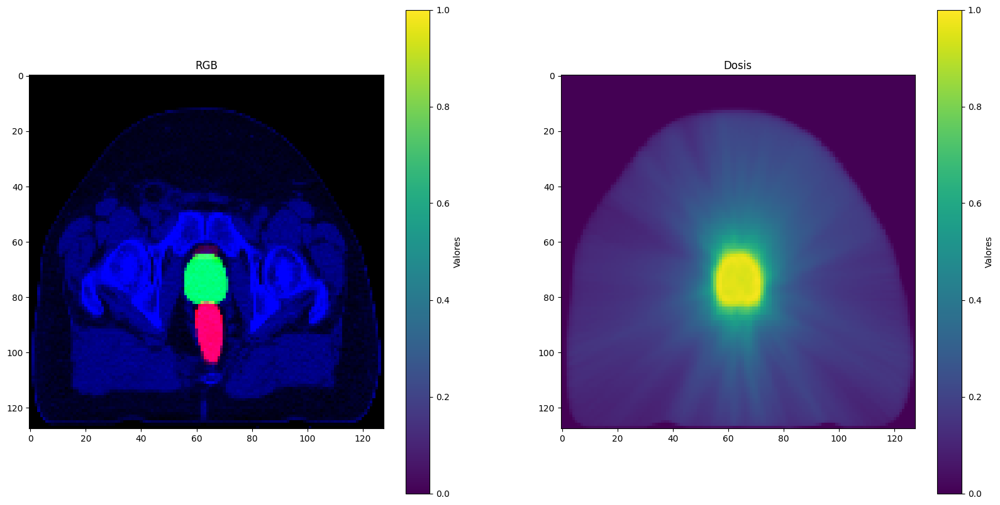

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


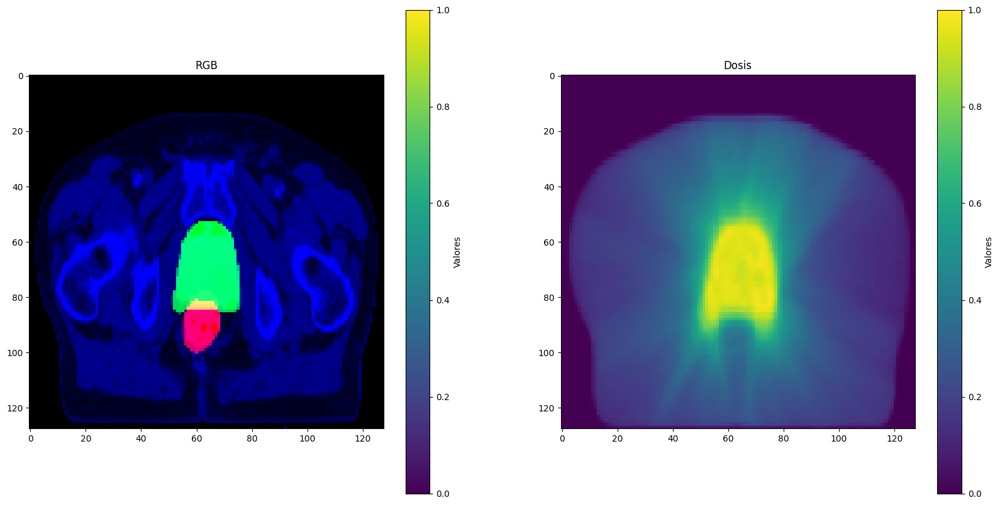

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


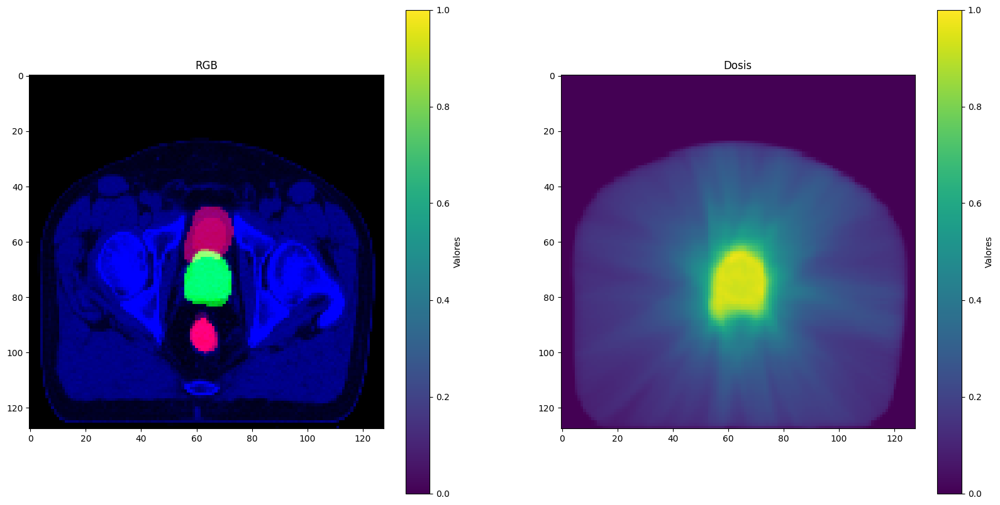

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


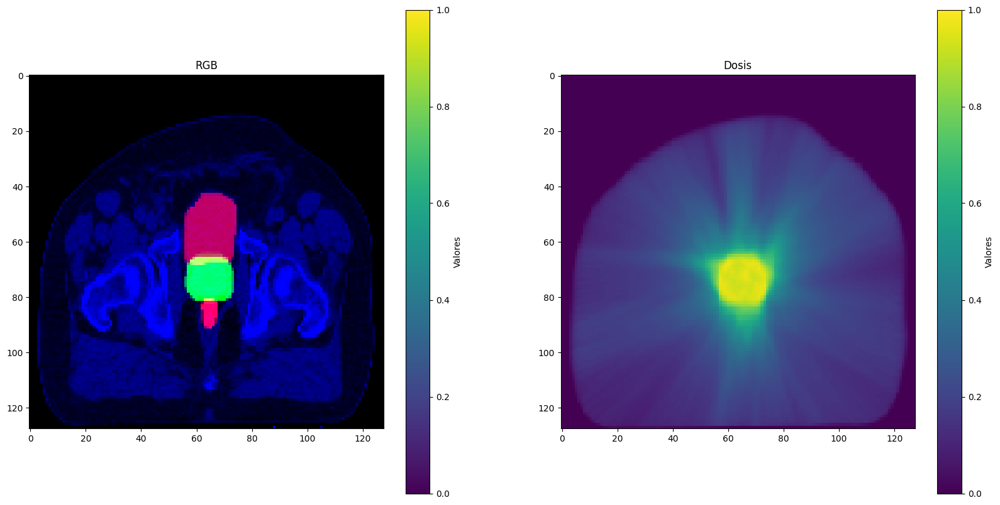

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


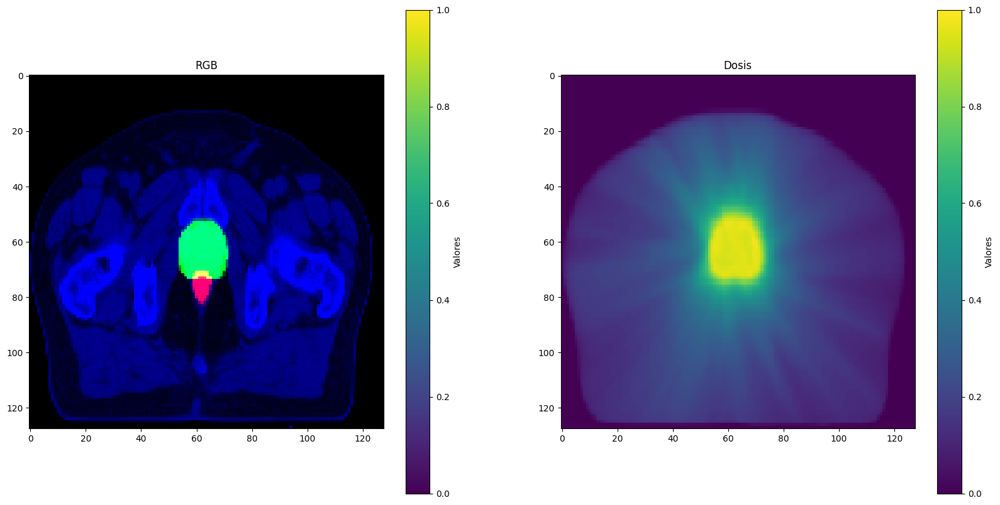

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


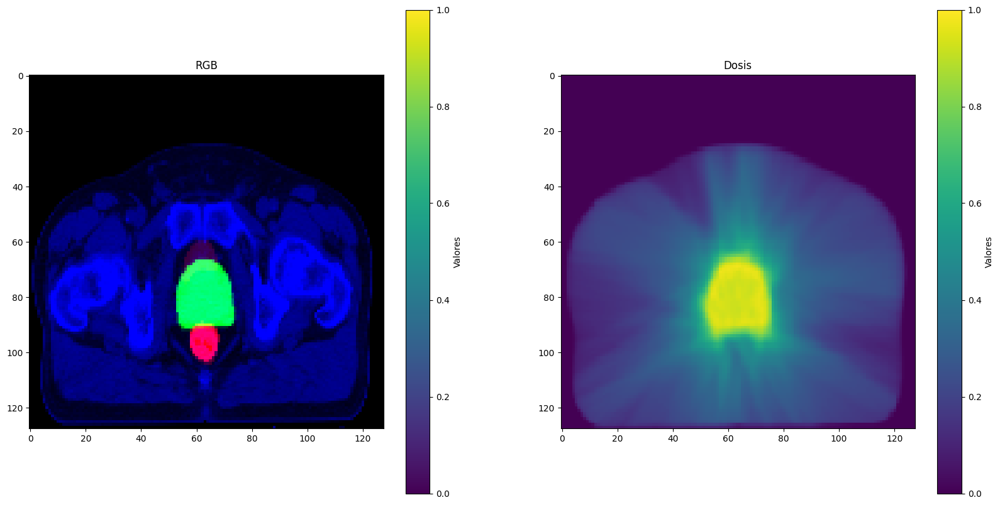

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


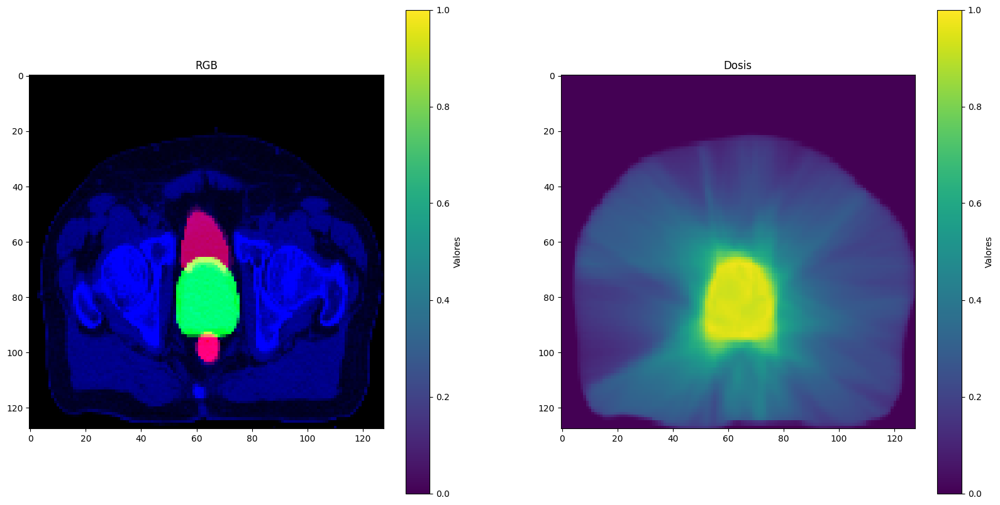

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


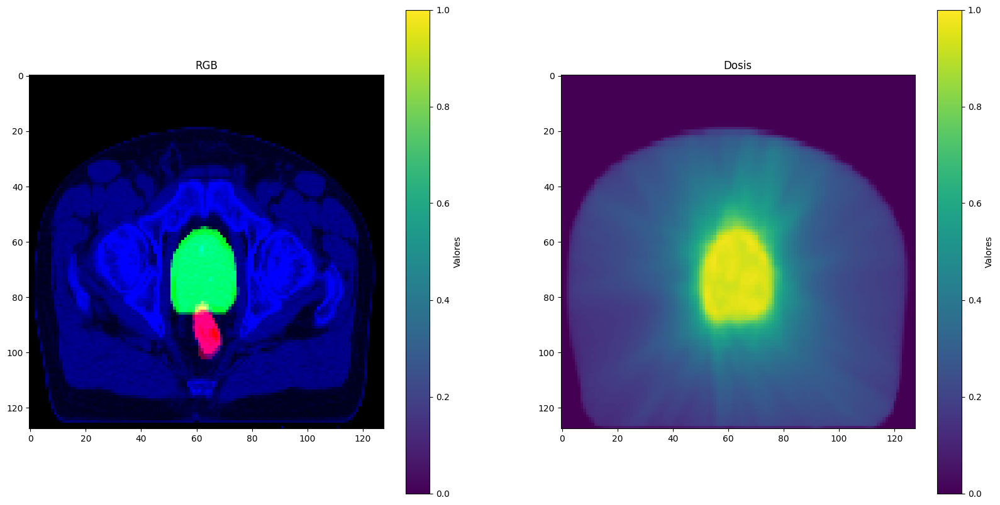

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


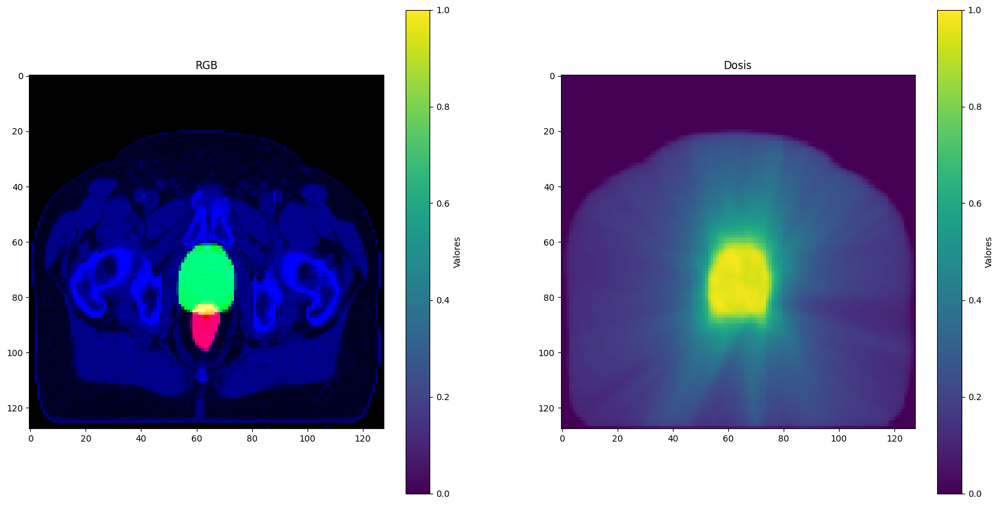

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


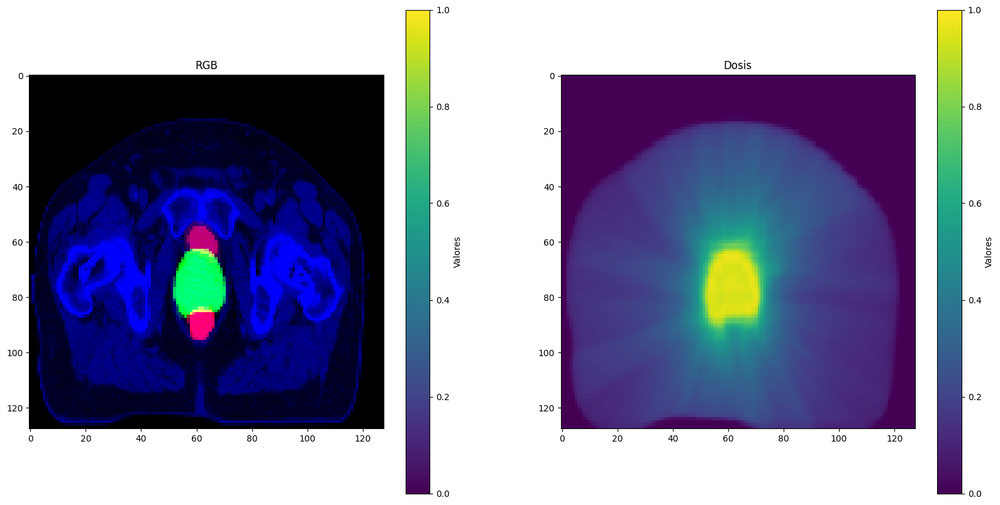

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


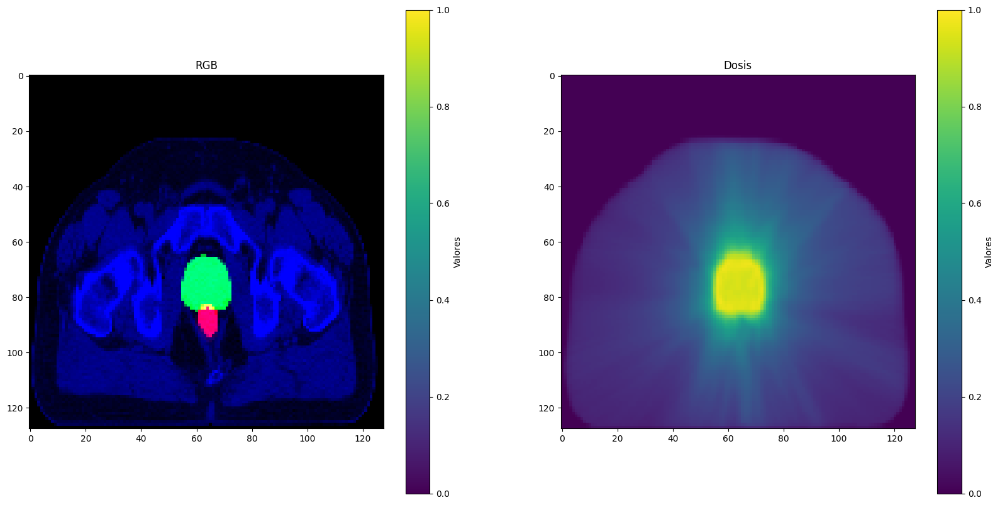

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


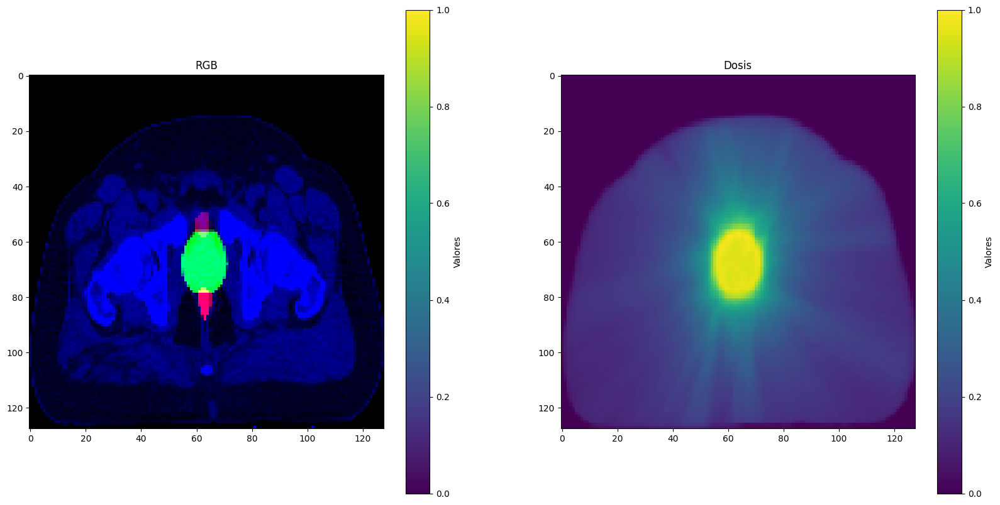

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


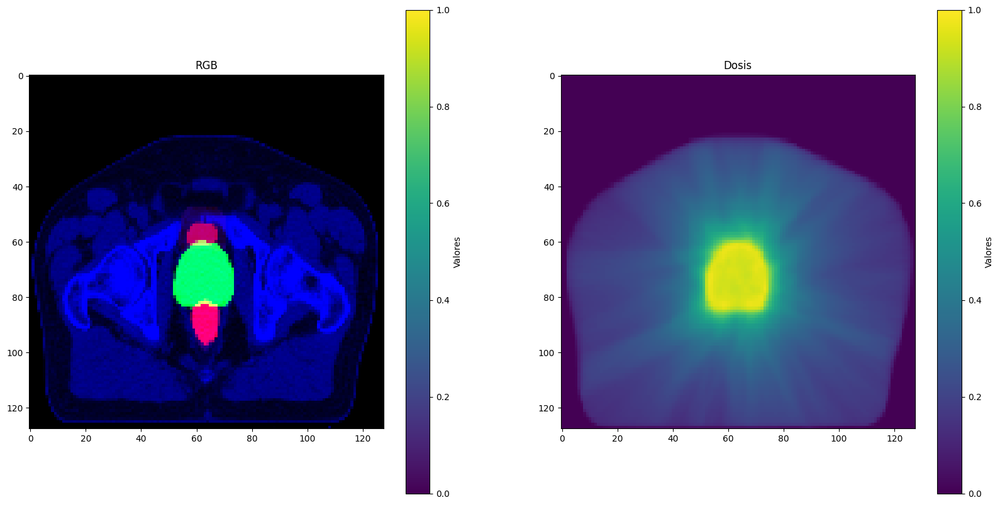

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


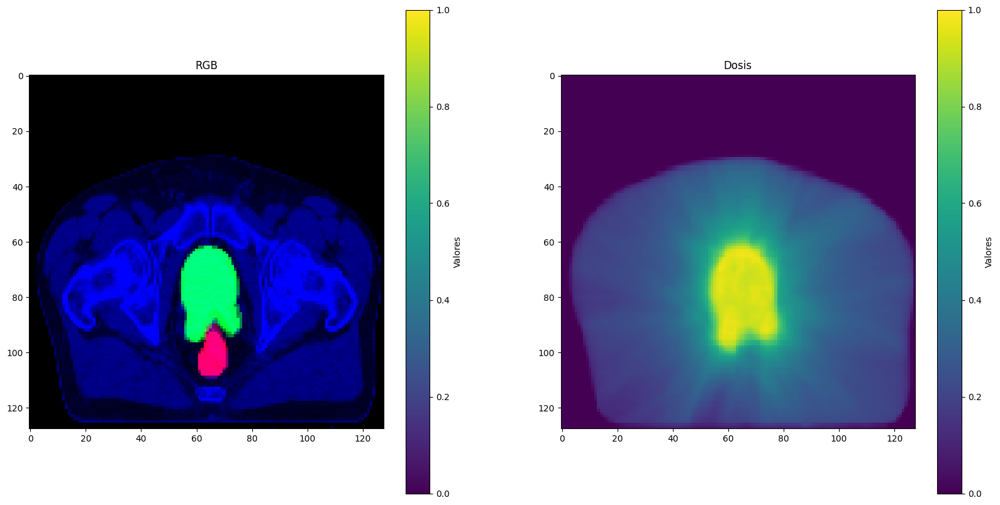

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


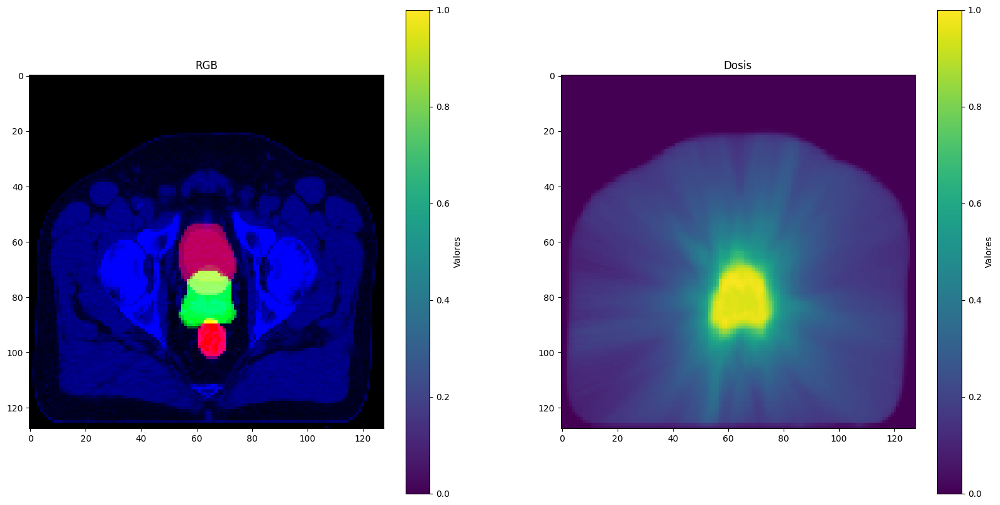

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


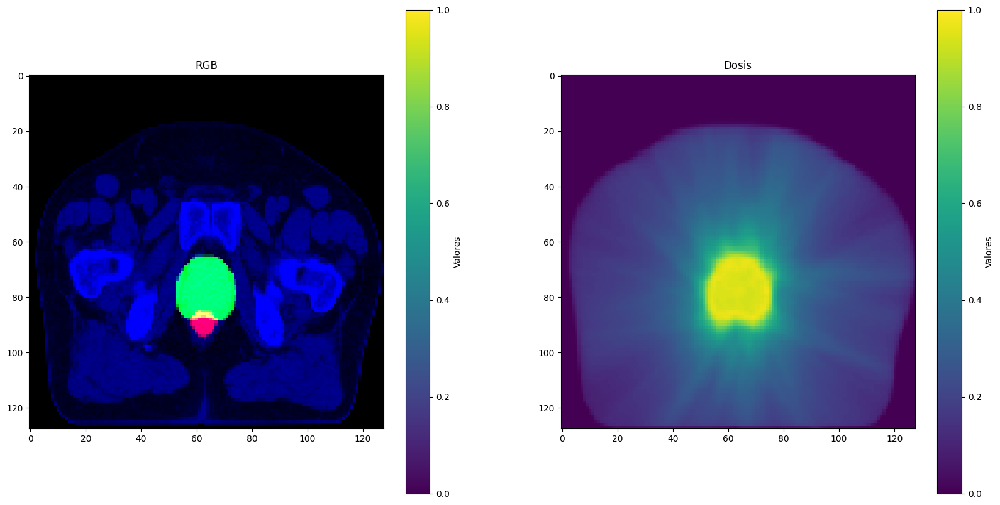

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


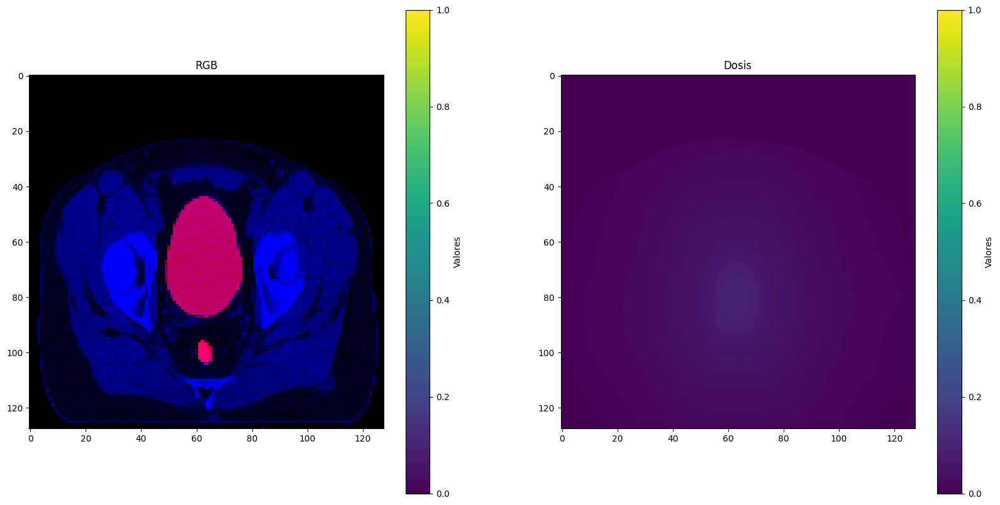

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


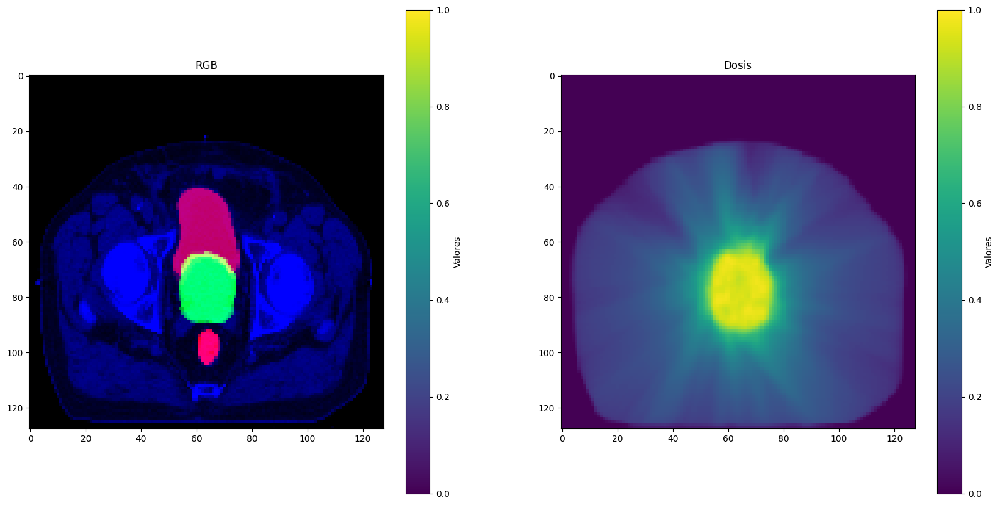

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


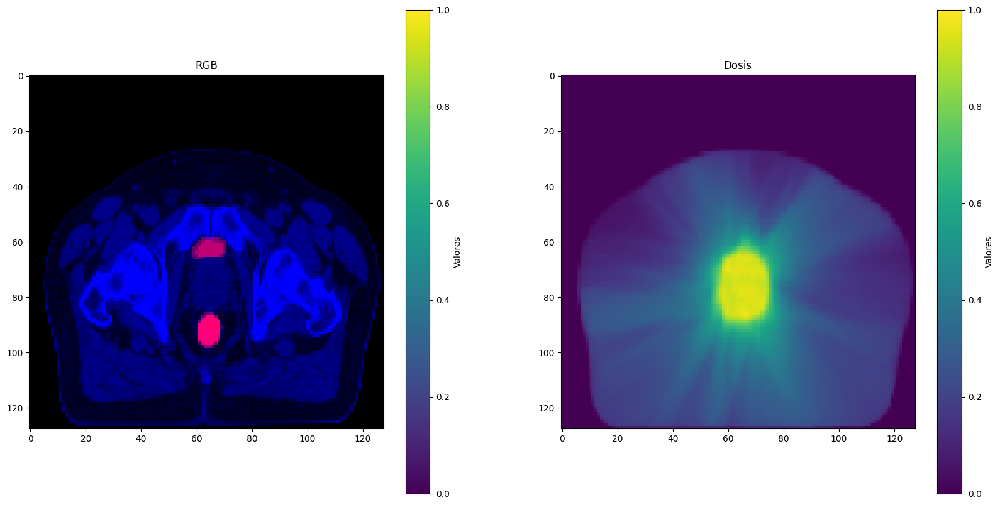

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


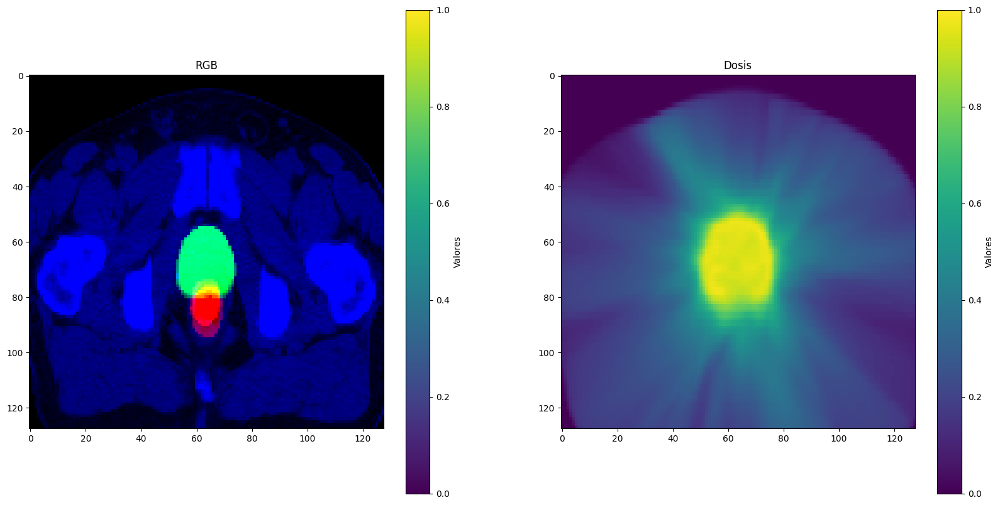

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


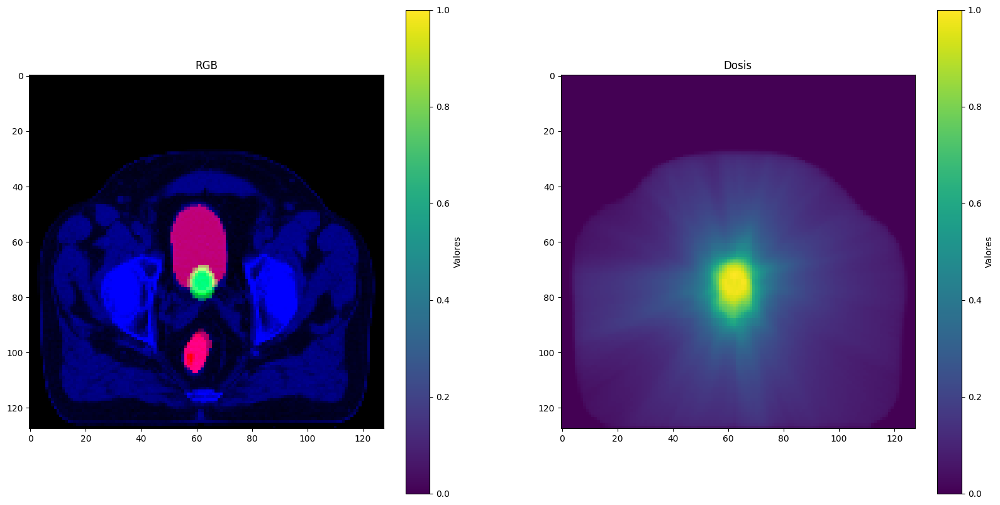

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


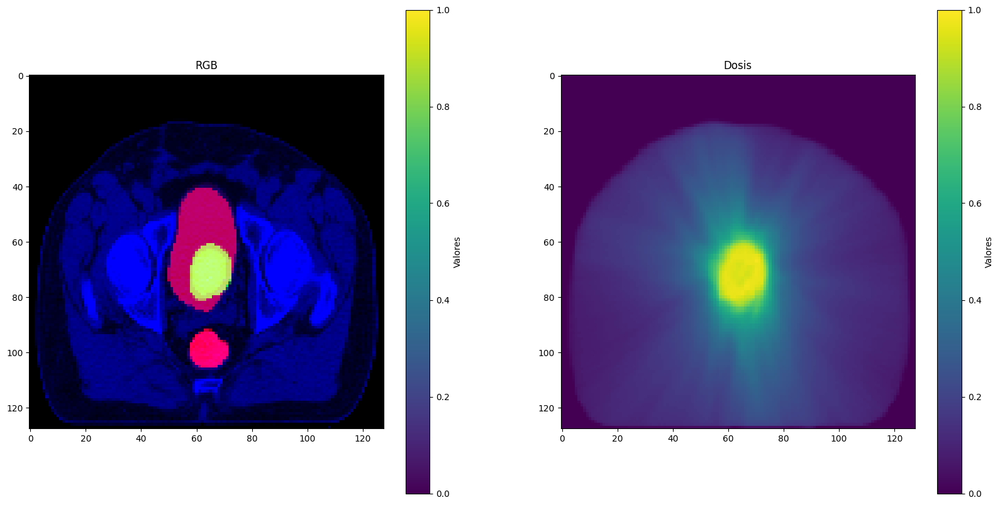

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


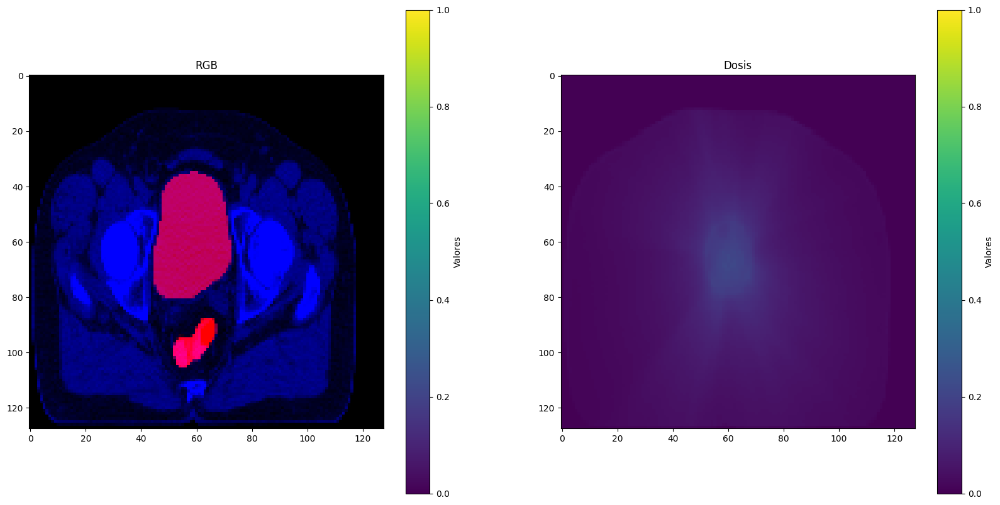

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


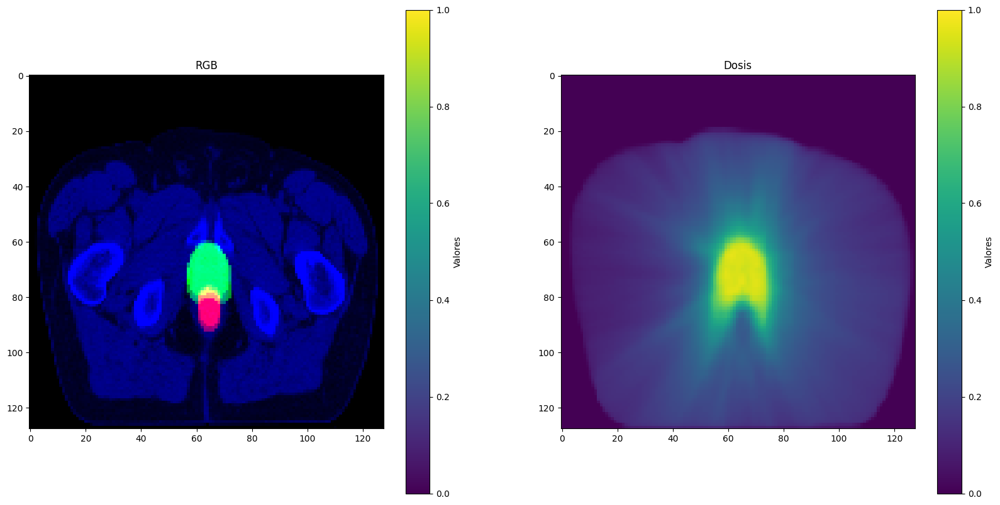

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


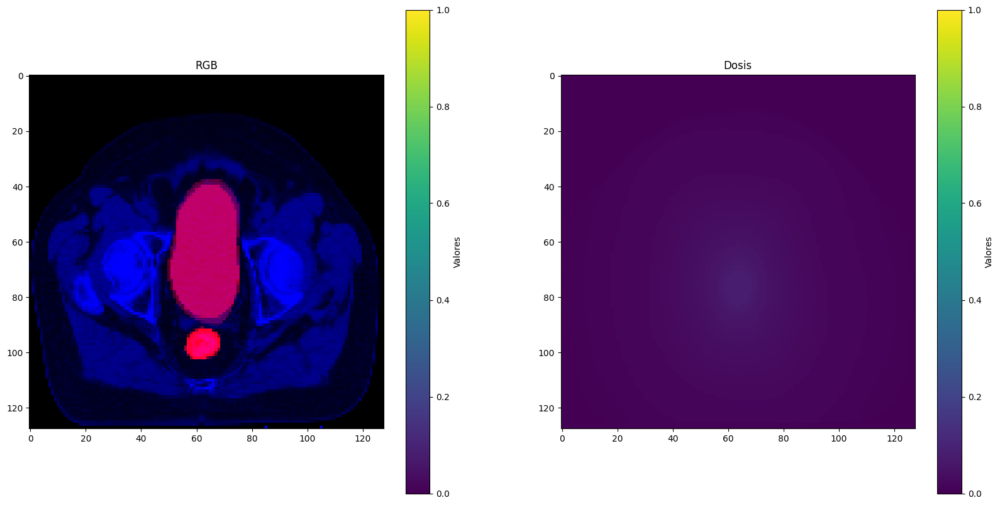

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


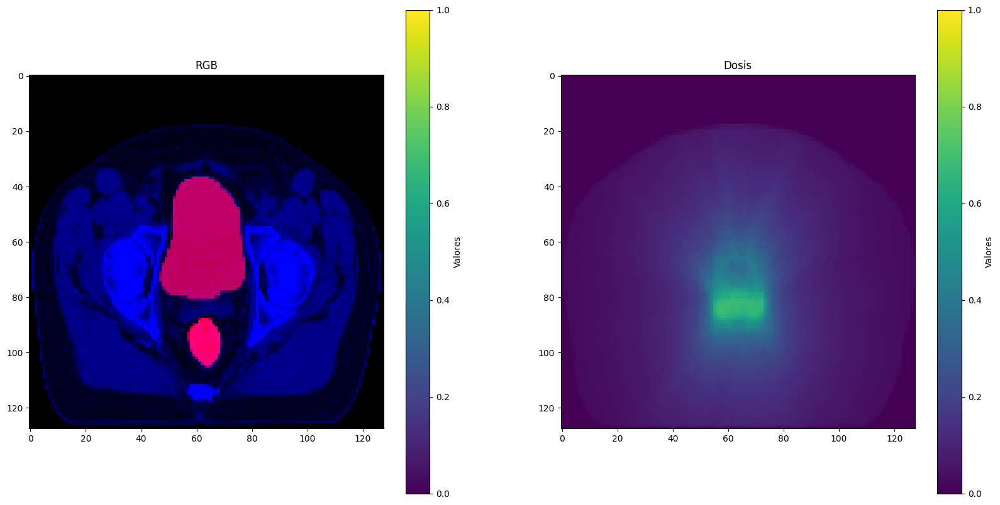

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


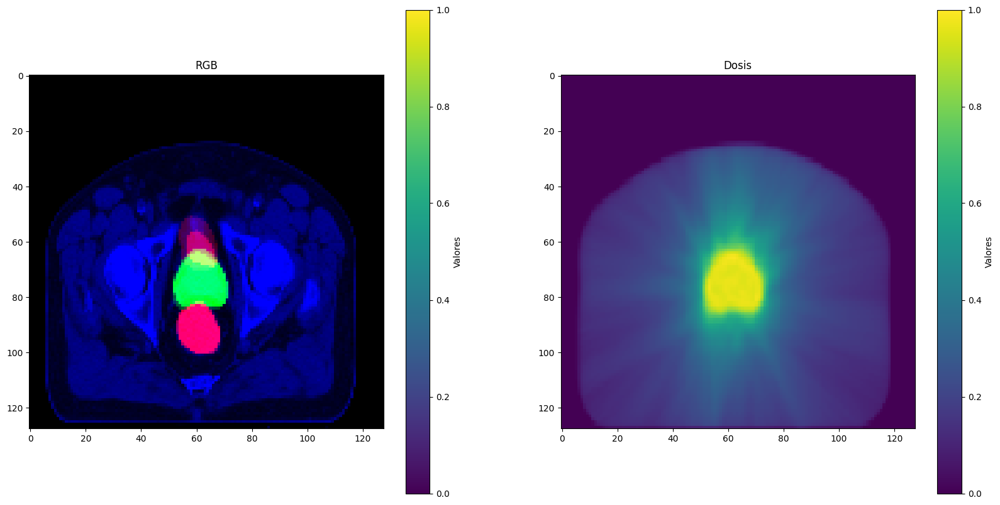

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


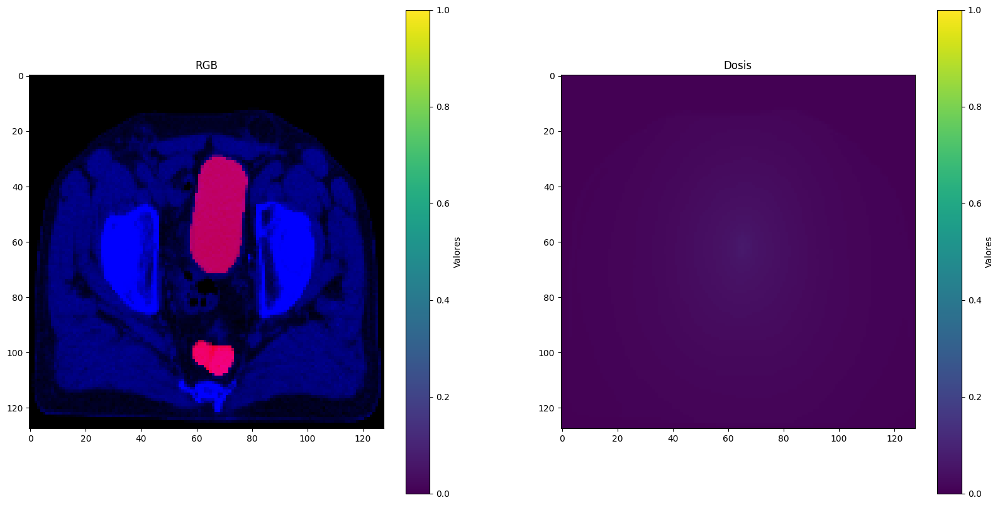

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


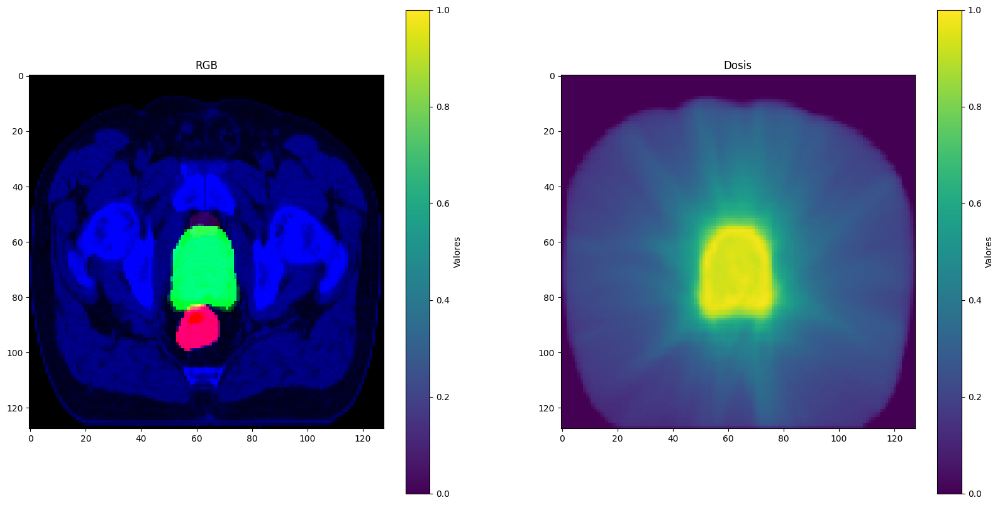

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


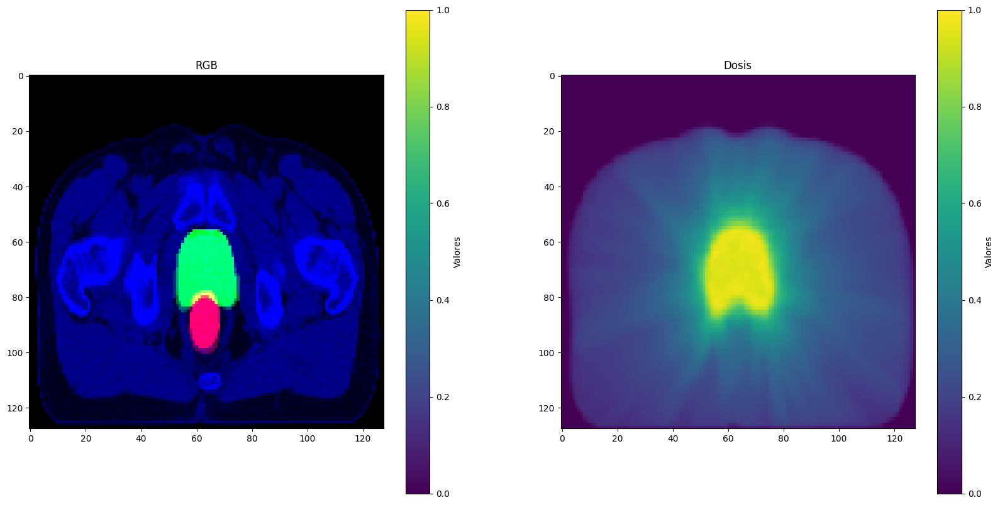

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


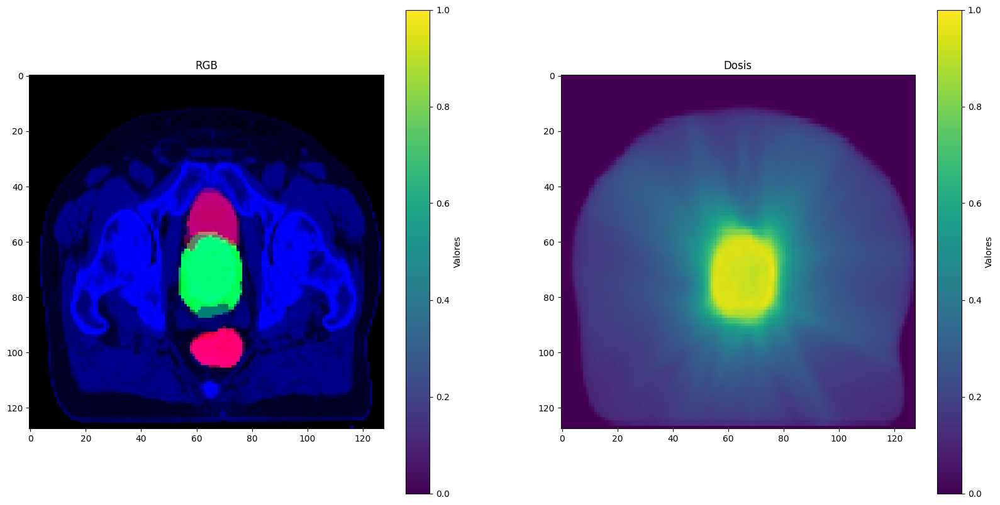

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


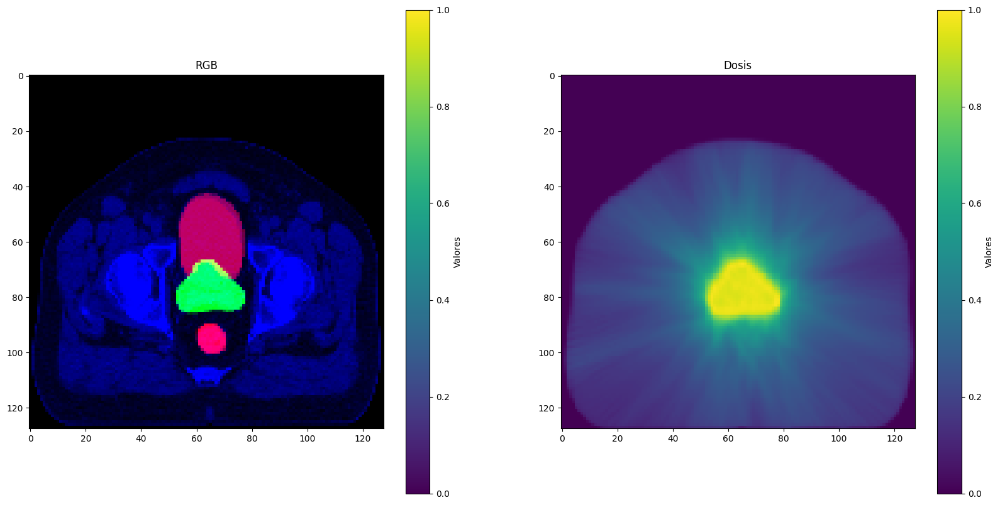

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


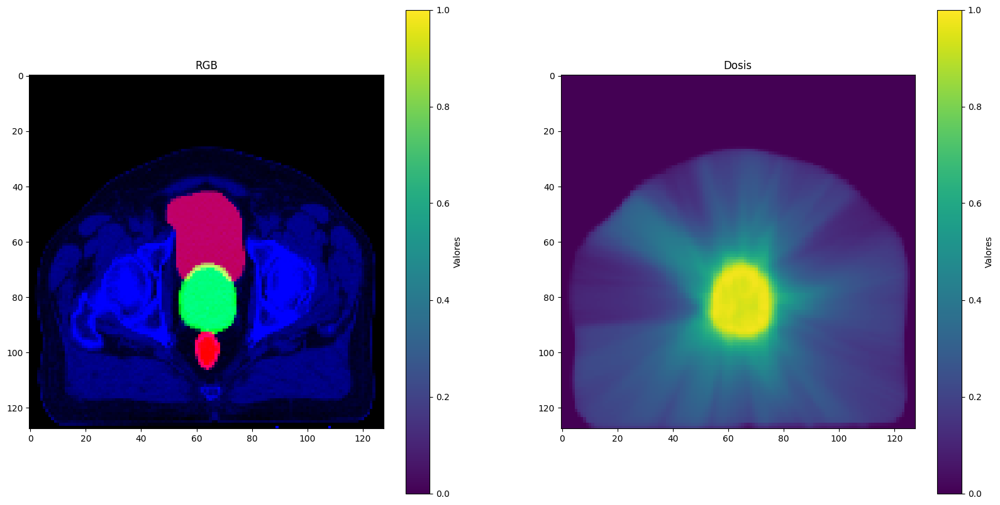

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


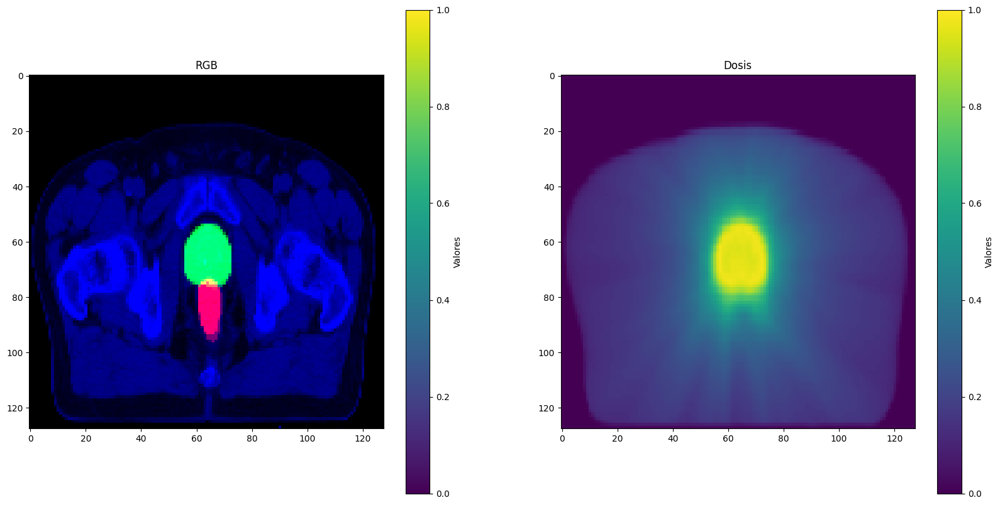

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


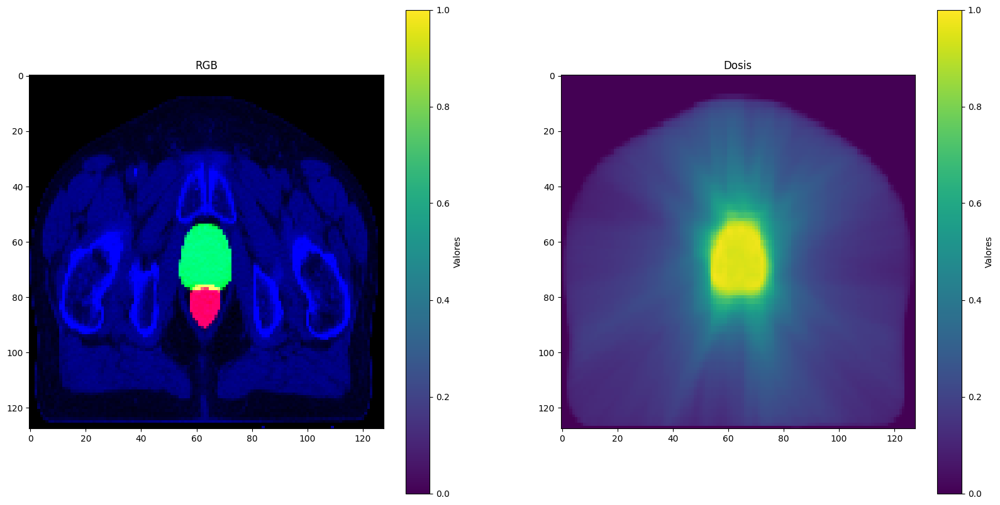

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


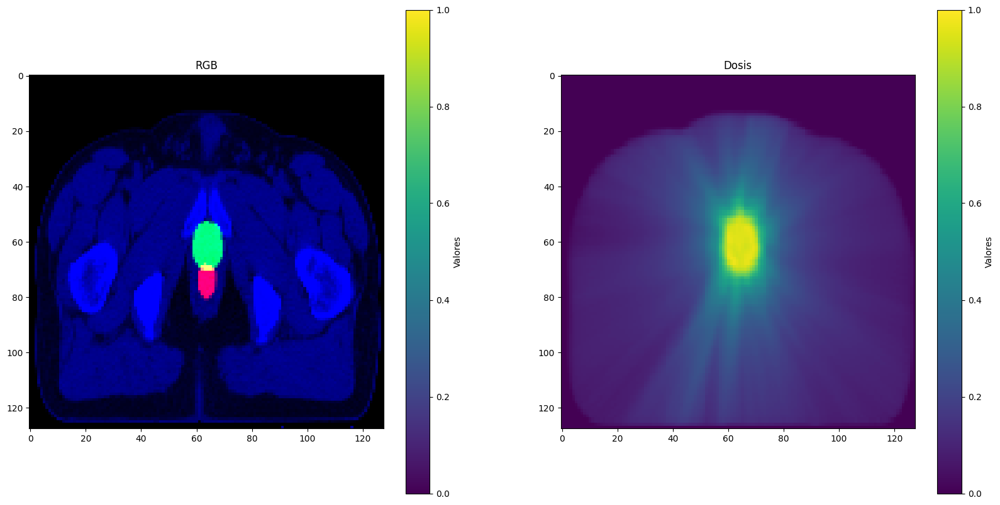

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


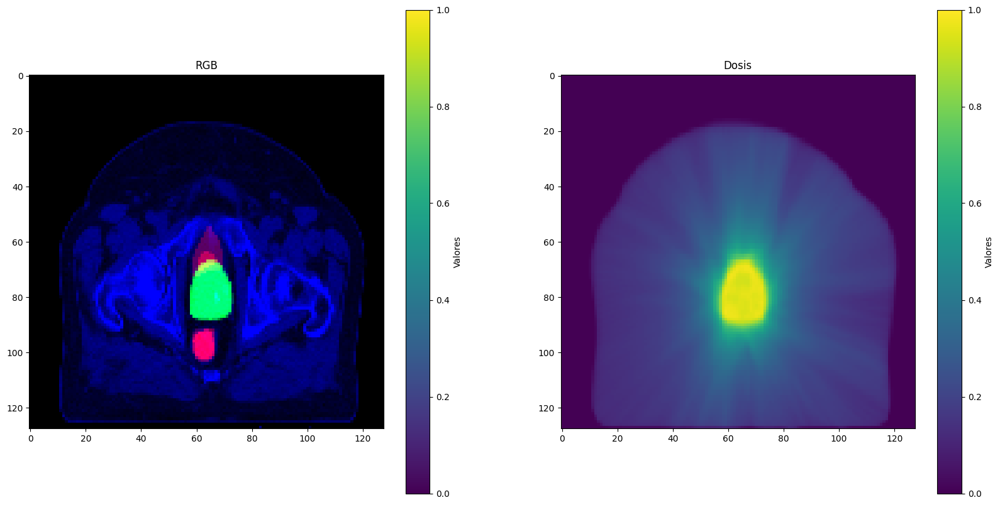

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


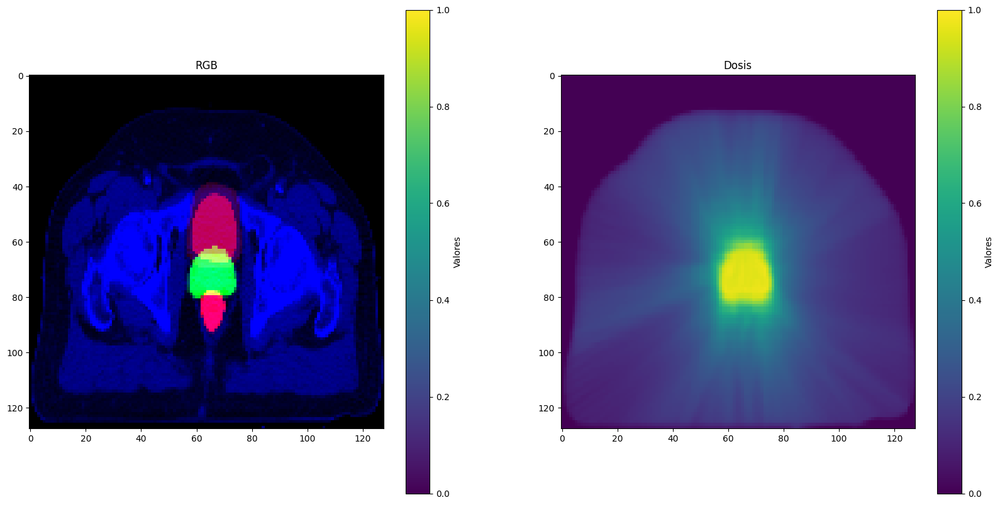

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


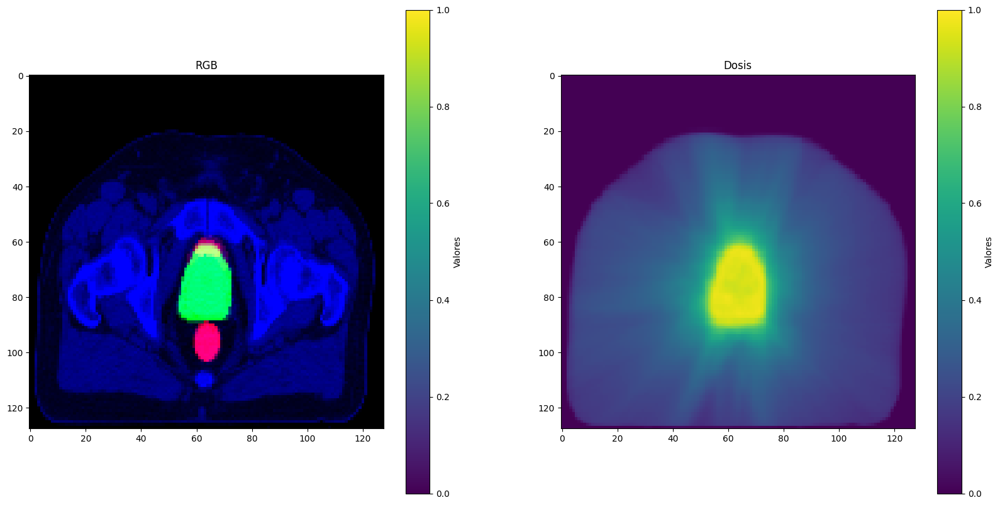

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


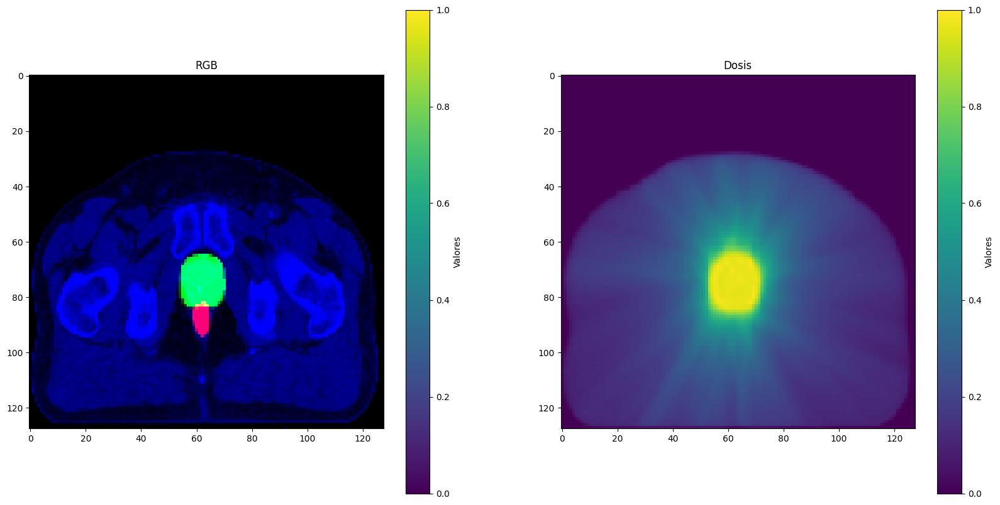

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


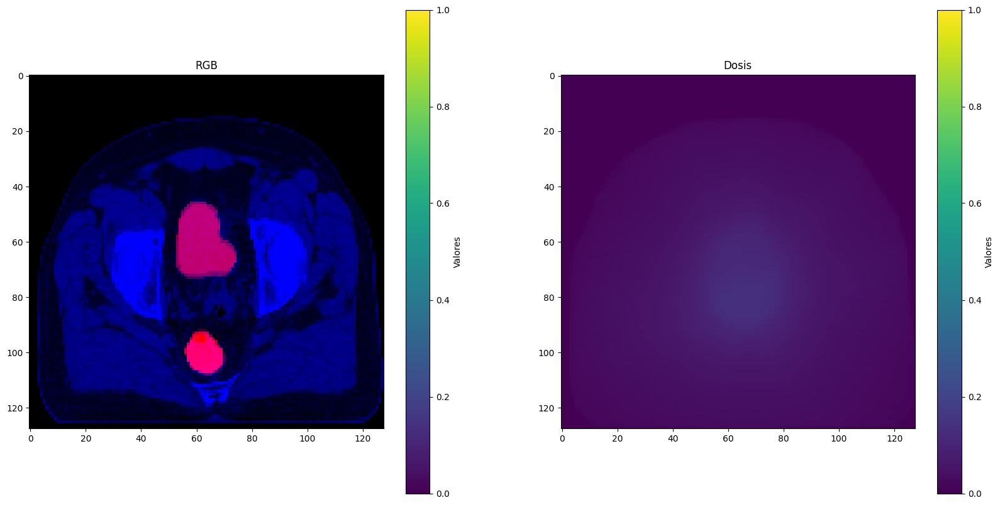

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


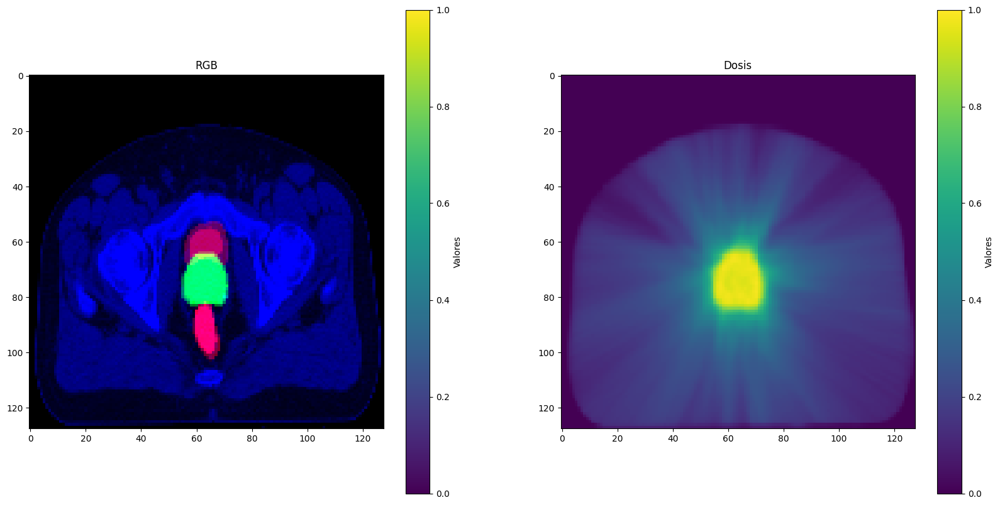

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


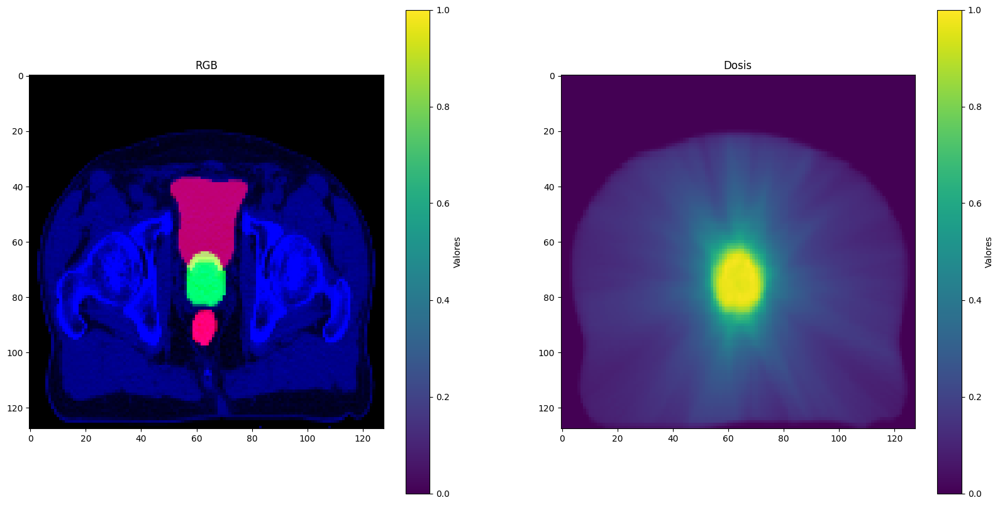

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


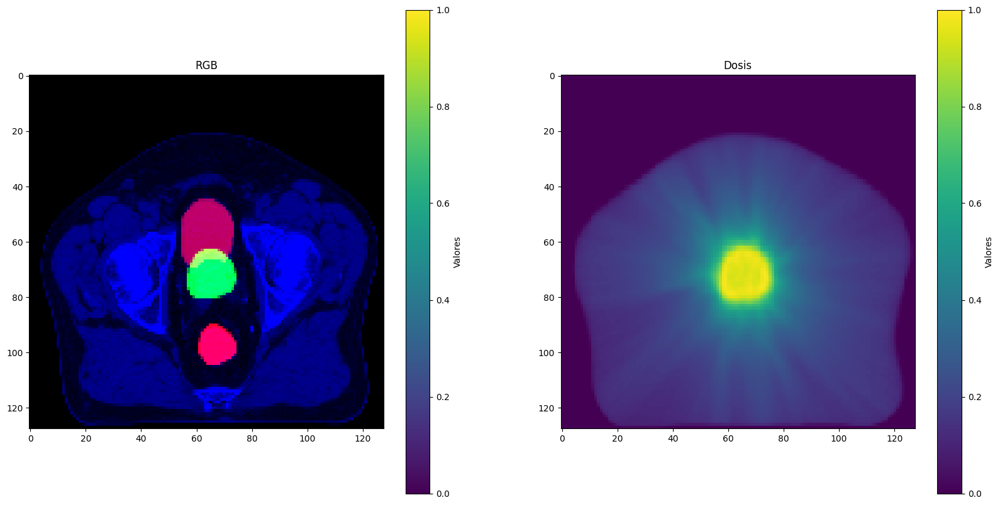

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


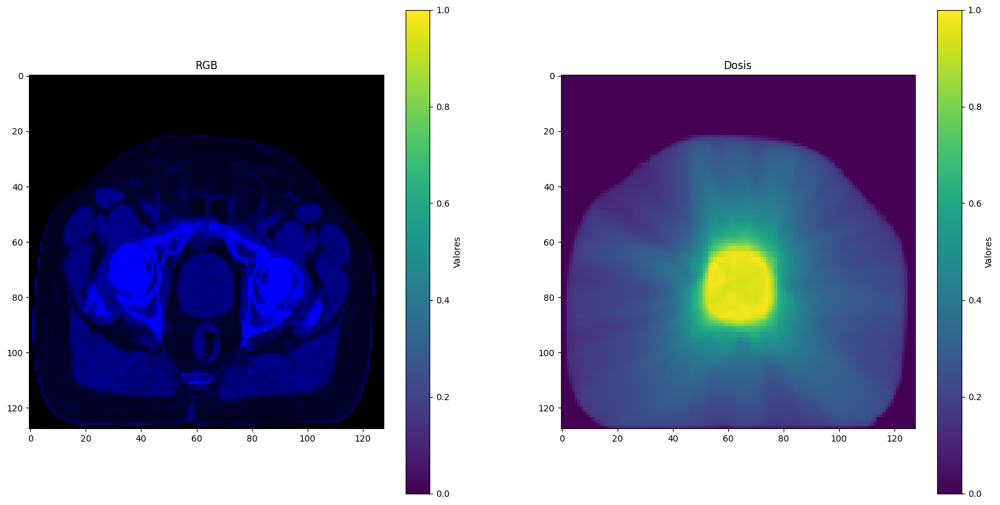

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


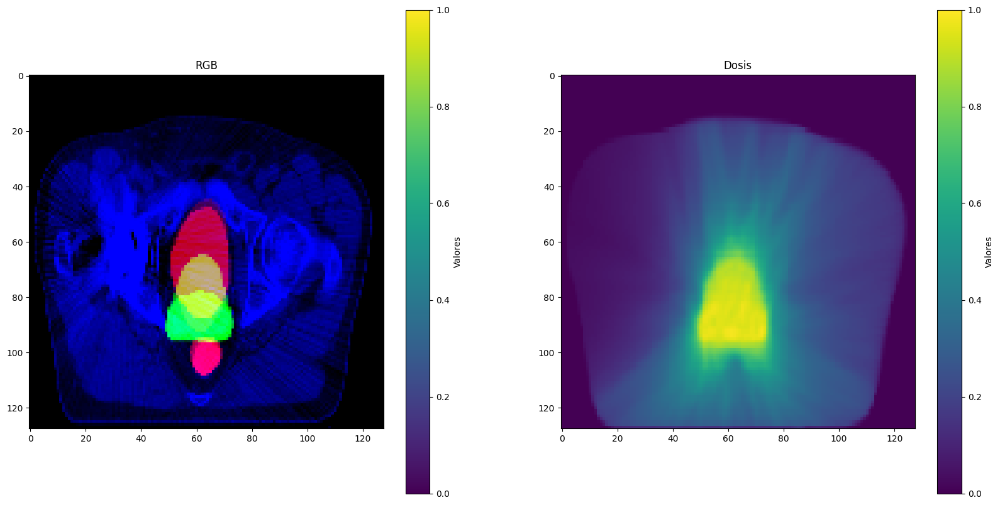

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


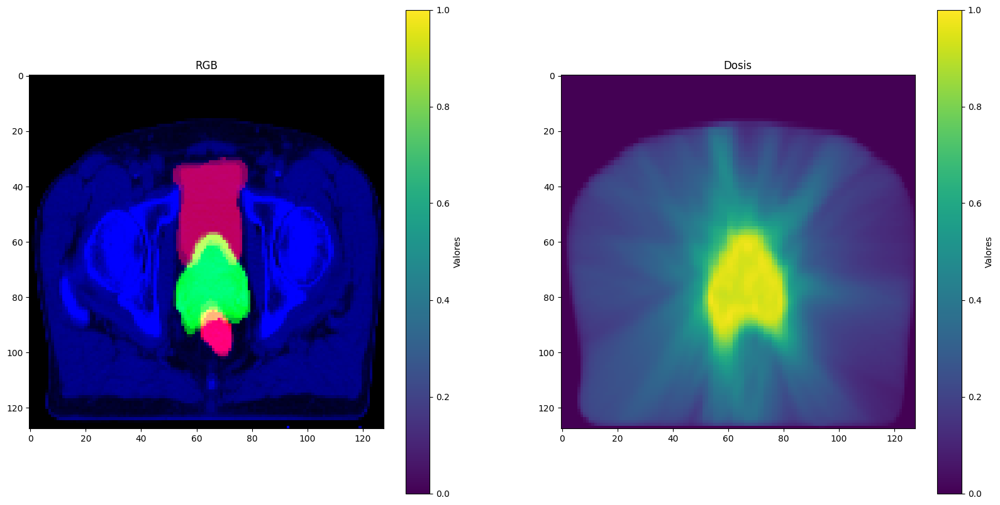

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


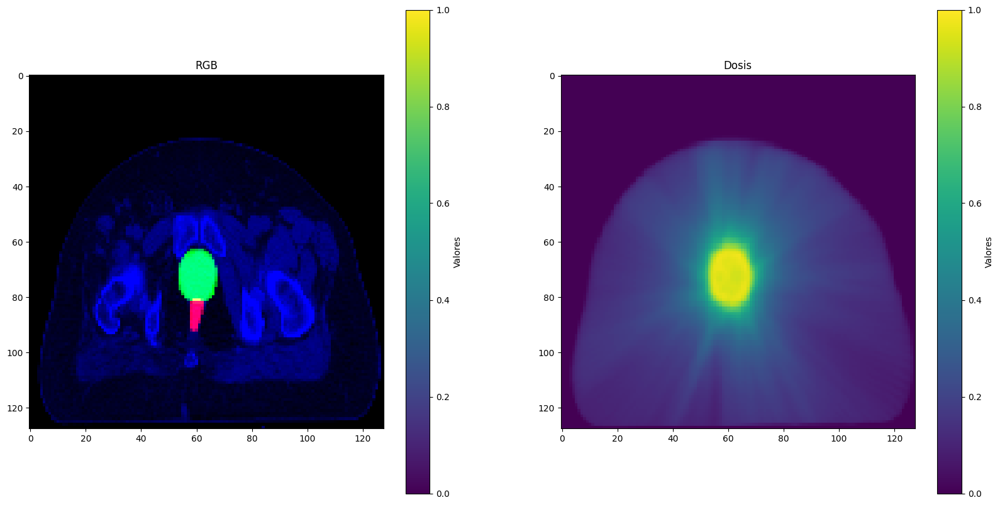

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


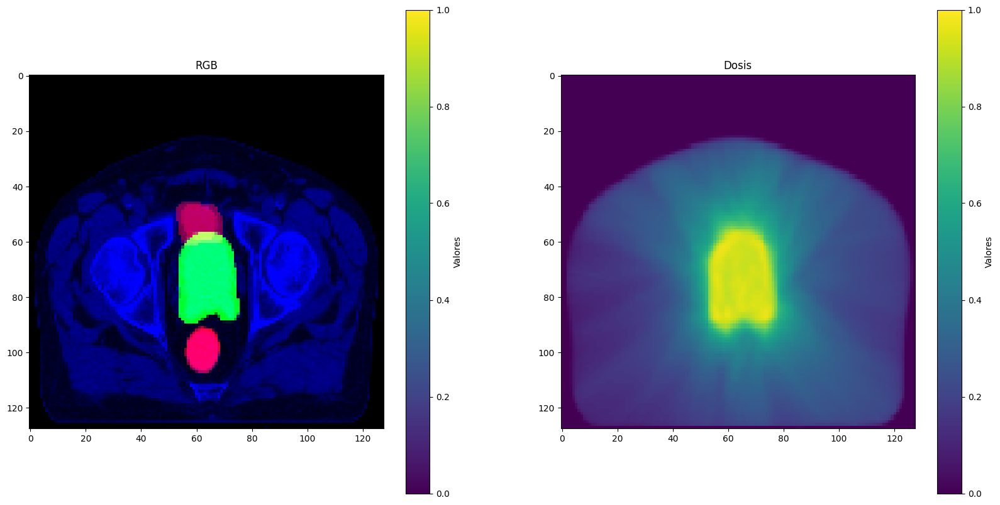

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


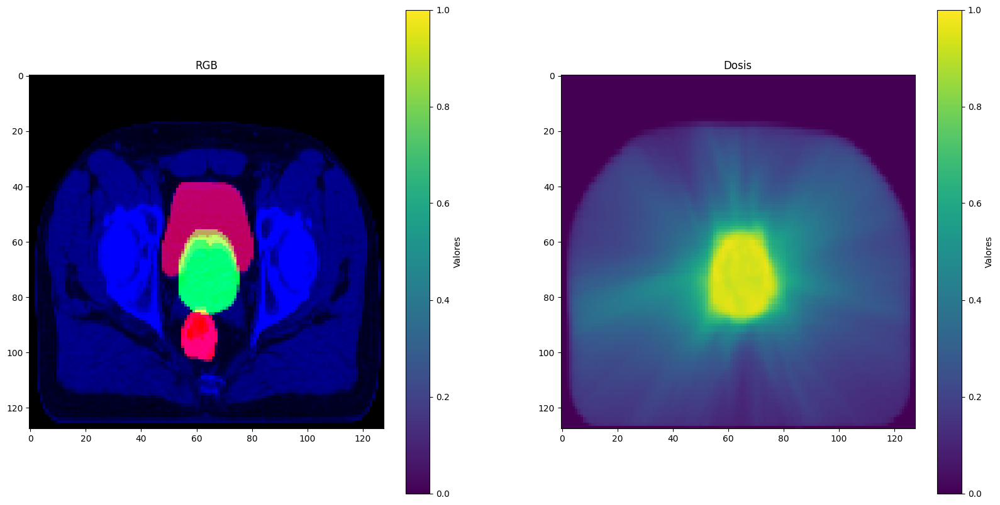

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


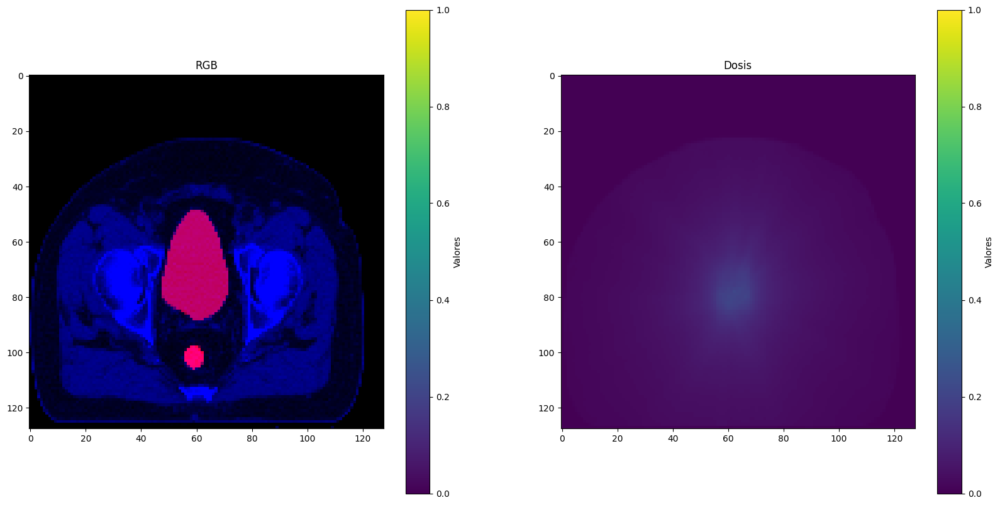

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


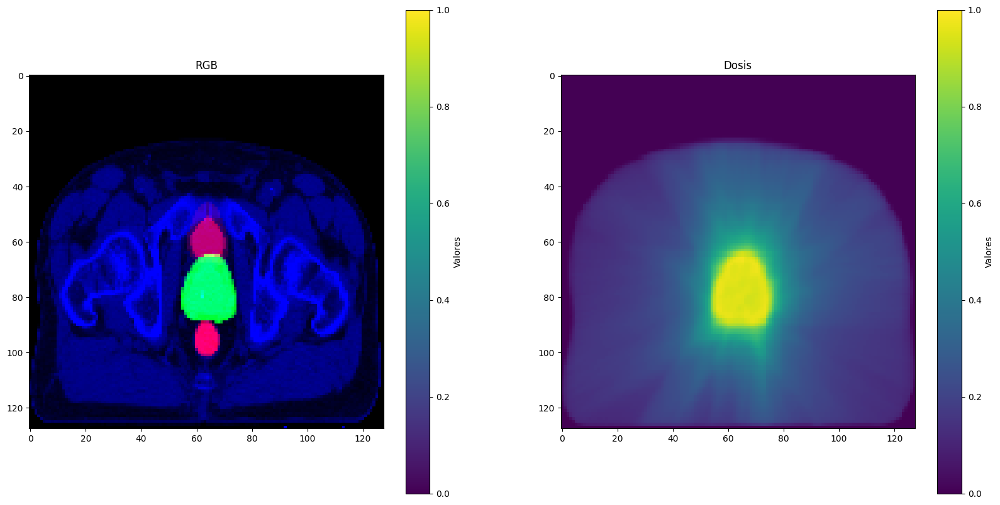

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


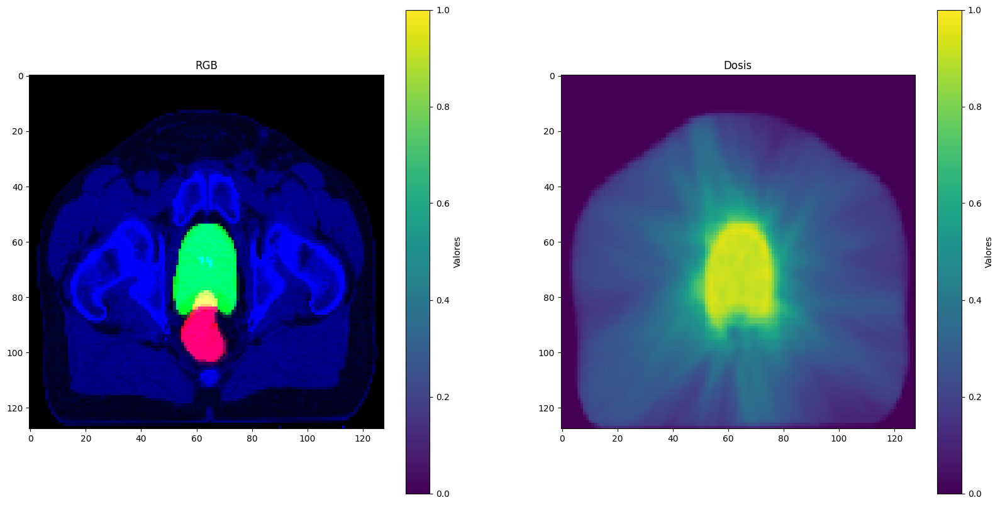

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


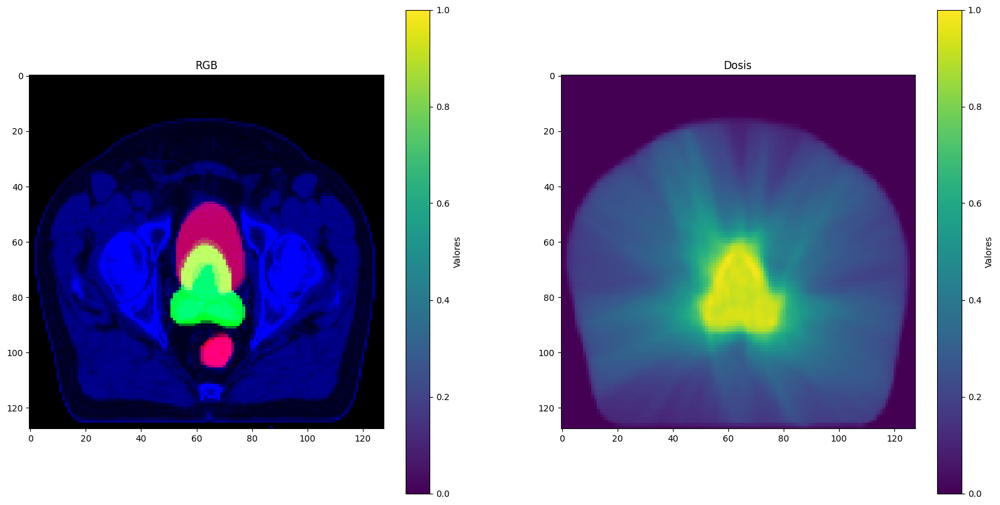

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


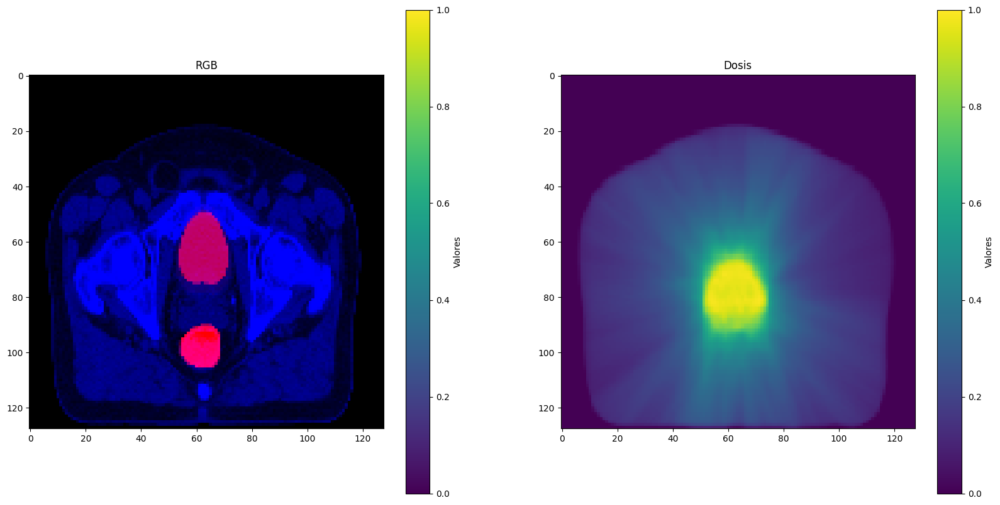

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


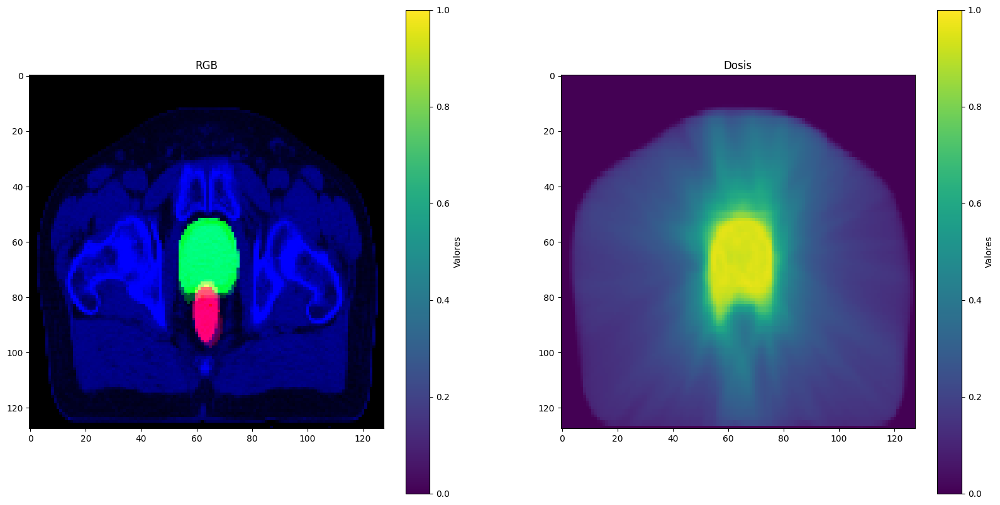

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


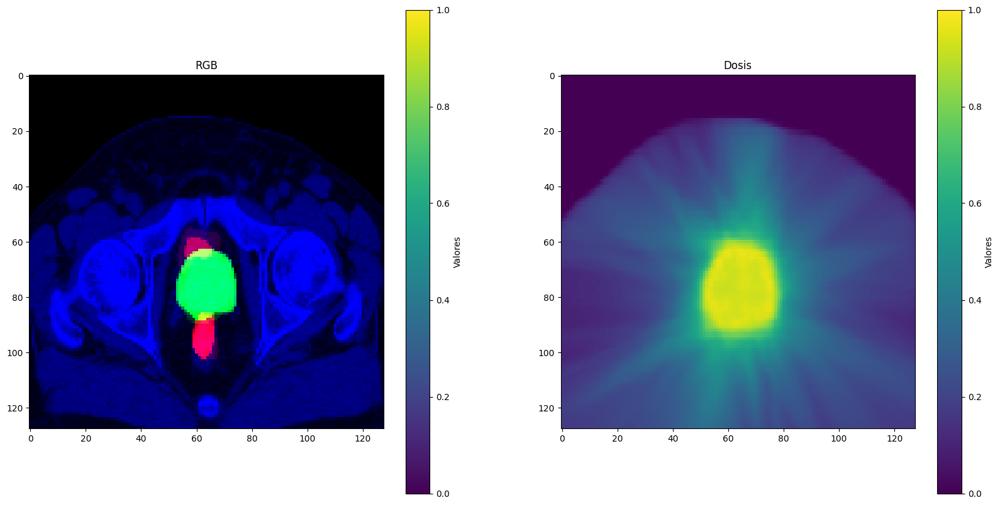

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


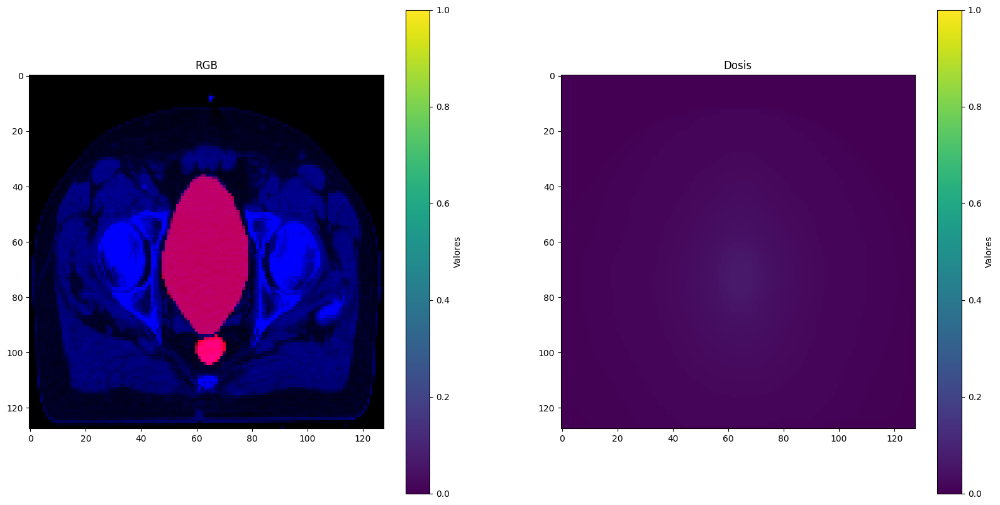

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


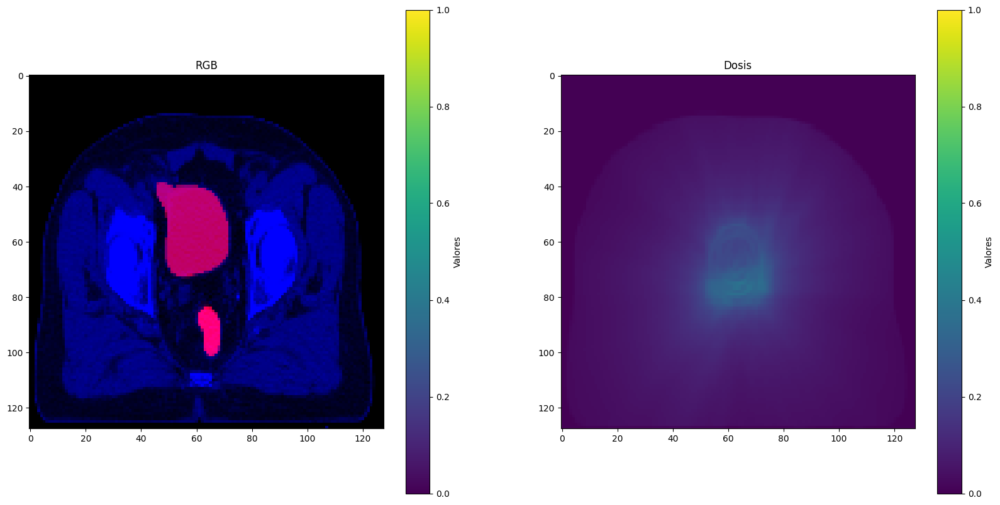

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


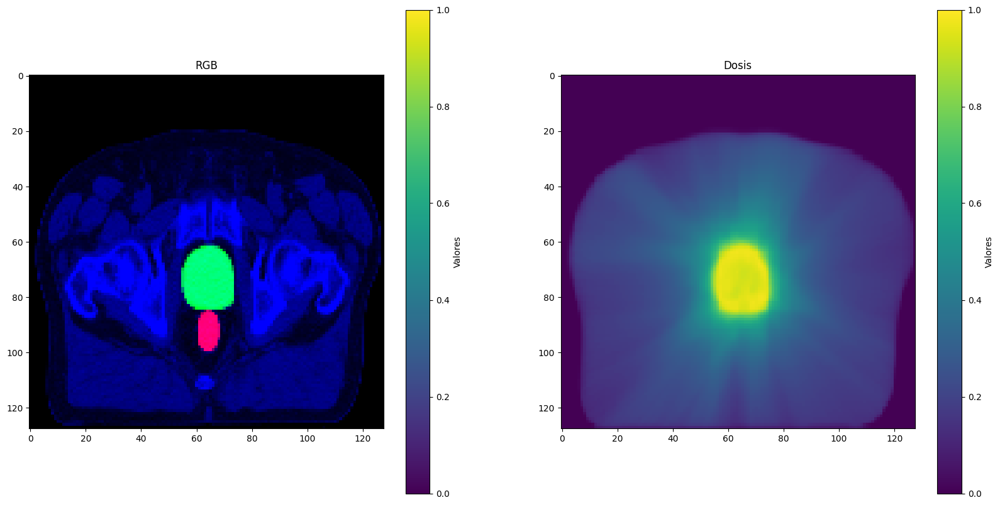

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


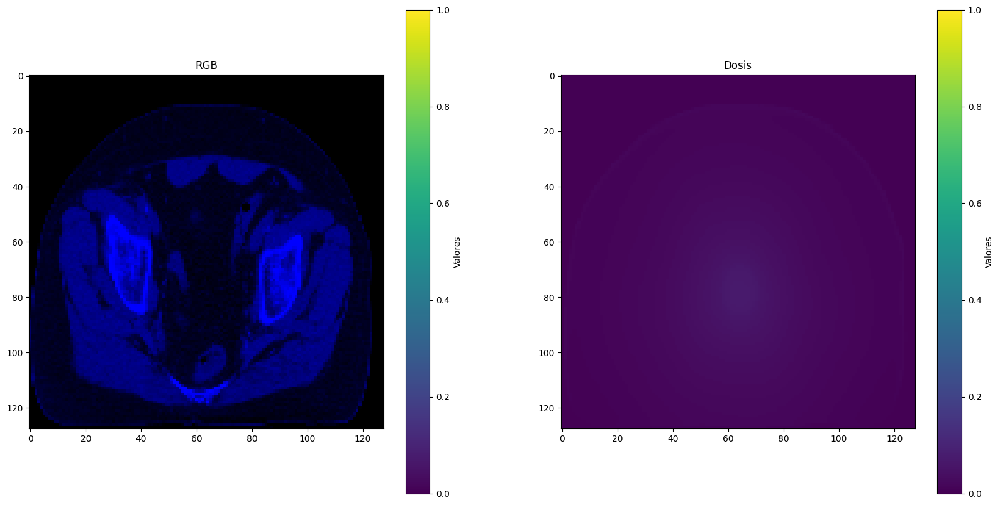

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


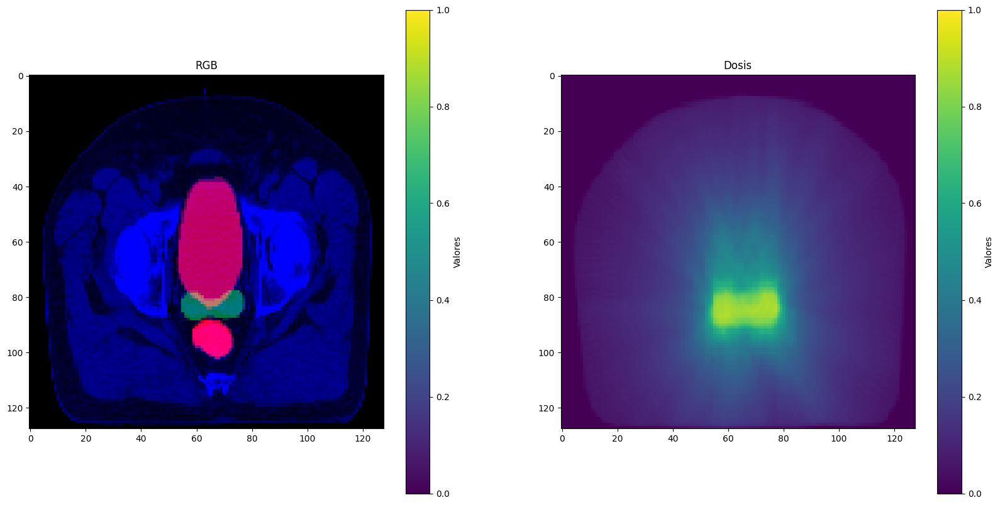

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


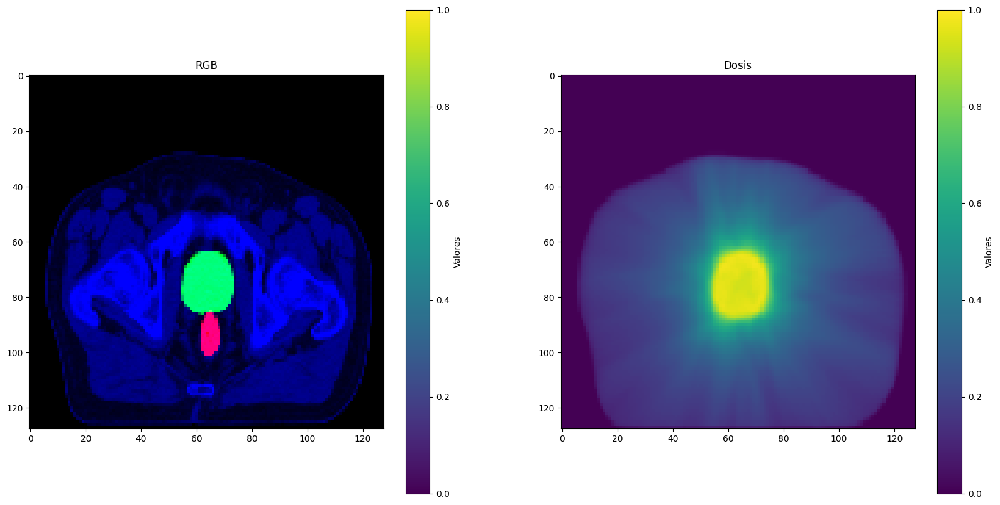

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


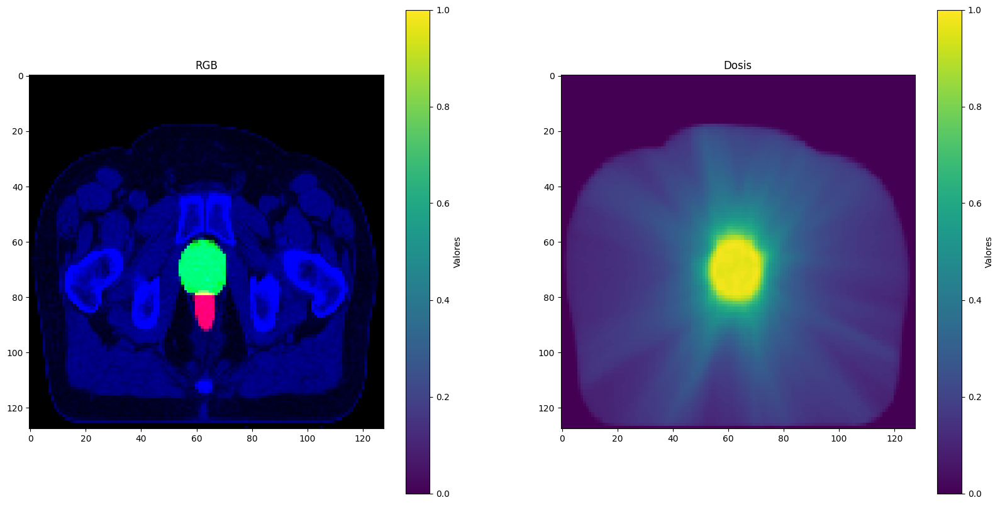

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


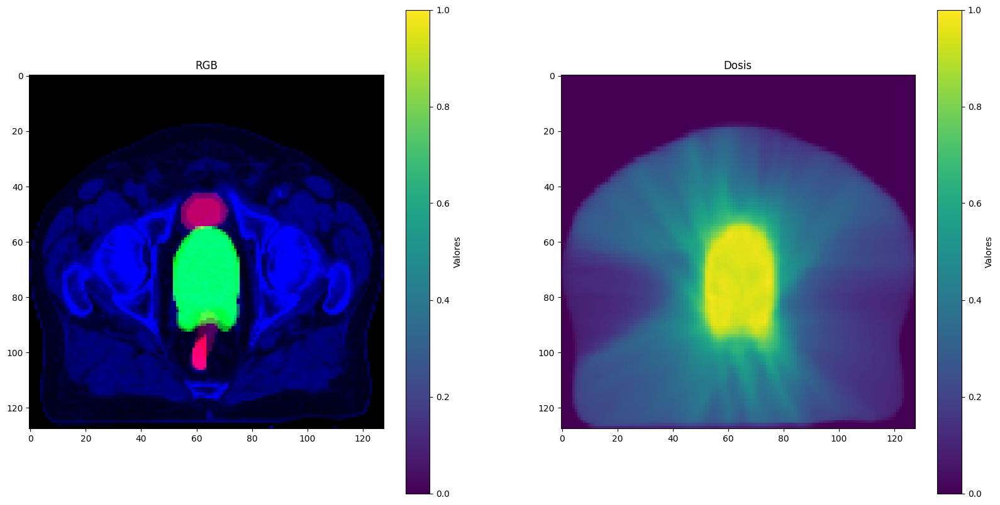

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


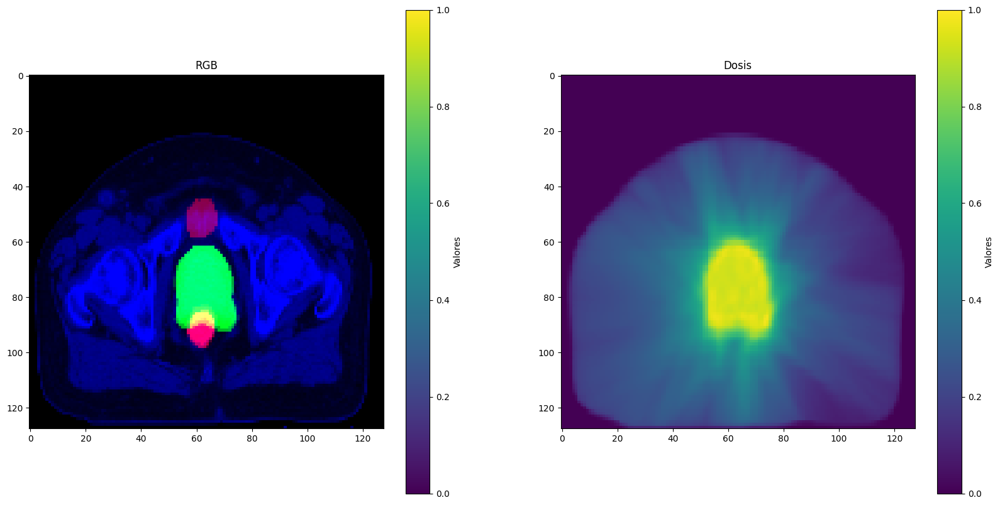

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


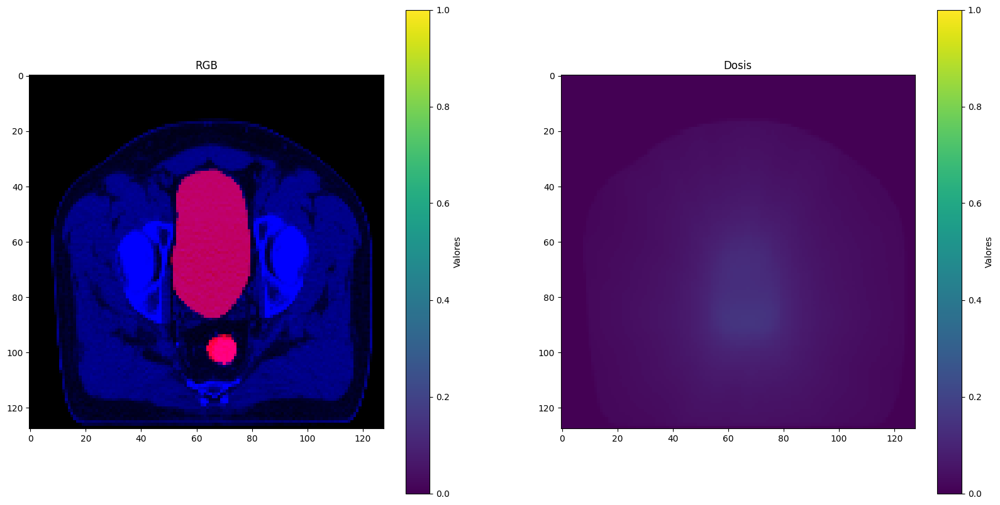

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


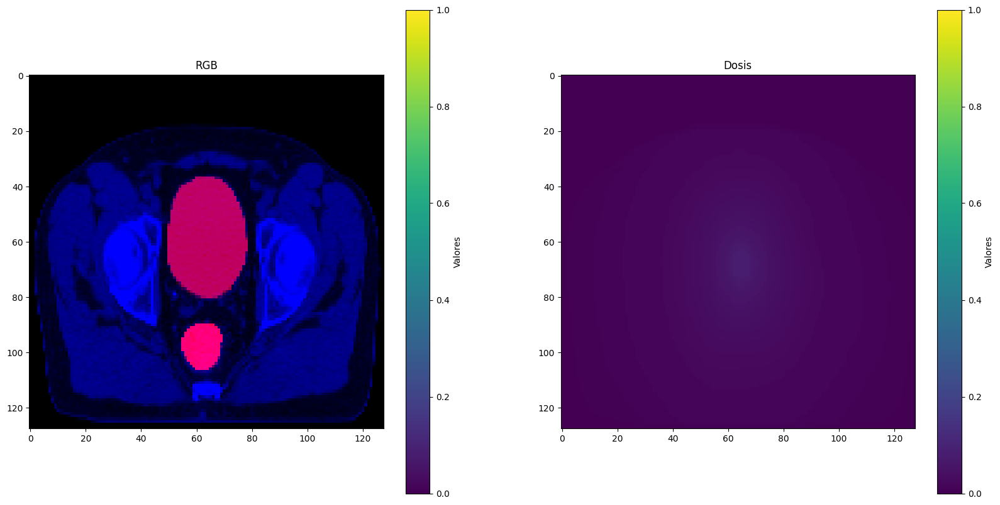

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


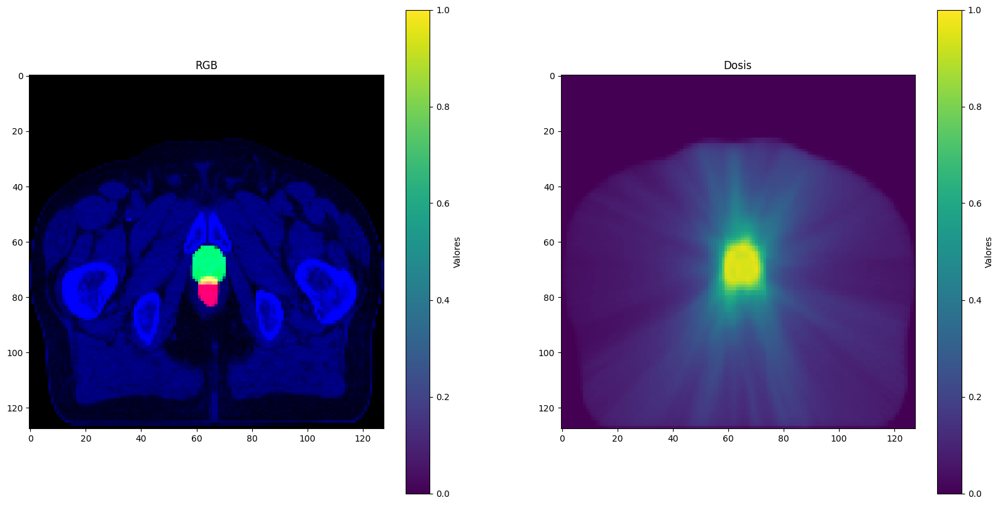

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


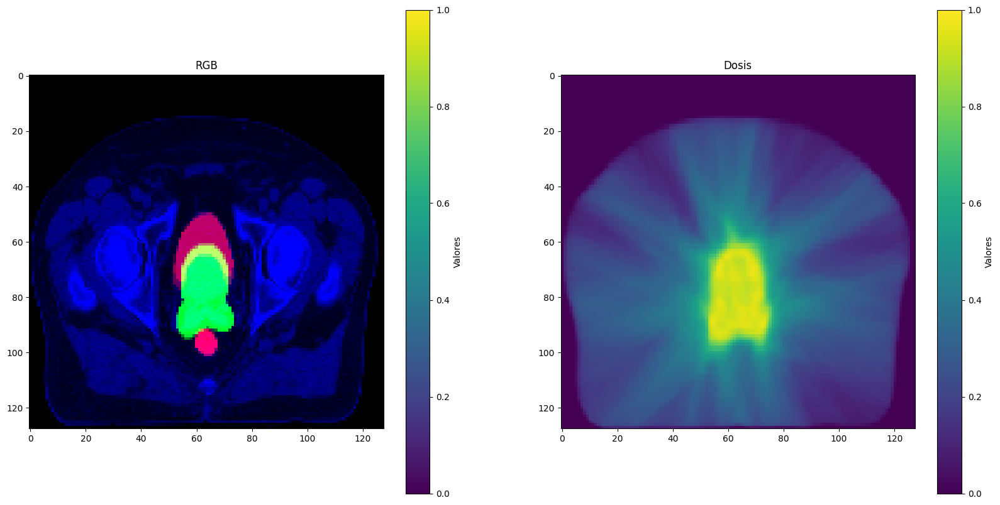

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


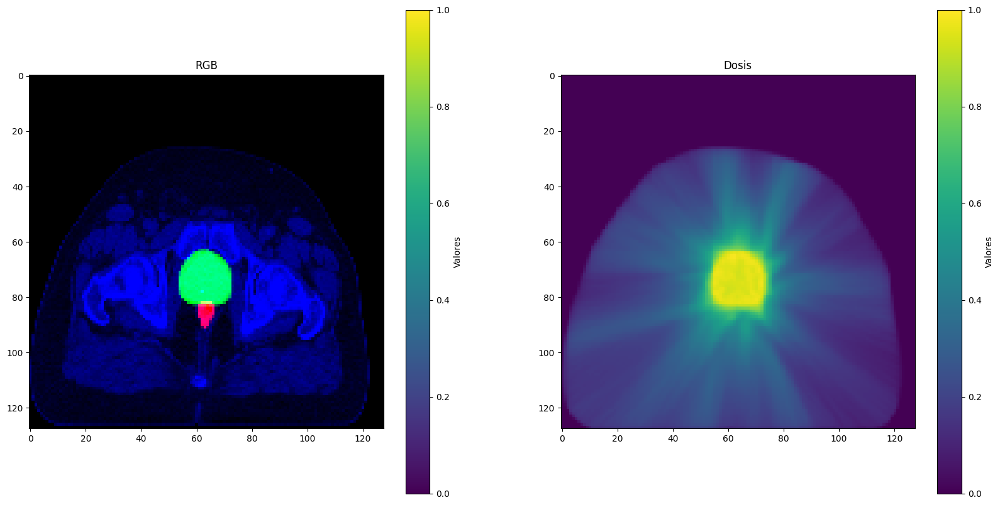

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


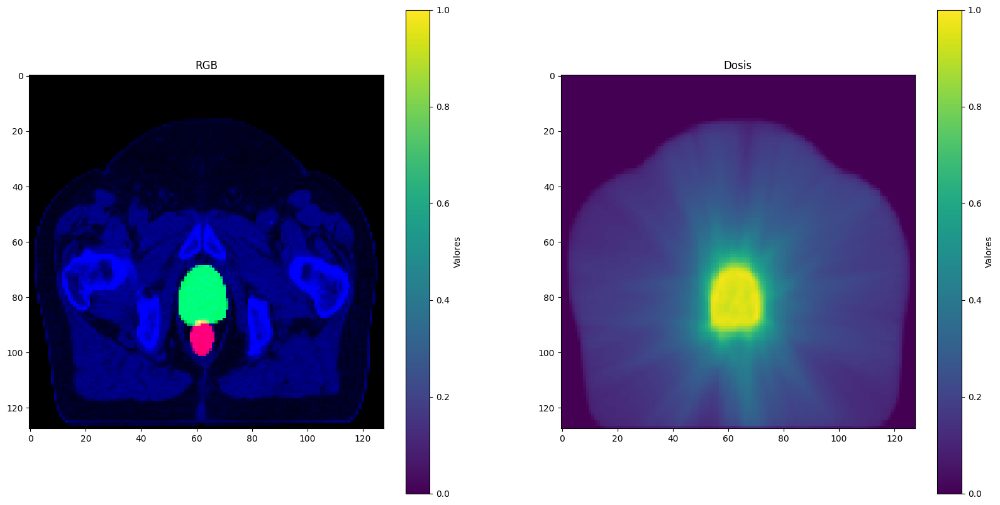

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


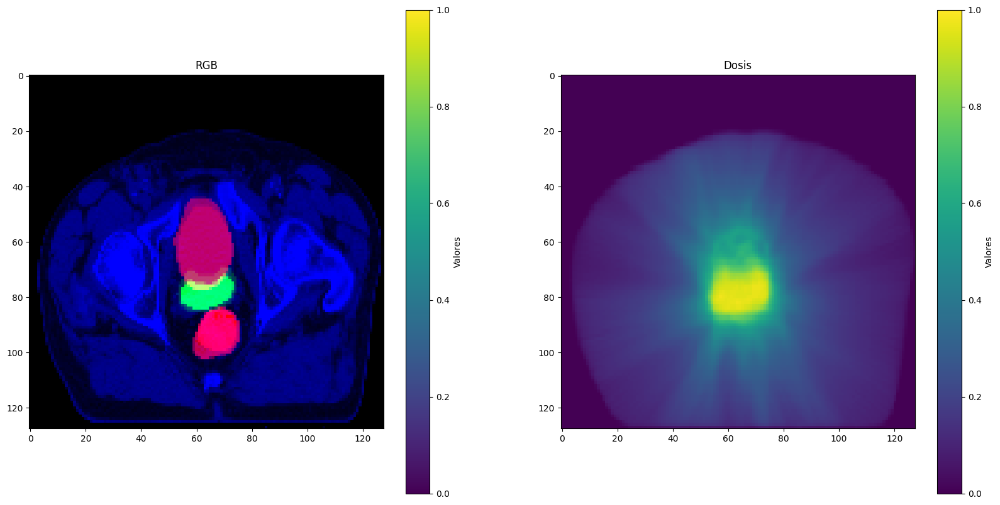

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


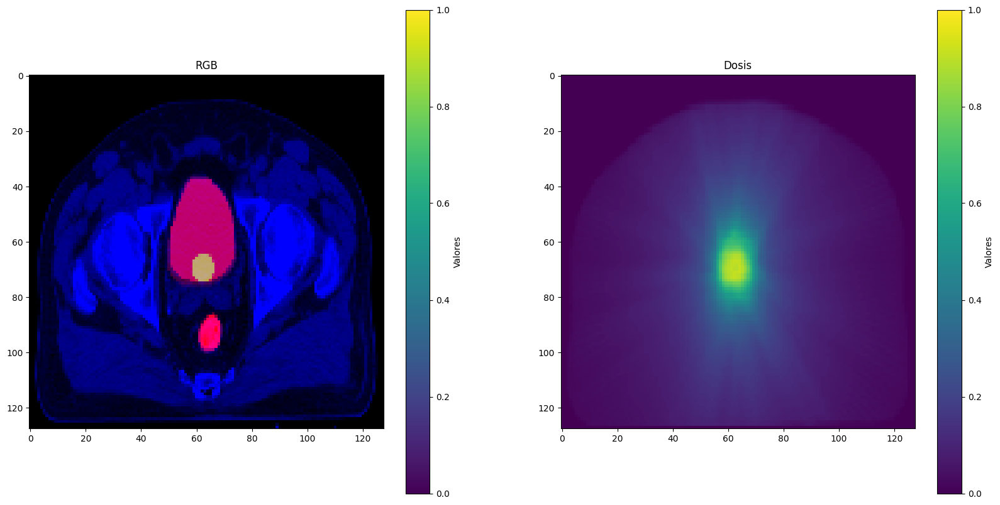

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


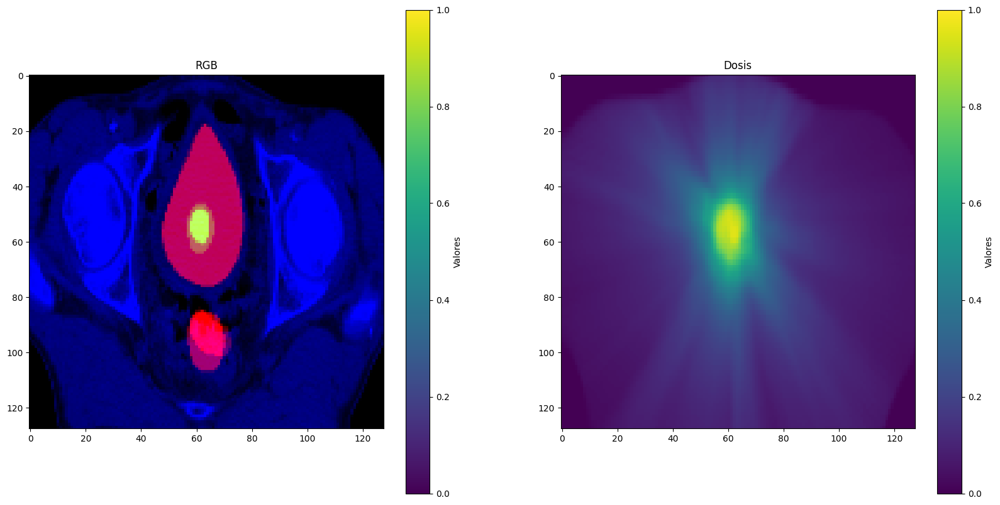

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


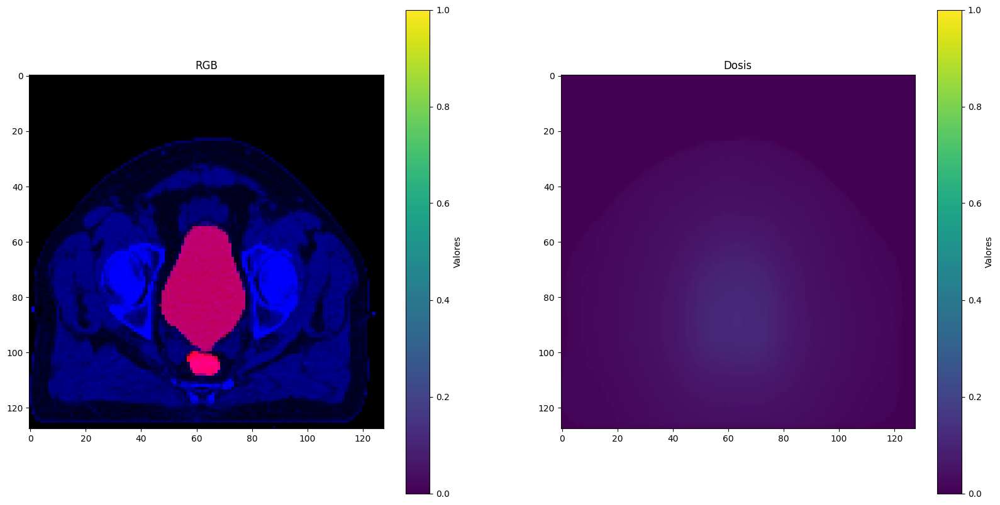

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


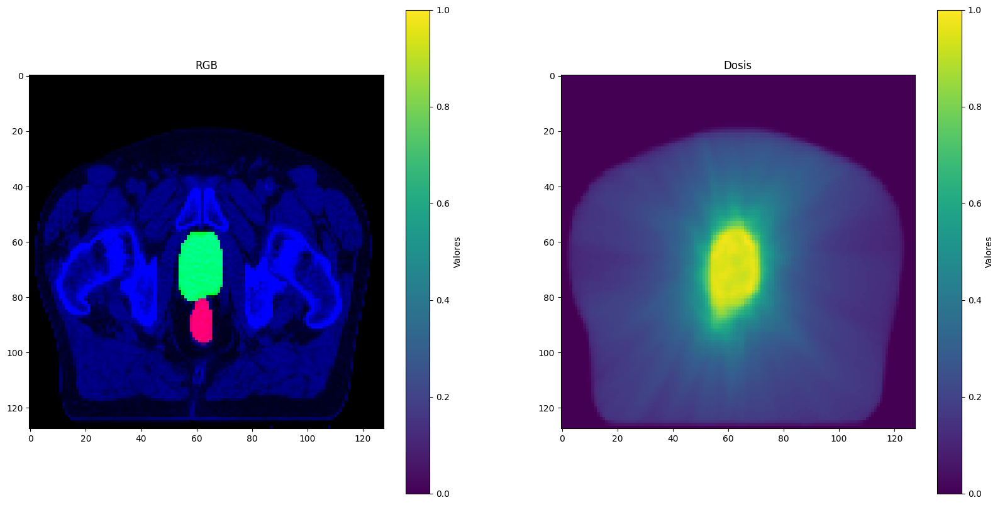

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


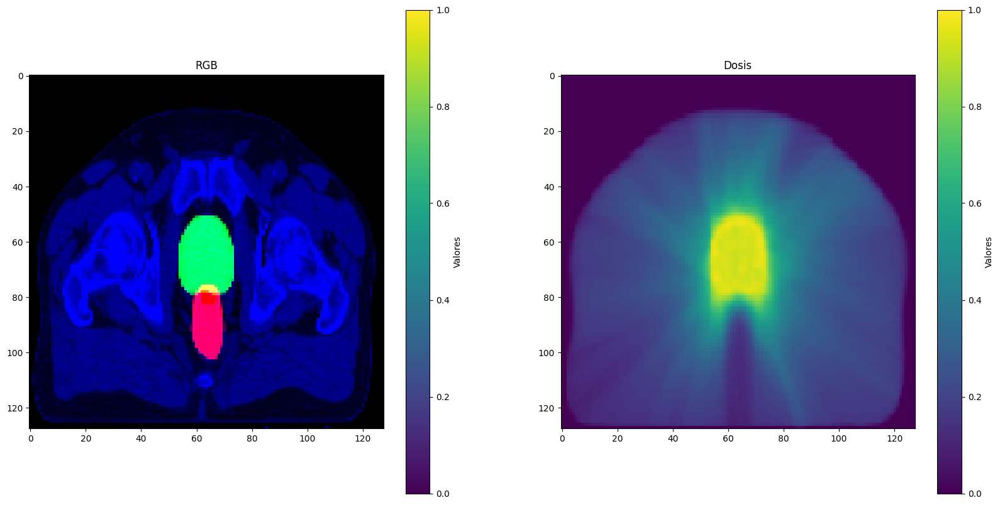

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


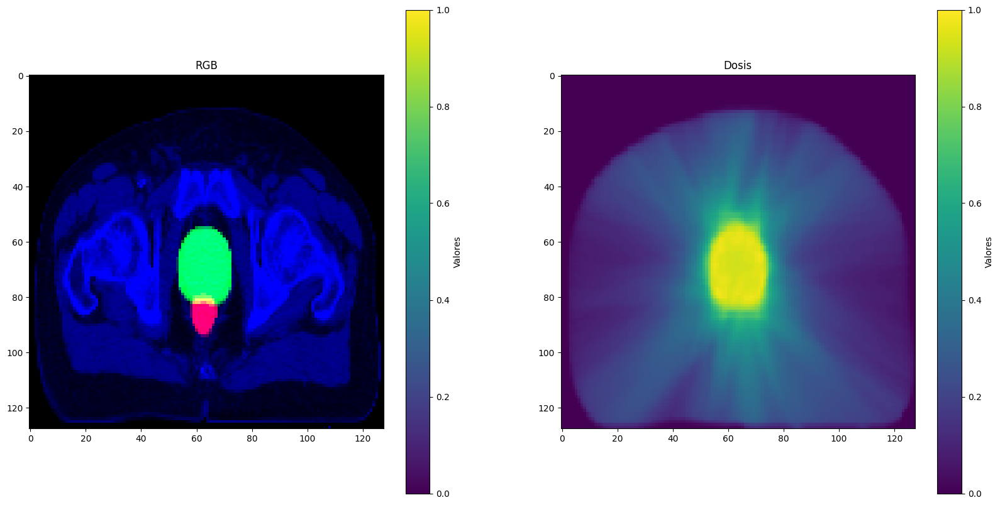

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


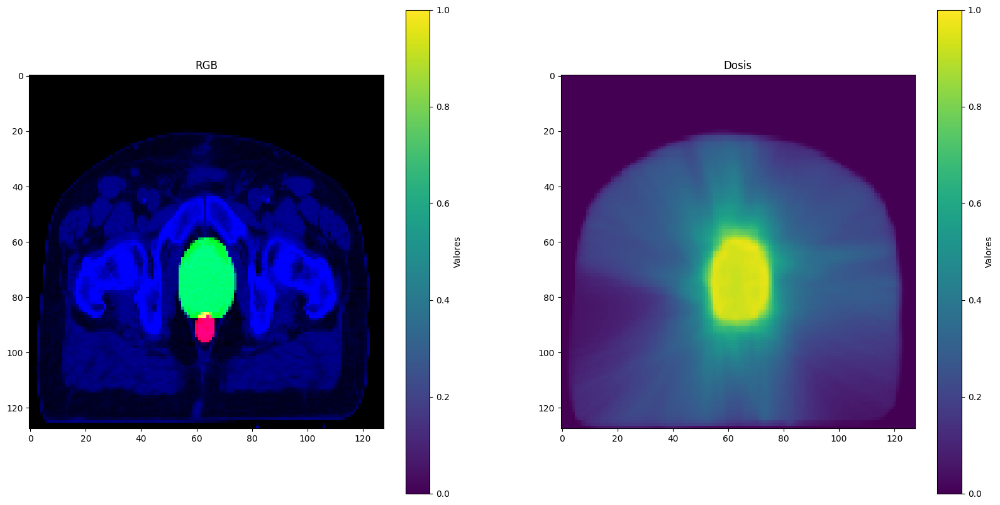

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


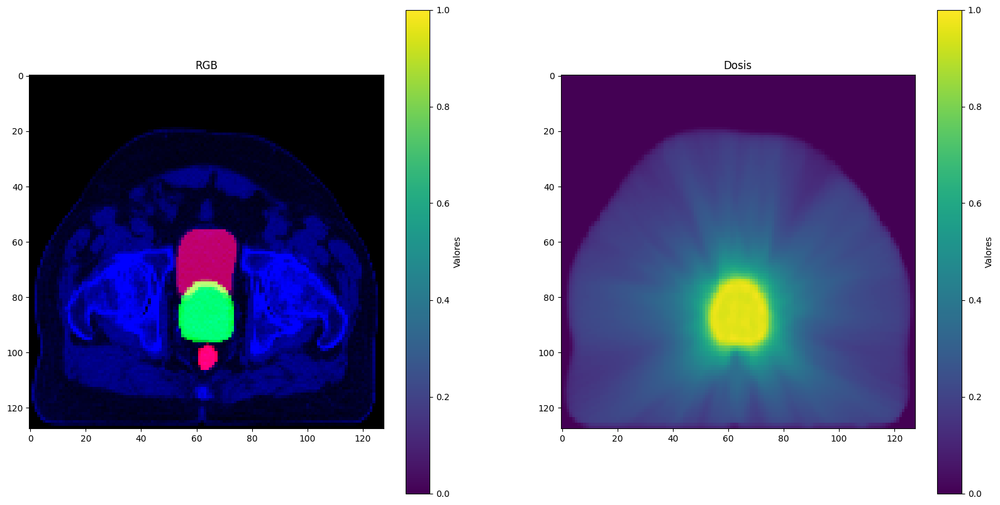

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


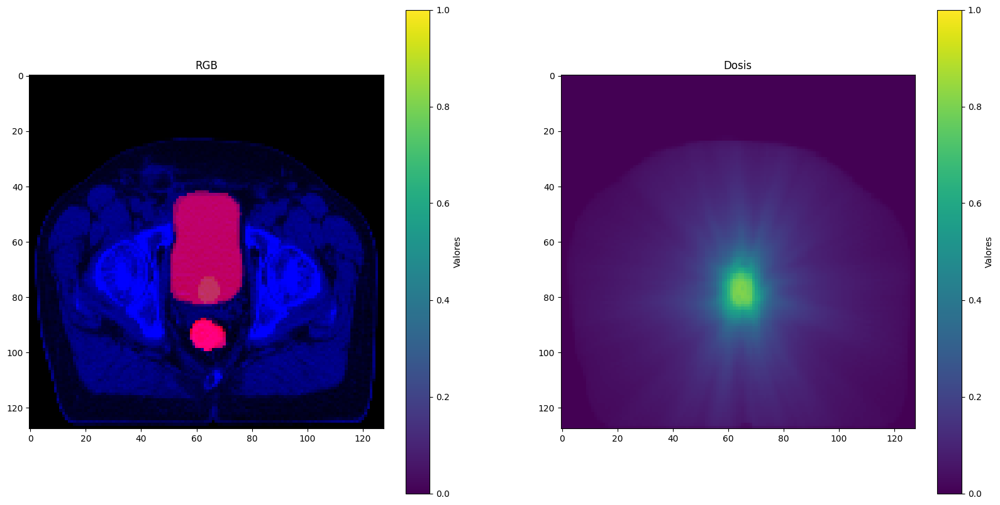

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


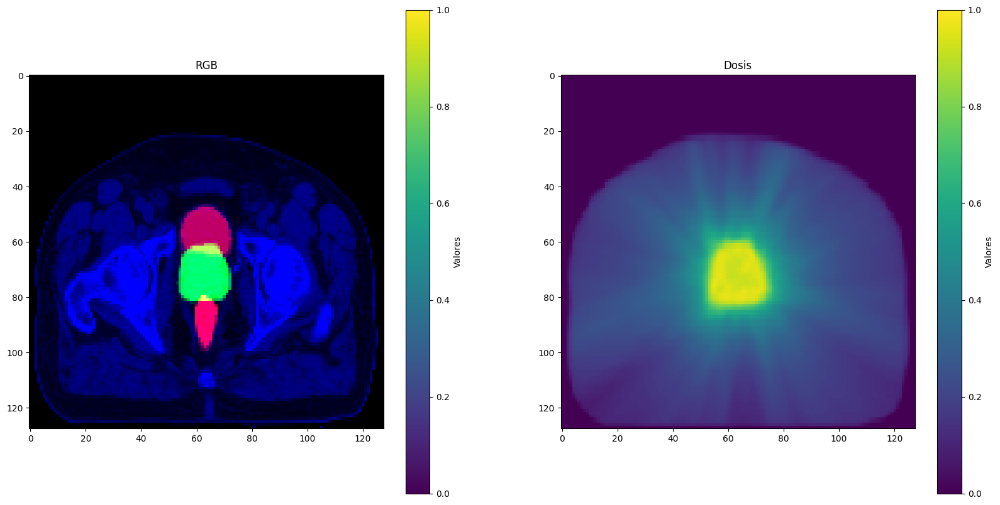

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


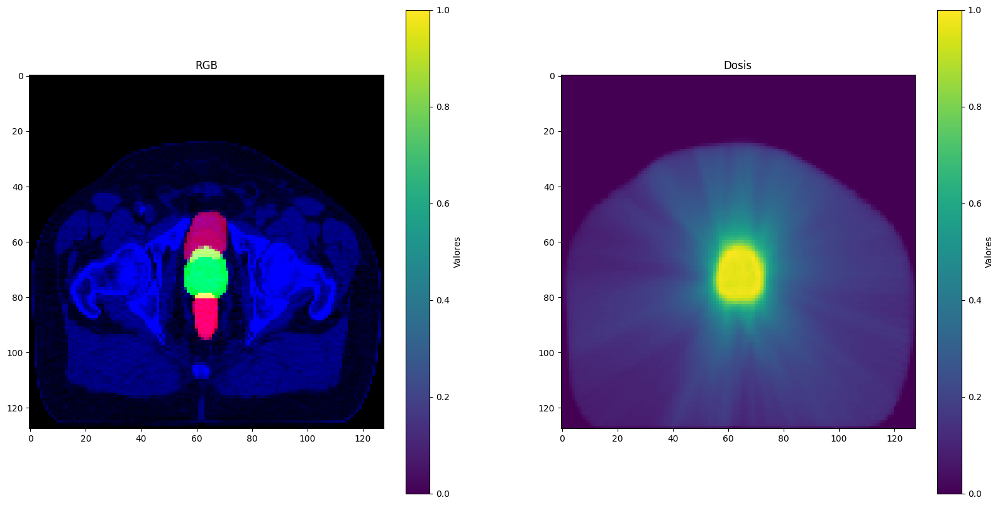

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


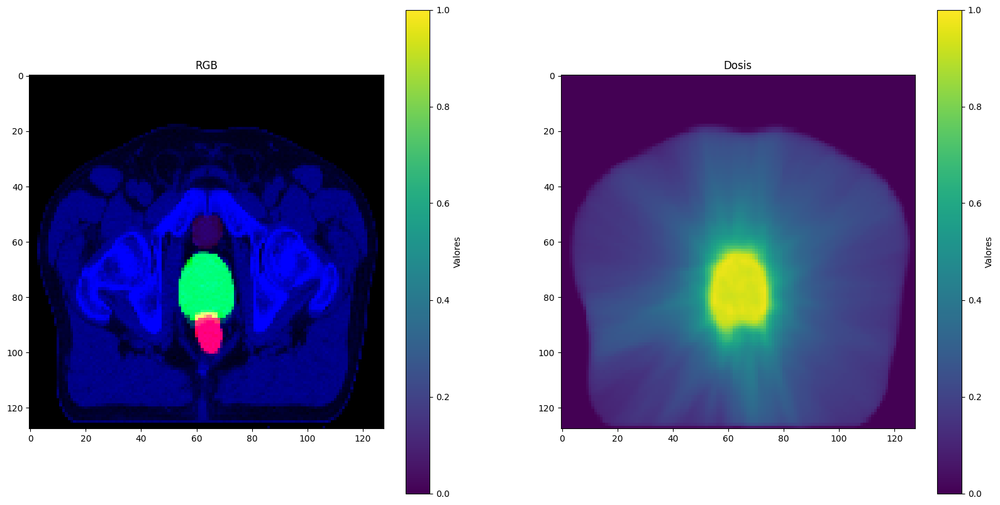

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


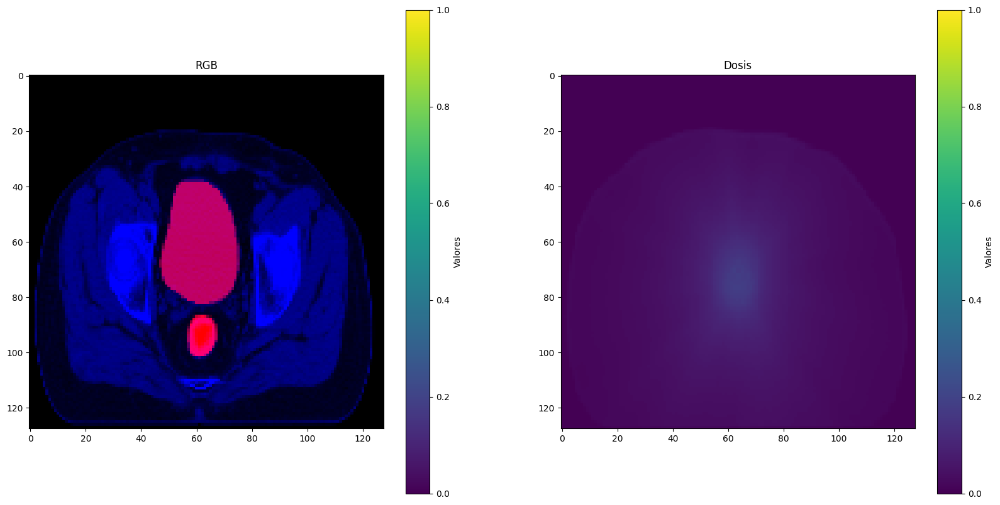

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


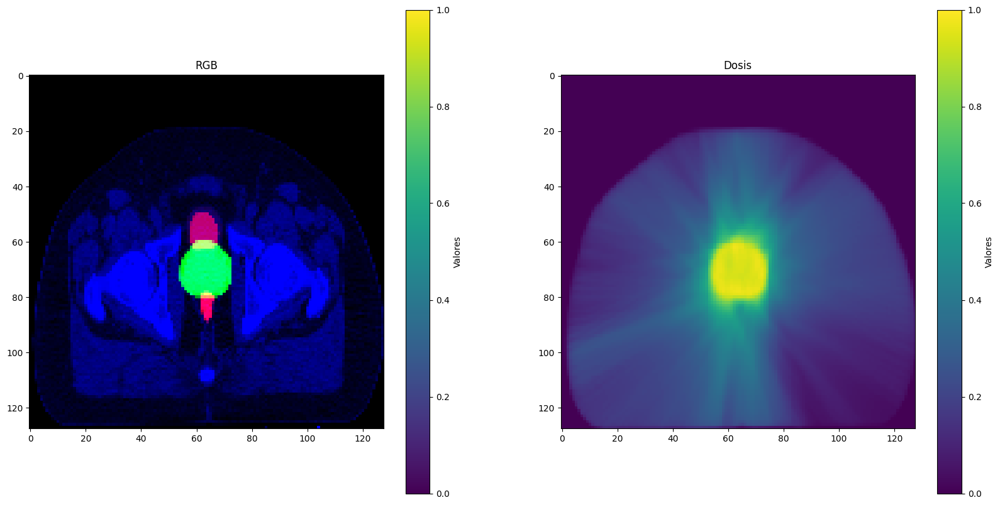

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


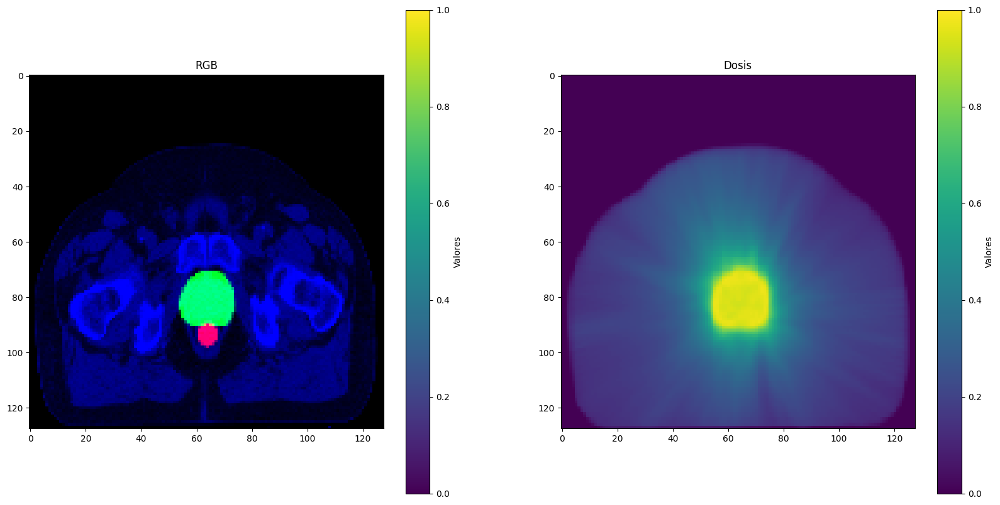

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


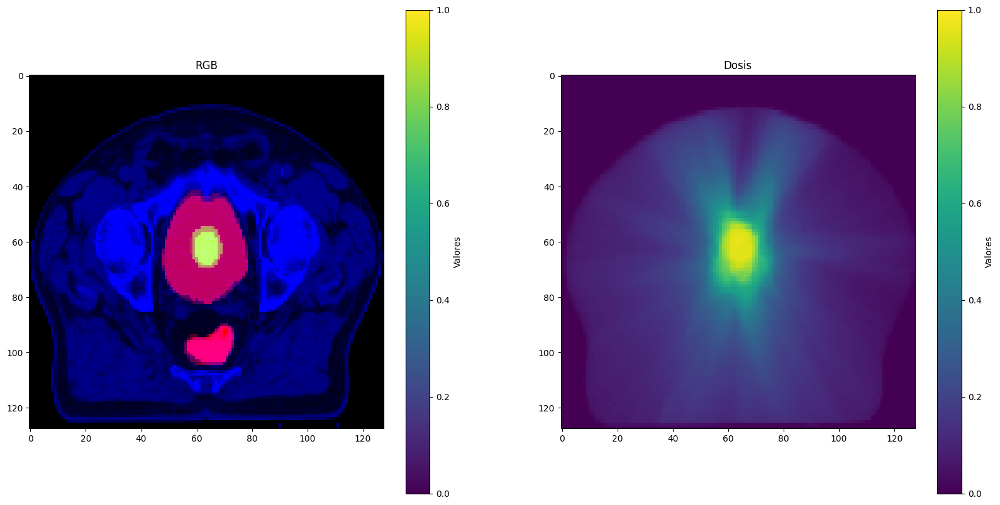

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


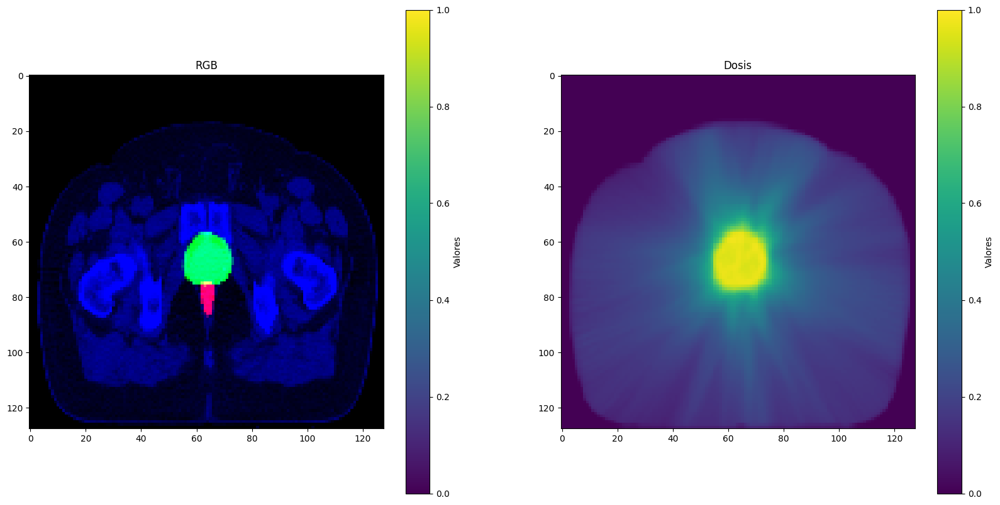

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


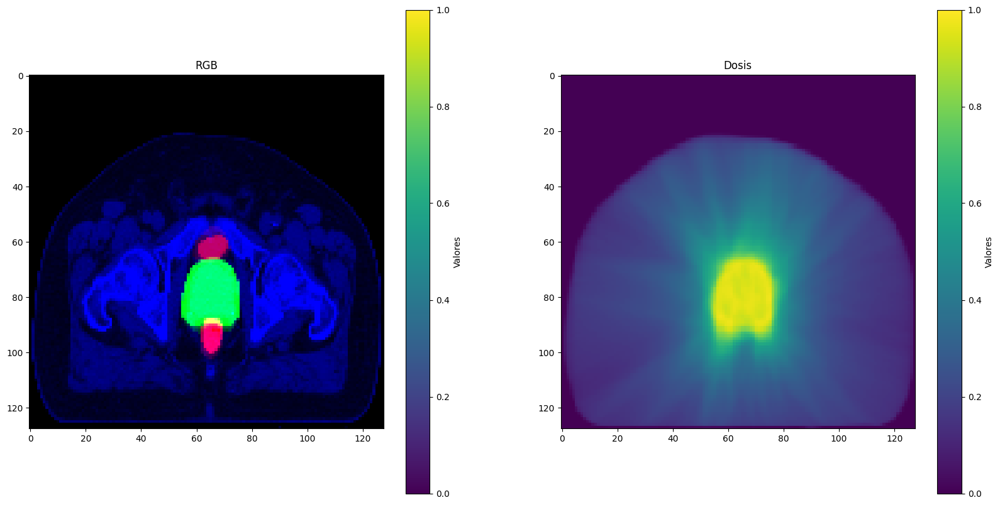

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


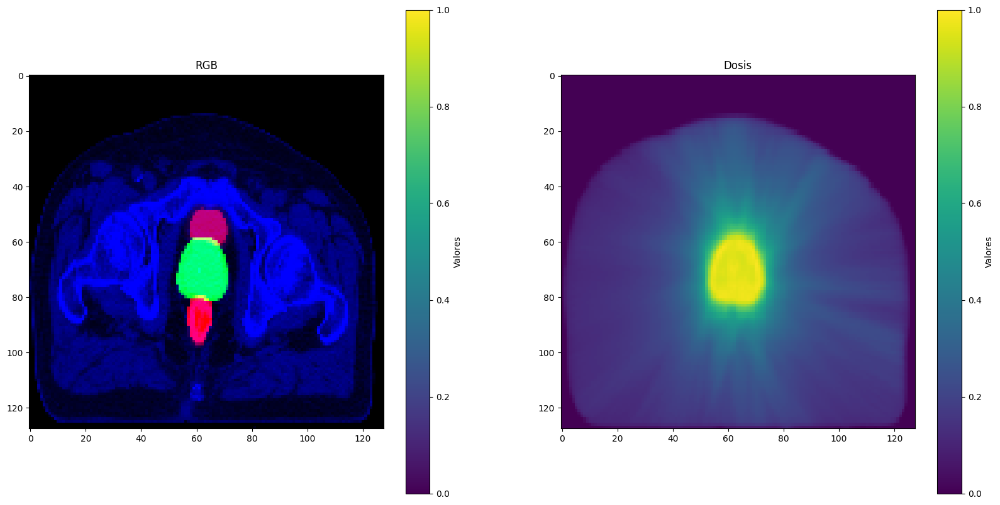

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


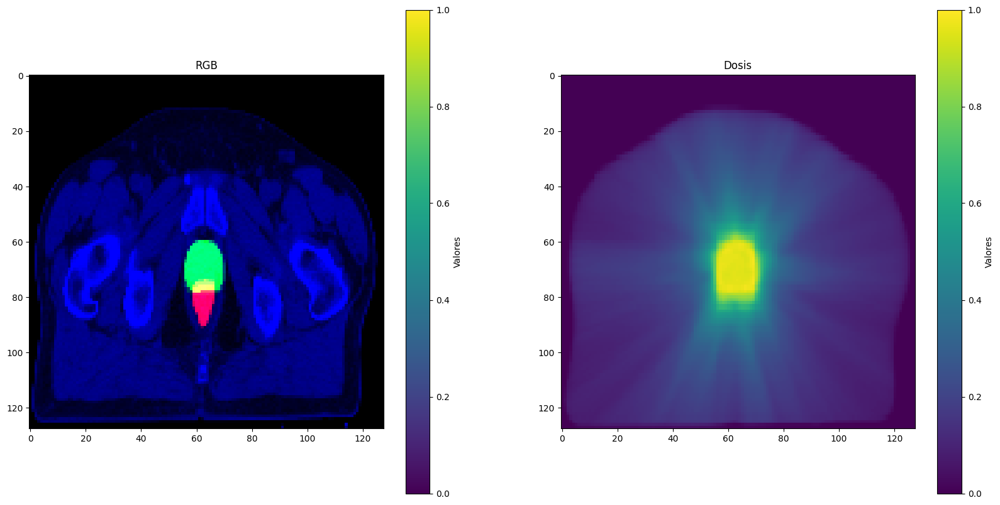

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


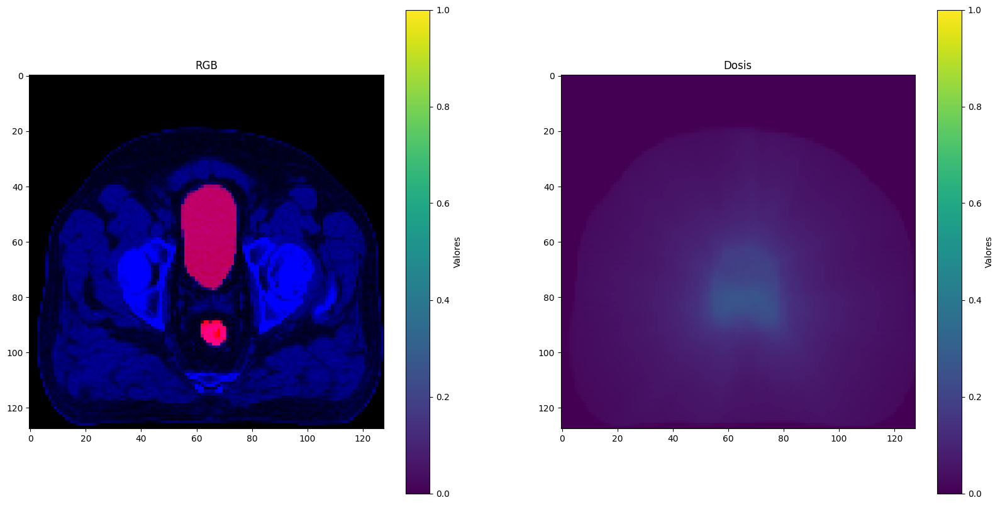

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


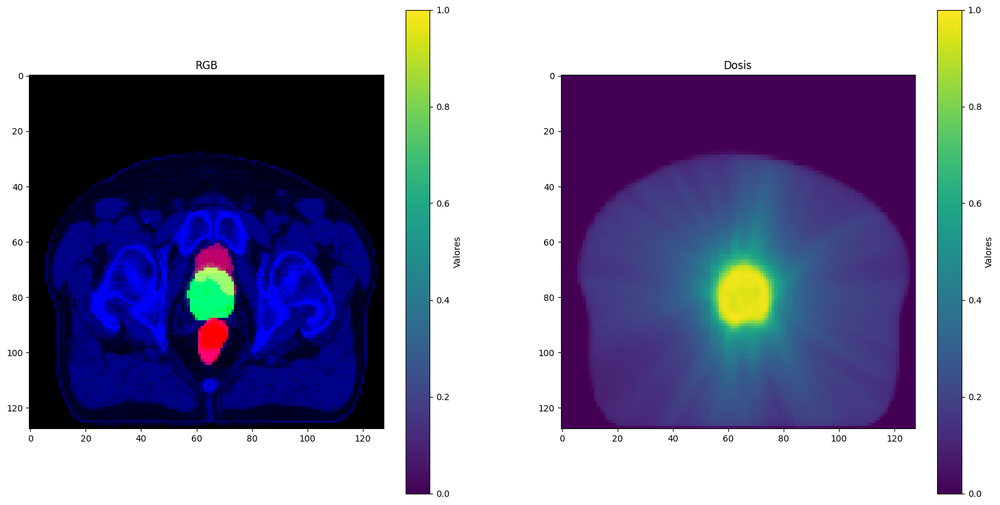

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


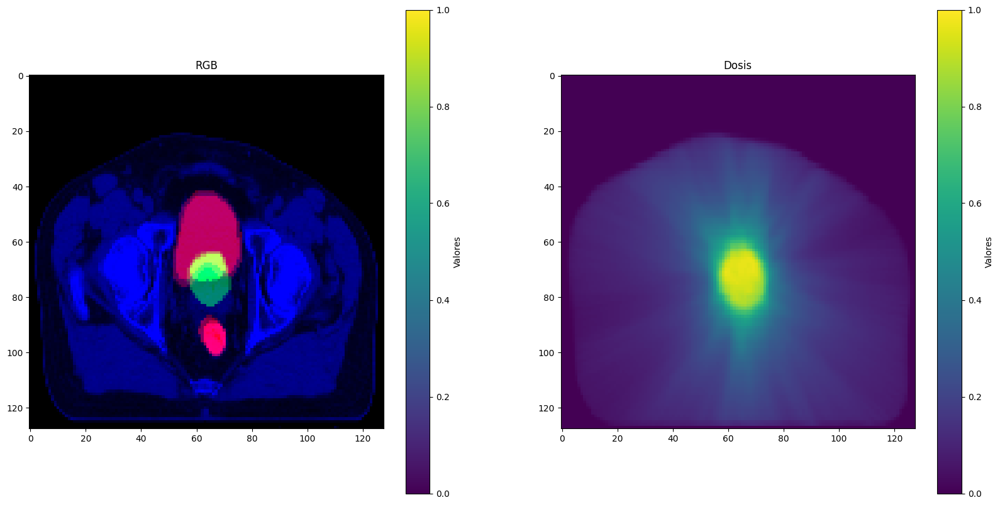

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


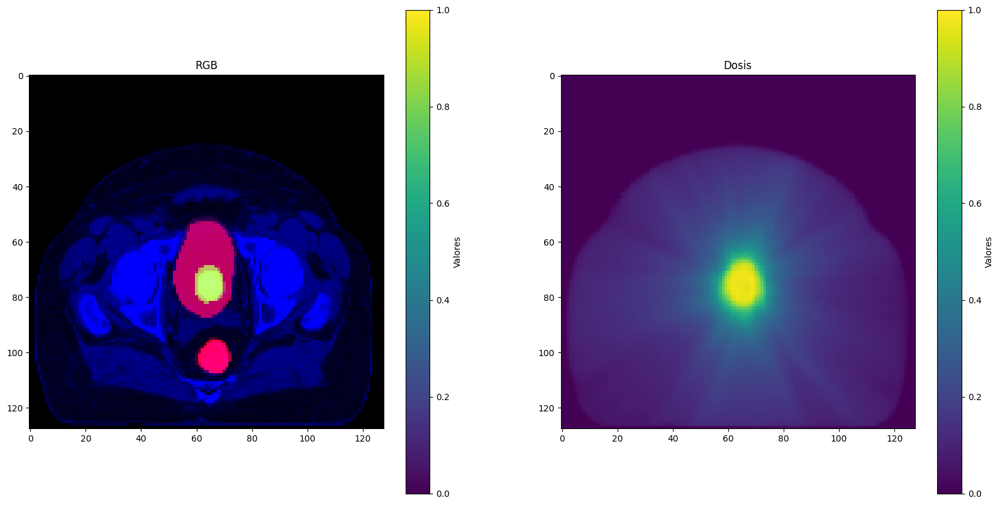

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


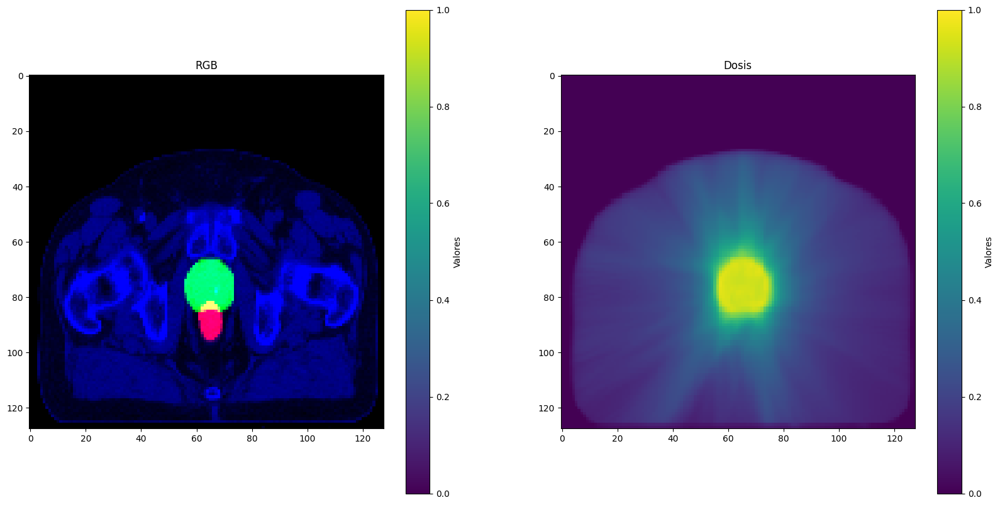

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


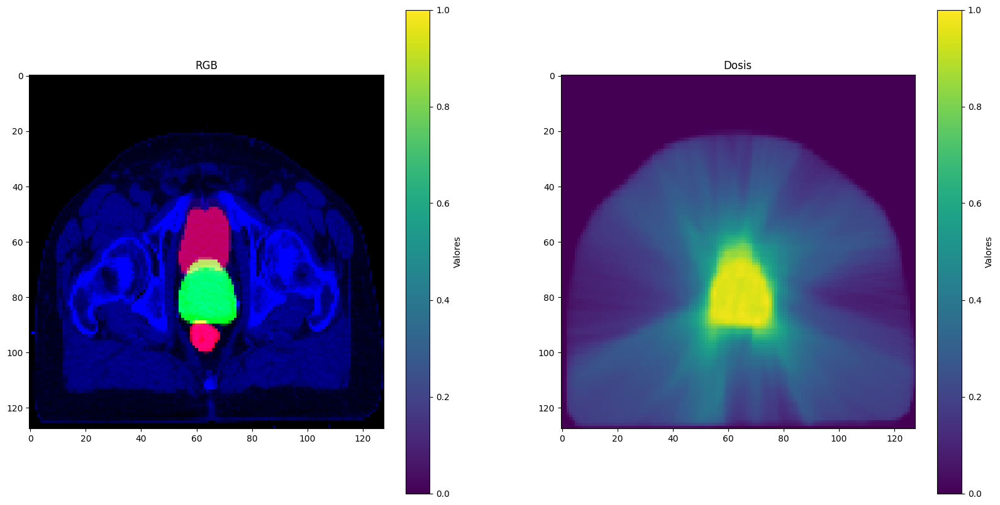

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


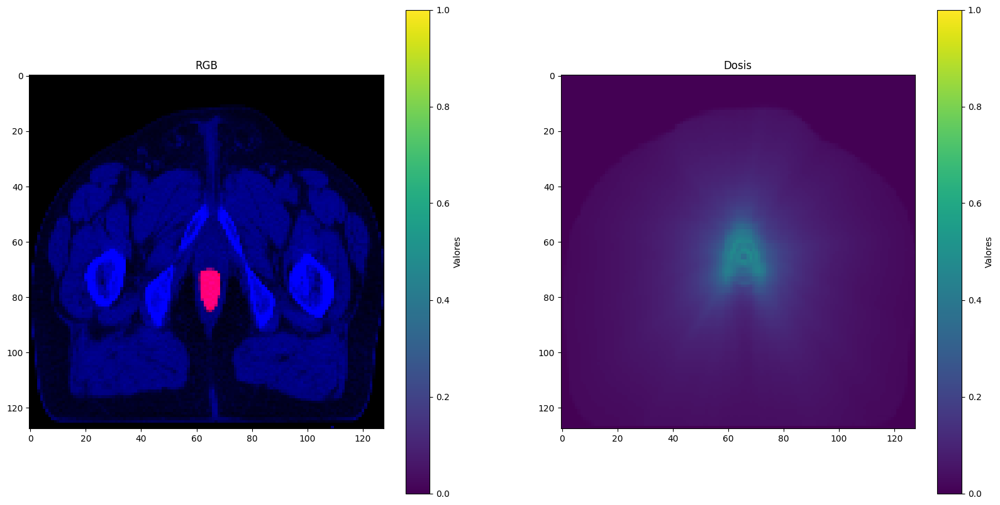

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


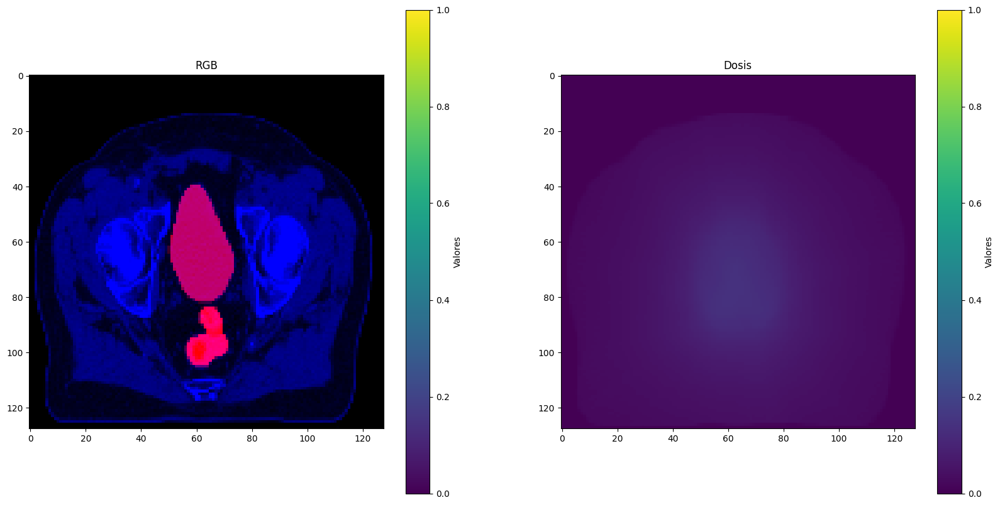

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


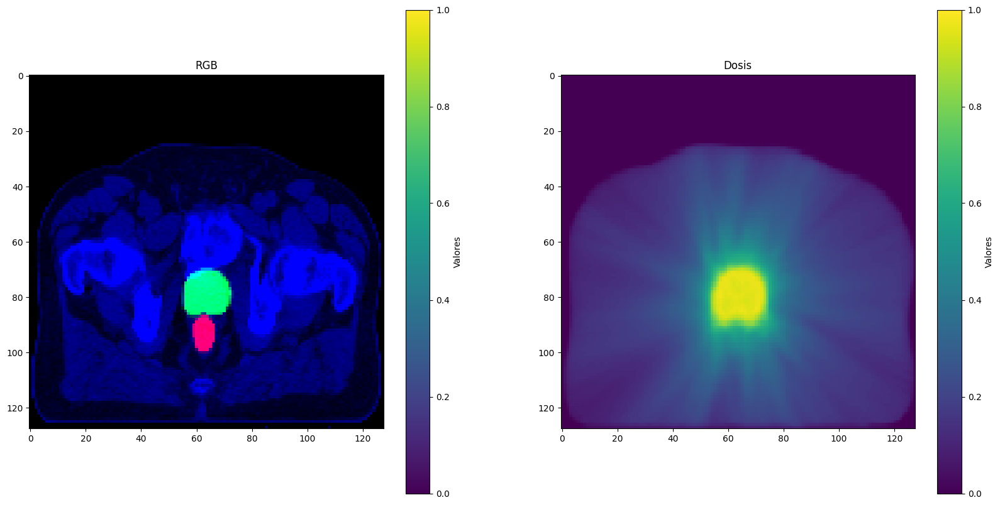

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


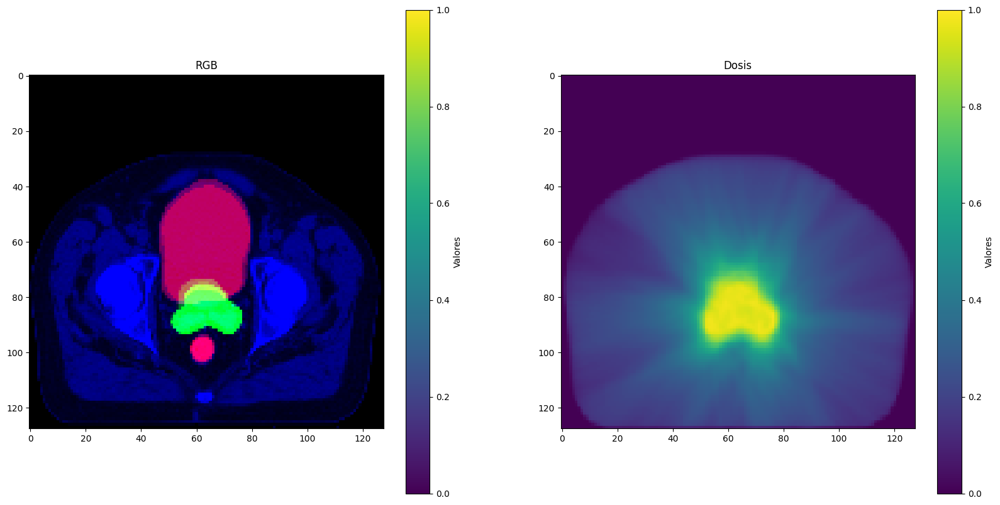

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


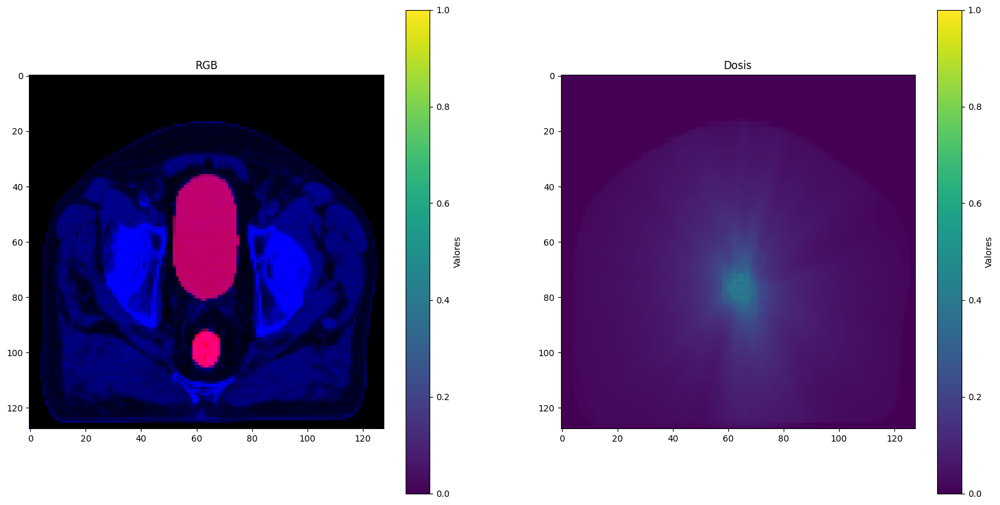

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


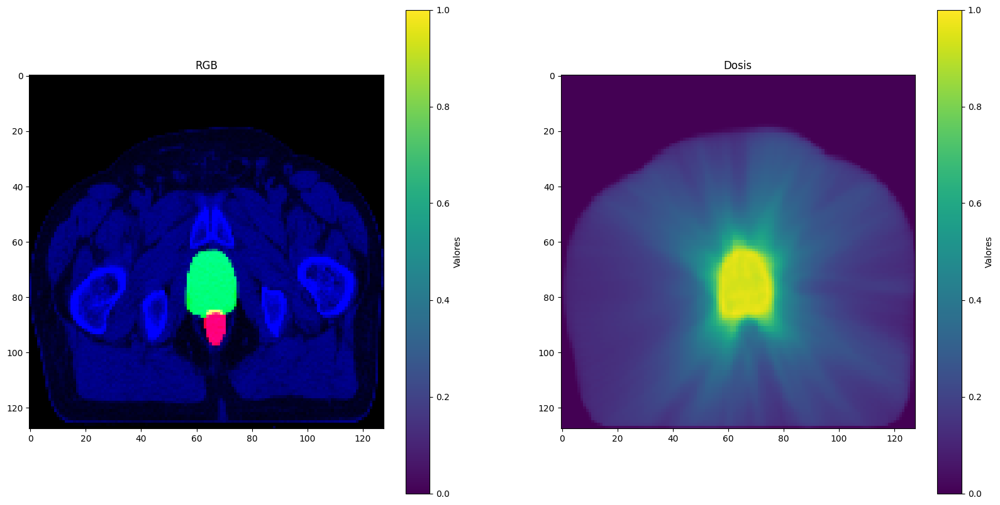

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


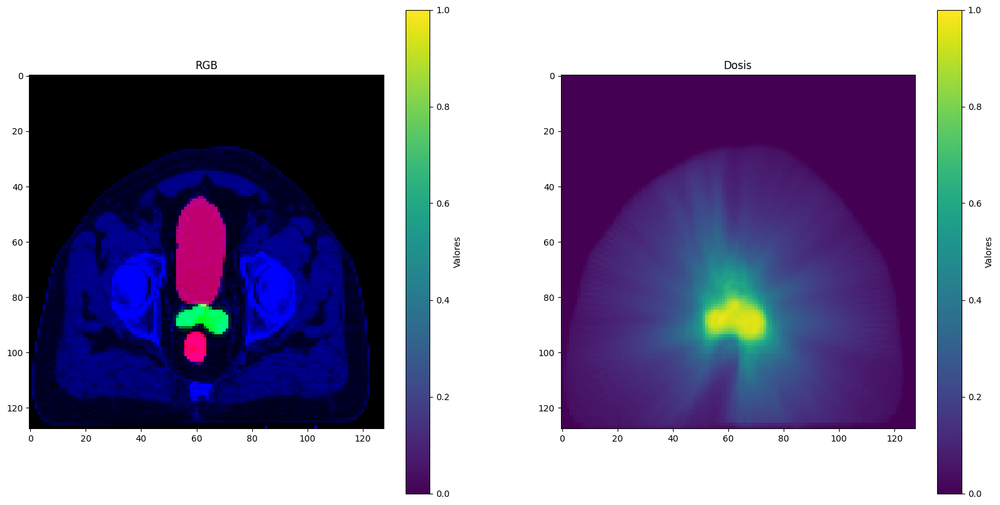

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


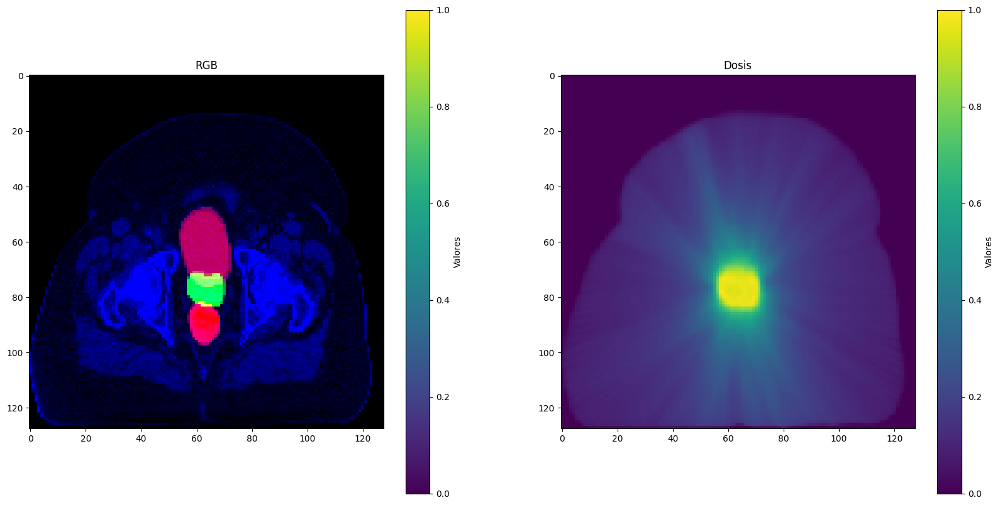

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


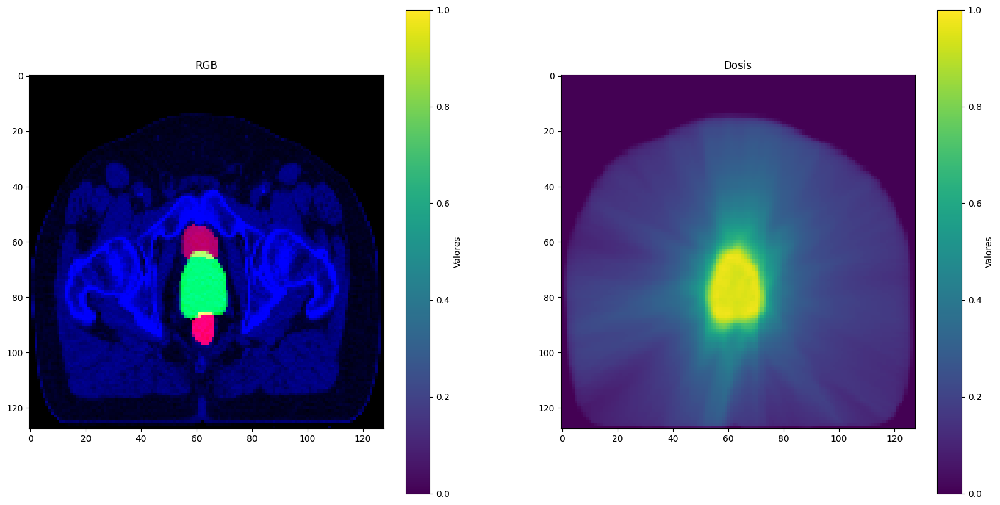

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


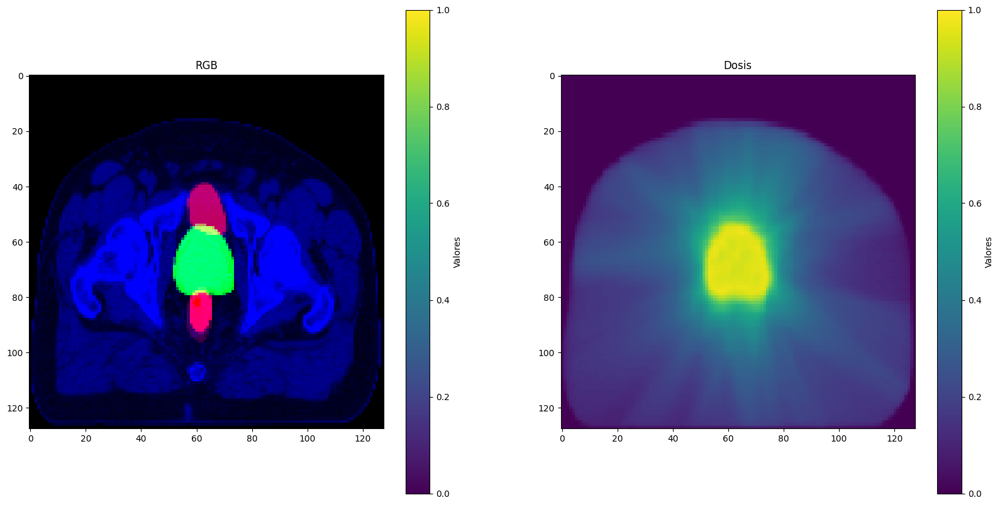

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


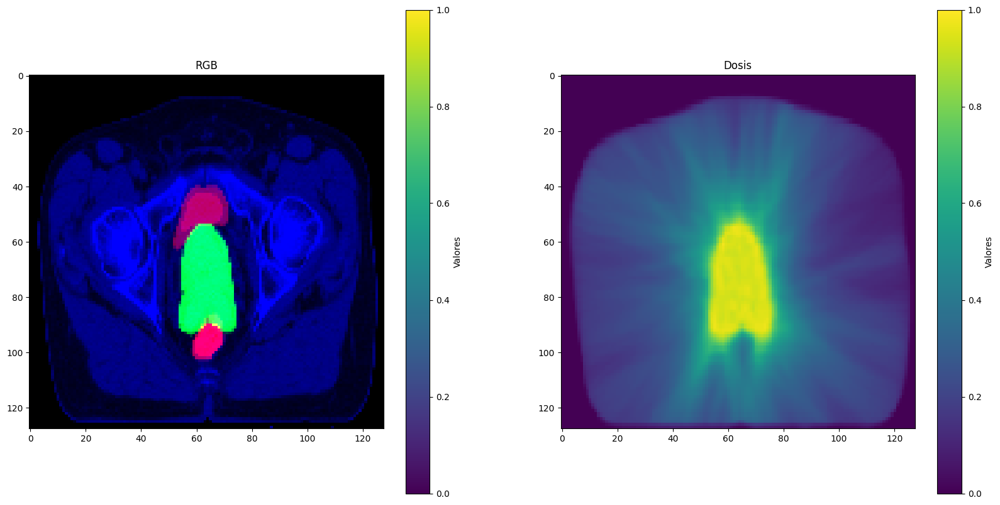

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


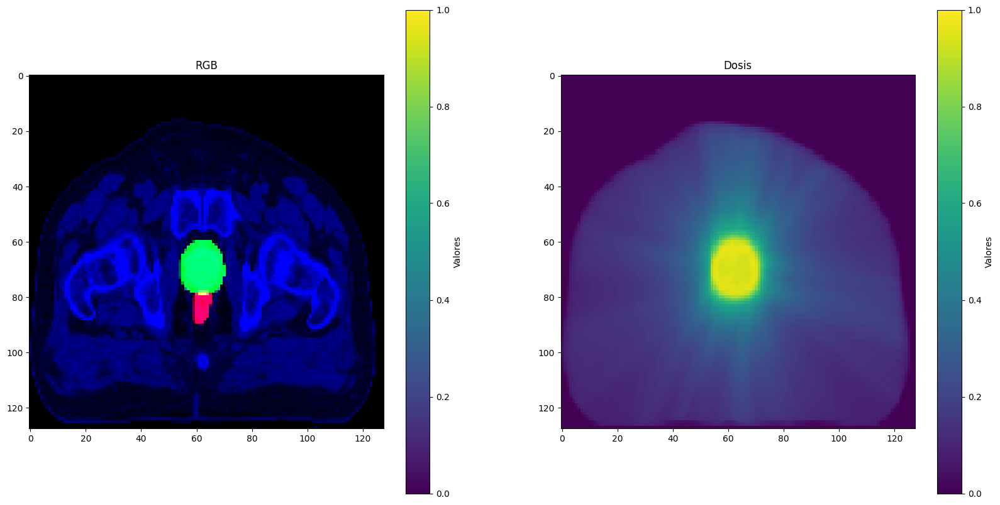

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


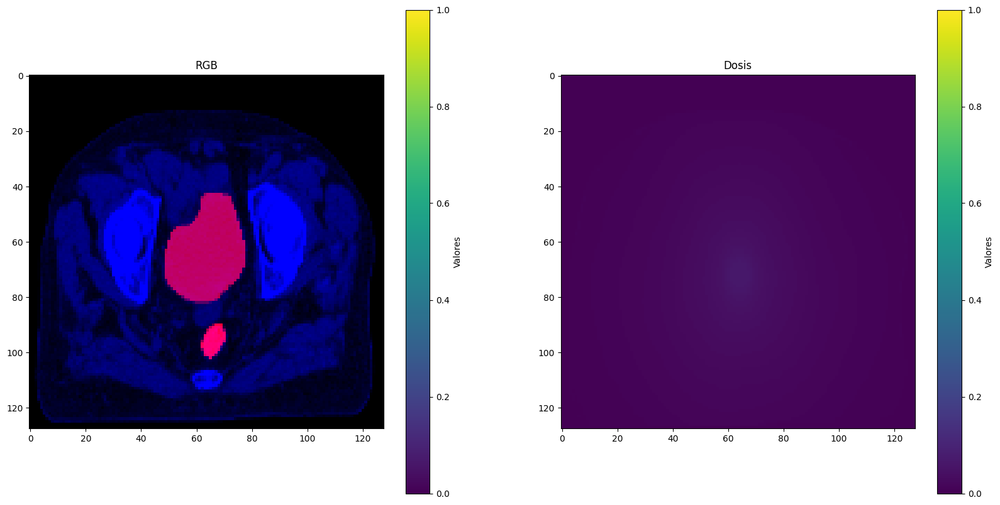

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


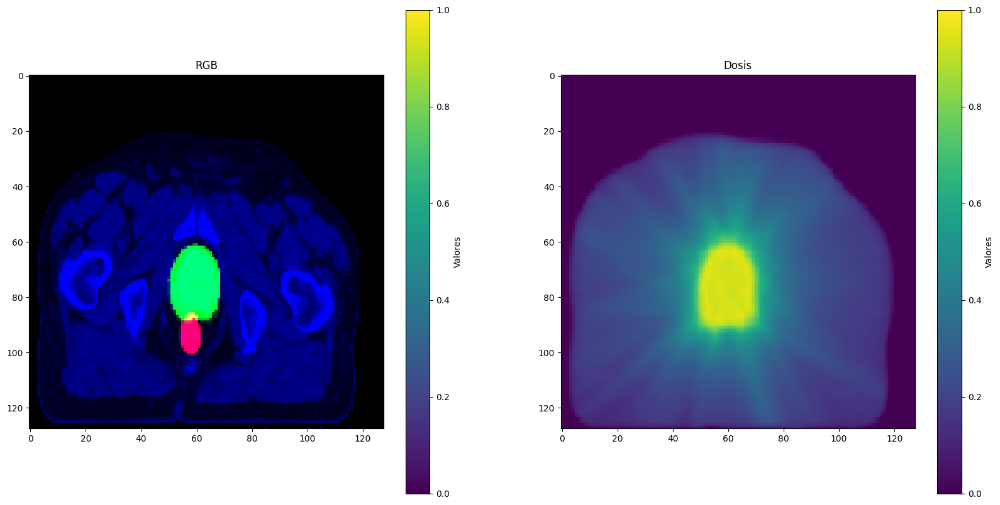

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


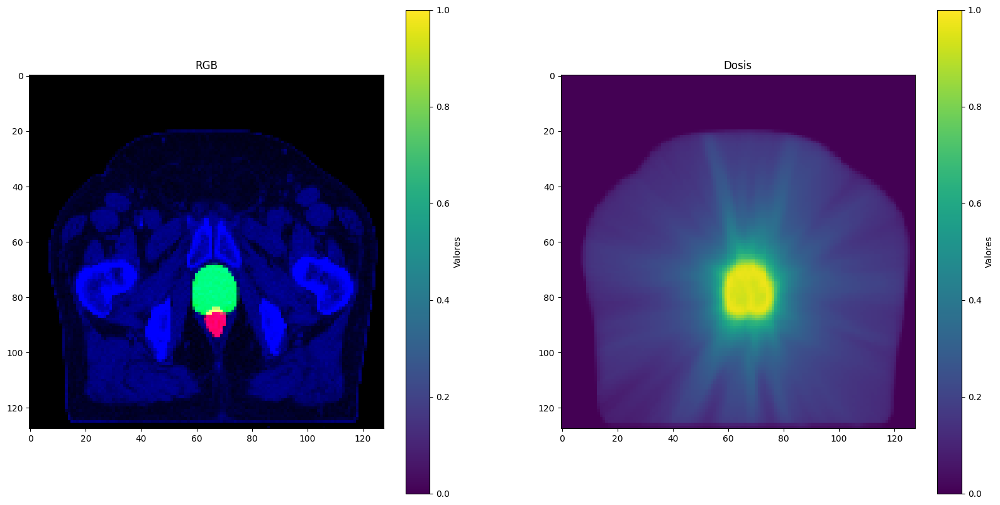

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


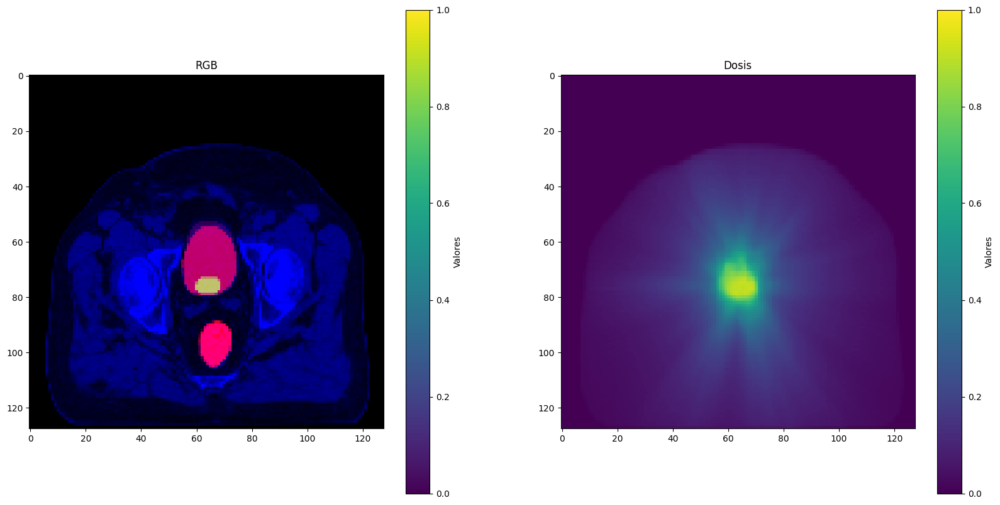

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


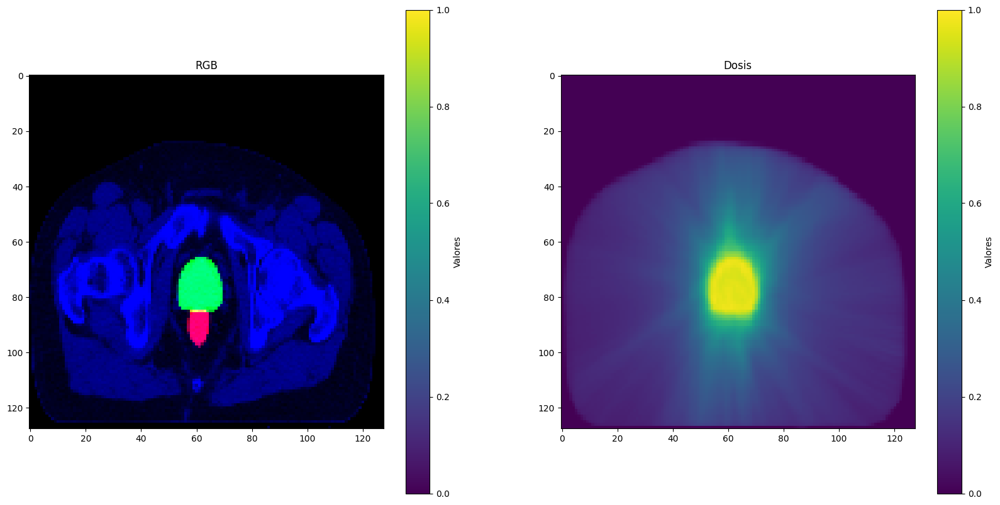

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


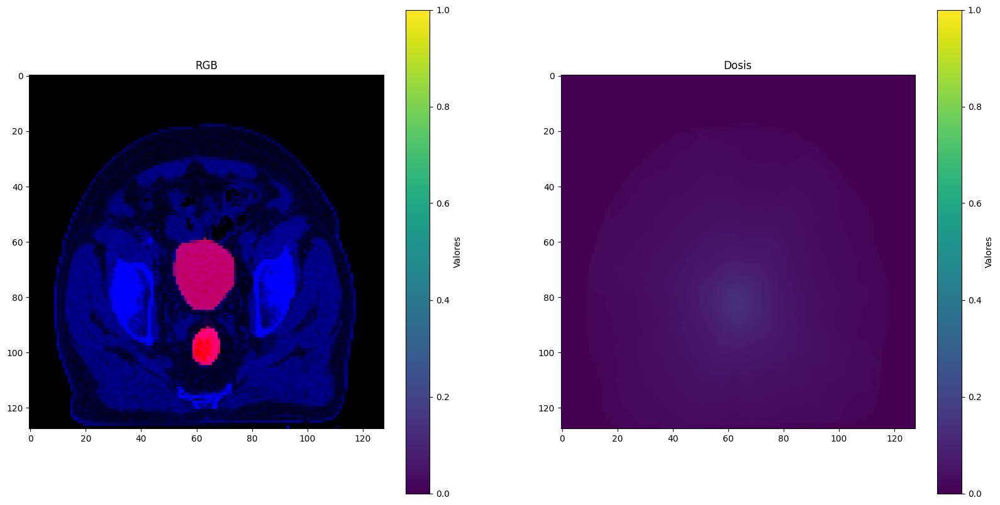

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


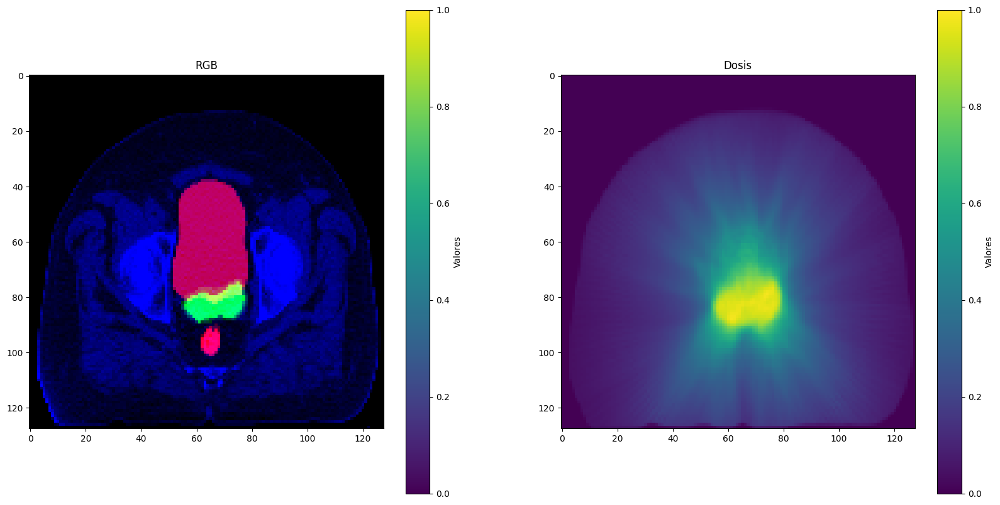

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


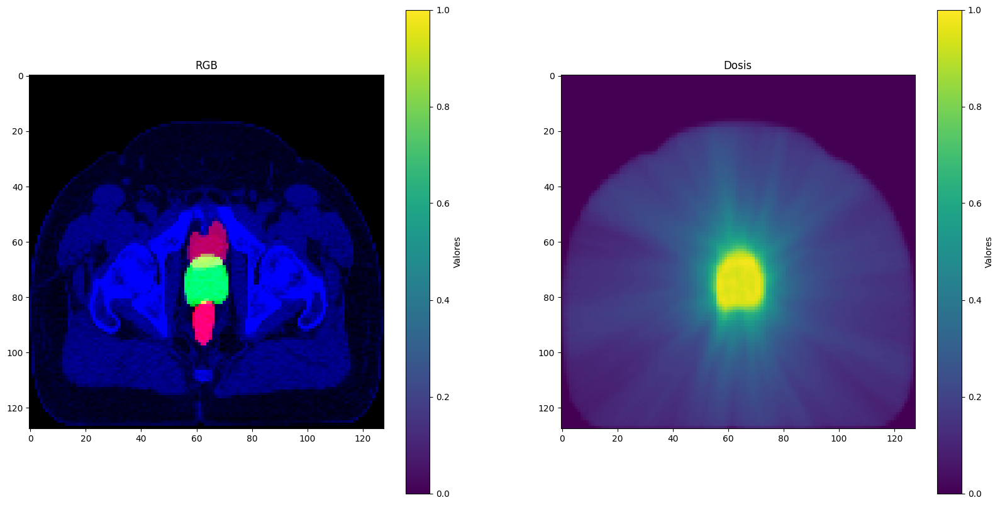

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


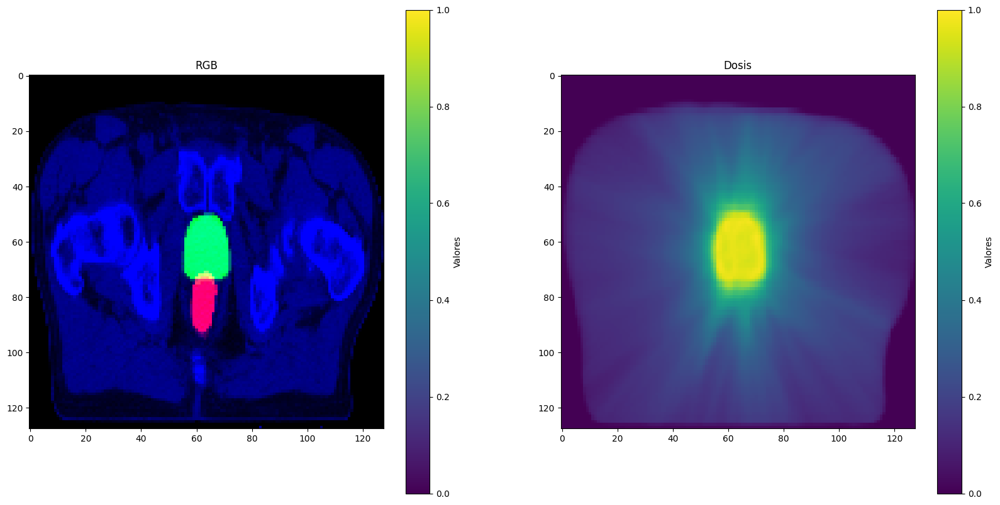

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


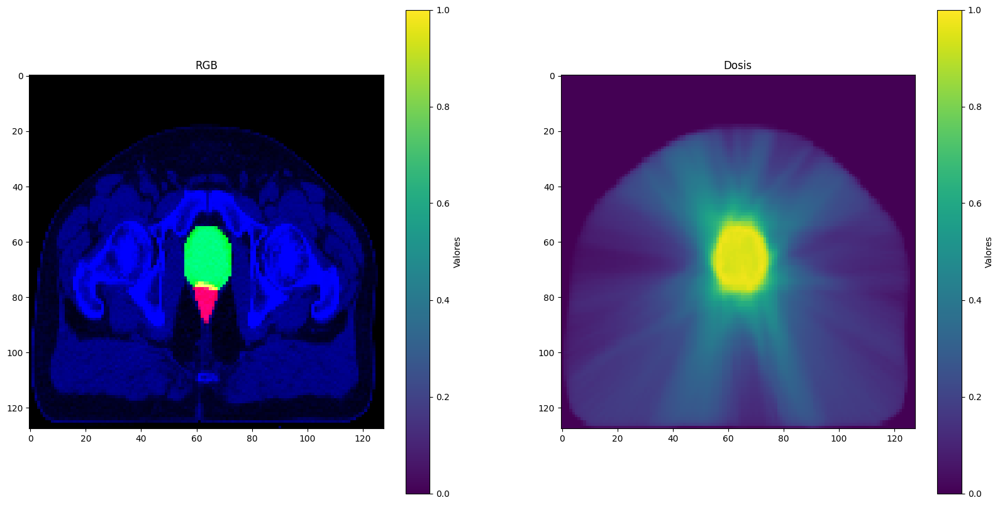

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


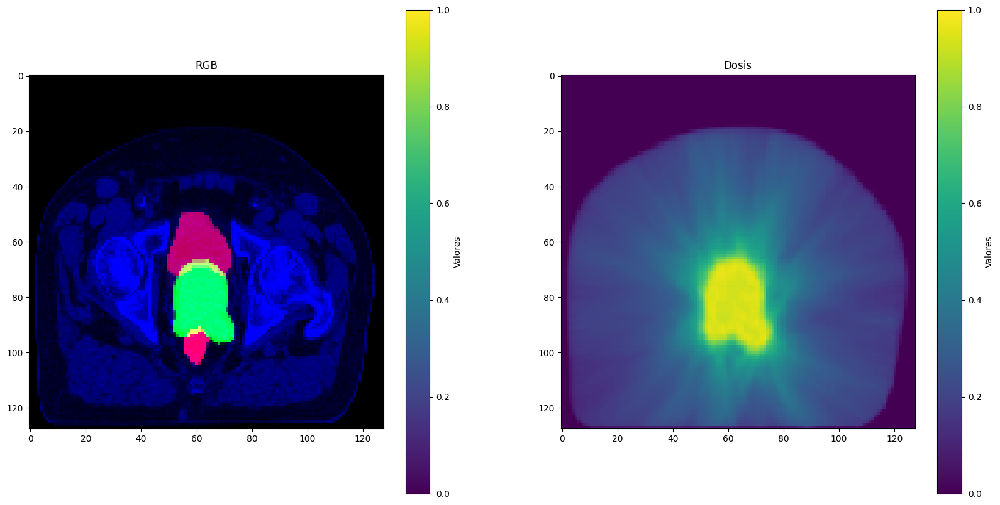

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


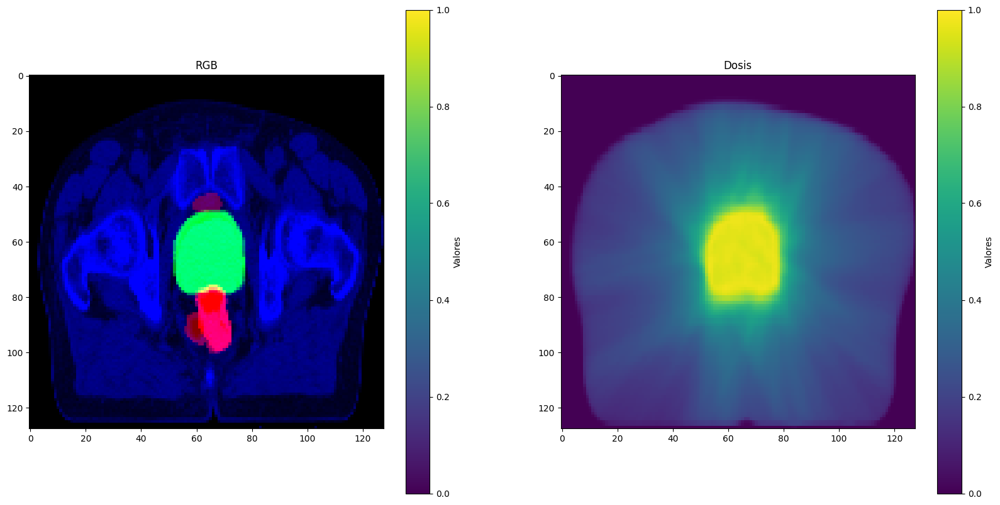

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


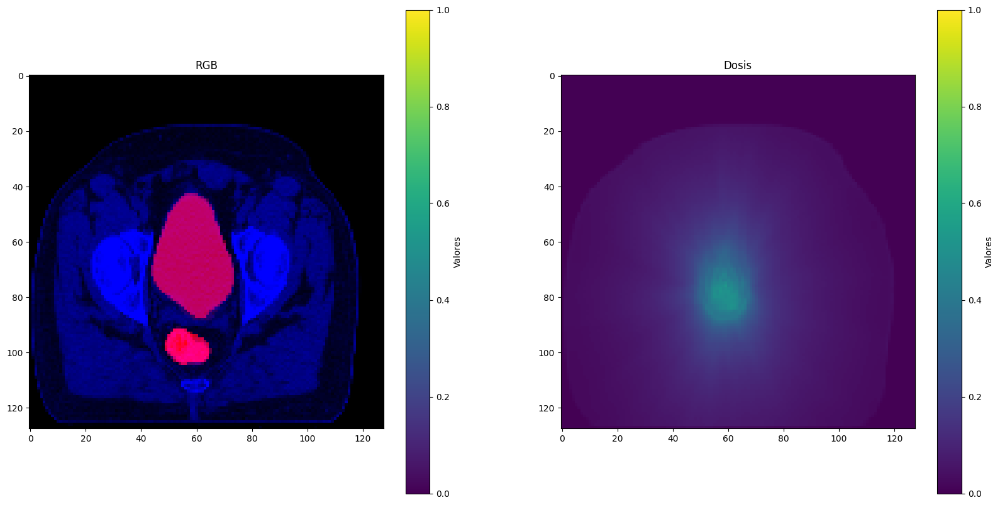

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


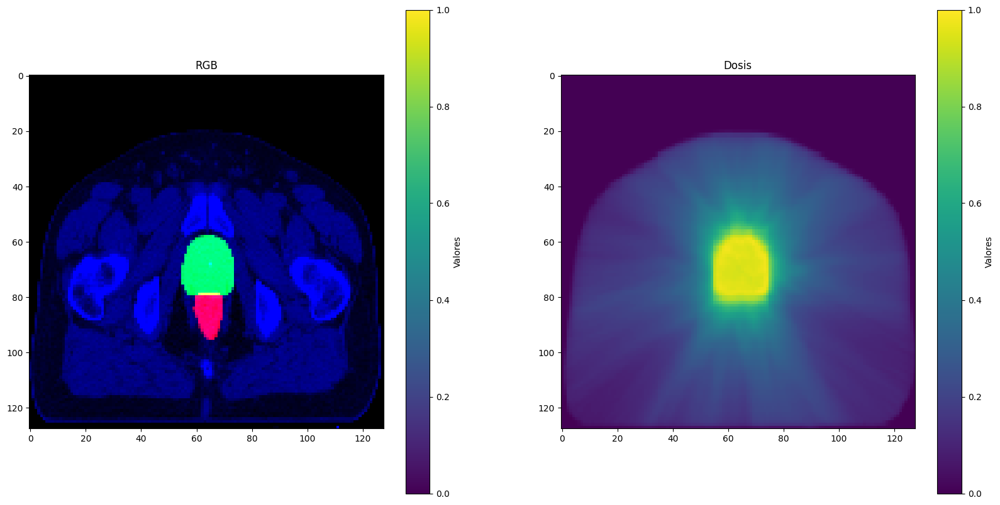

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


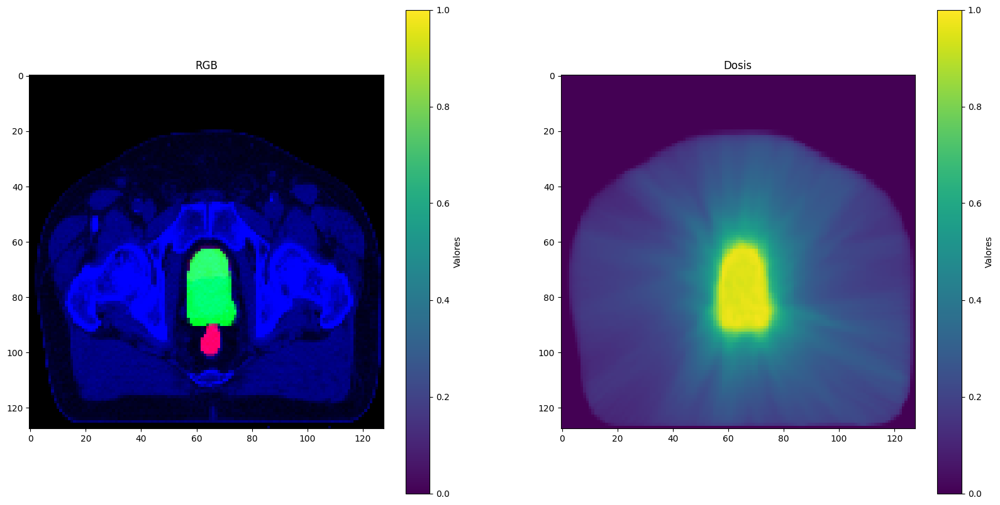

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


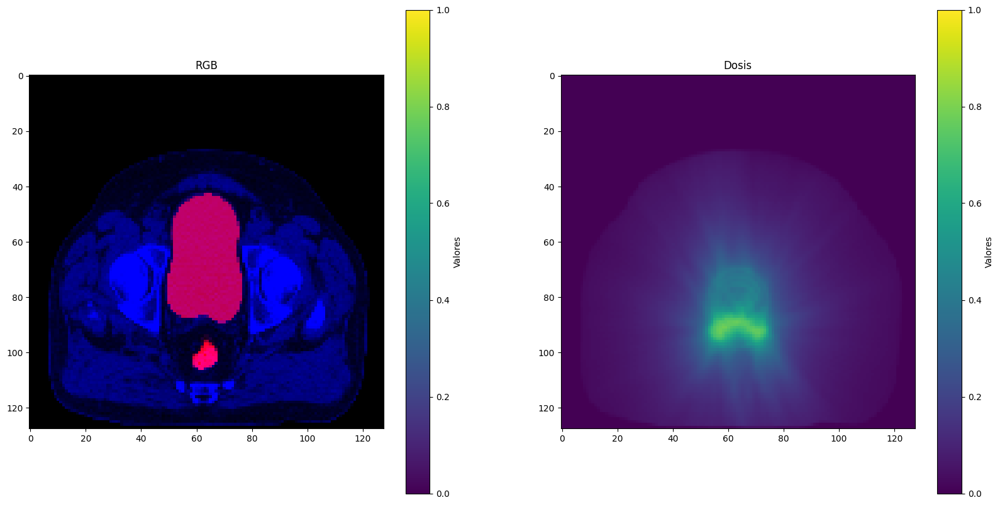

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


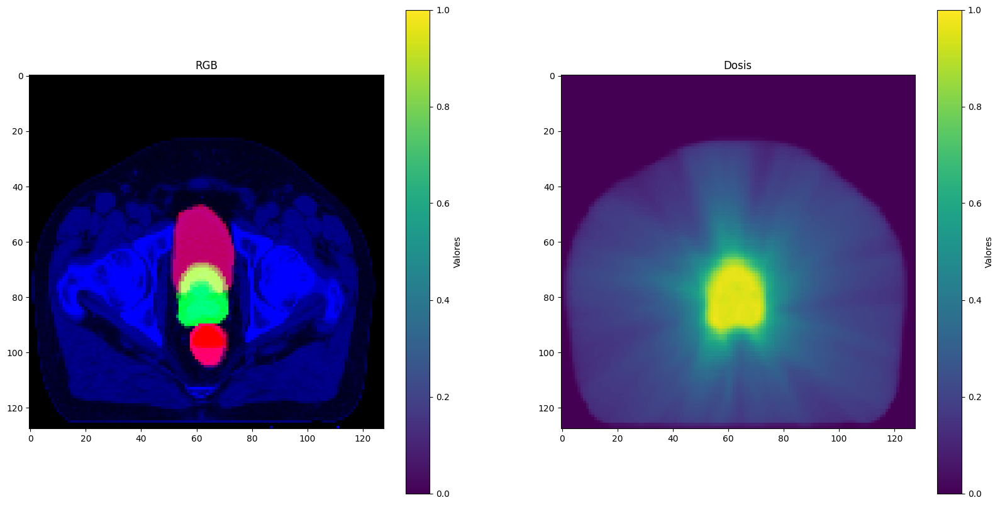

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


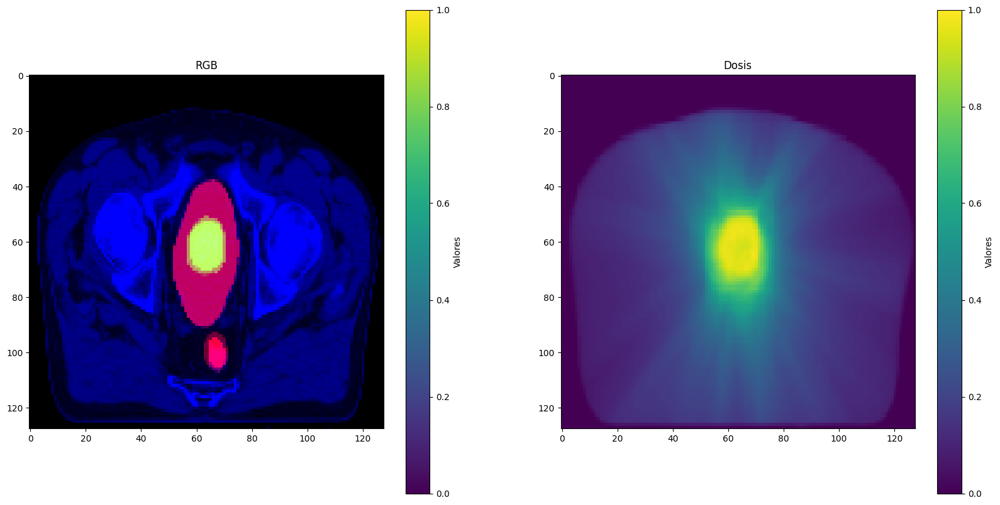

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


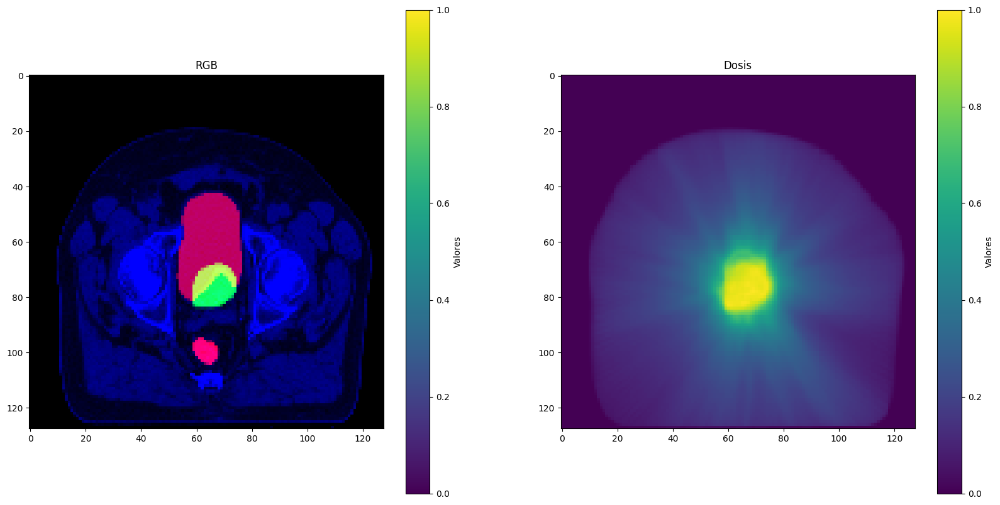

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


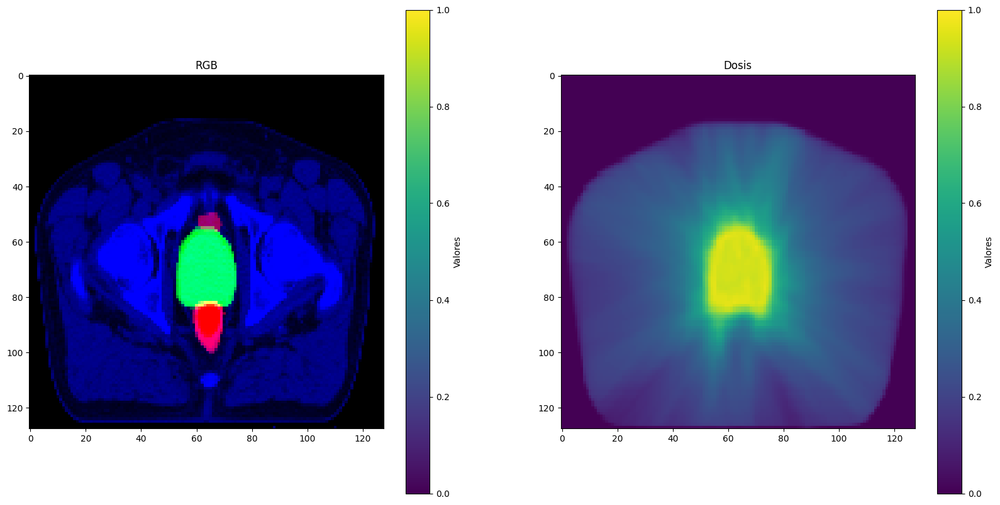

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


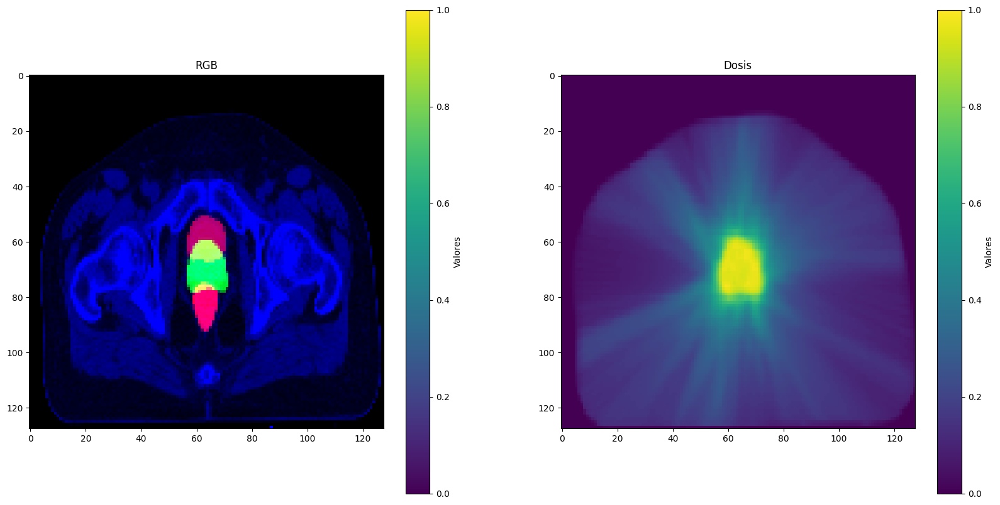

Feature batch shape: torch.Size([1, 3, 128, 128, 128])
Labels batch shape: torch.Size([1, 1, 128, 128, 128])
Feature batch shape: torch.Size([3, 128, 128, 128])
Labels batch shape: torch.Size([1, 128, 128, 128])


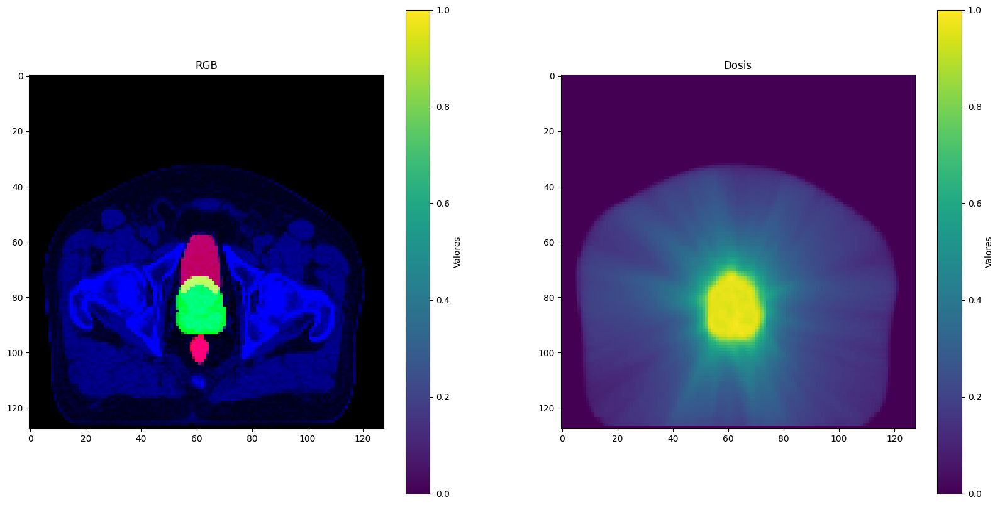

In [20]:
import torch
import matplotlib.pyplot as plt
# Display image and label.
for train_features, train_labels in dataLoaded: 
    print(f"Feature batch shape: {train_features.size()}")
    print(f"Labels batch shape: {train_labels.size()}")
    
    img = train_features[0]
    label = train_labels[0]
    
    print(f"Feature batch shape: {img.size()}")
    print(f"Labels batch shape: {label.size()}")
    img = img.permute(1,2,3,0)
    label = label.permute(1,2,3,0)
    
    img = (img+1)/2
    label = (label+1)/2
    
    img = img[50].numpy()
    label = label[50].numpy()
    
    # Calcular los valores mínimos y máximos para ambas imágenes
    min_value = min(img.min(), label.min())
    max_value = max(img.max(), label.max())
    
    # Crear las figuras y los ejes
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))  # Ajusta el tamaño de la figura
        
    # Mostrar la primera imagen
    im1 = axs[0].imshow(img, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[0].set_title('RGB')
    
    # Añadir una barra de color vertical para la primera imagen
    cbar1 = fig.colorbar(im1, ax=axs[0])
    cbar1.set_label('Valores')
        
    # Mostrar la segunda imagen
    im2 = axs[1].imshow(label, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[1].set_title('Dosis')
    
    # Añadir una barra de color vertical para la segunda imagen
    cbar2 = fig.colorbar(im2, ax=axs[1])
    cbar2.set_label('Valores')
    
    # Mostrar las imágenes
    plt.show()

# UNET

In [97]:
import random 
import torch 
from torch import nn, optim 
from torch.nn import functional as F 
from torchvision import transforms as T 

In [98]:
class Conv_3_k(nn.Module):
    def __init__(self, channels_in, channels_out):
        super().__init__()  #con esto se inicializa la madre 
        self.conv1 = nn.Conv3d(channels_in, channels_out, kernel_size=3, stride=1,padding=1)  #el paper hace con padding 0
    def forward(self,x):
        return self.conv1(x)

In [99]:
class Double_Conv(nn.Module):
    '''
    Double convolution block for Unet
    '''
    def __init__(self, channels_in, channels_out):
        super().__init__()  #con esto se inicializa la madre 
        self.double_conv = nn.Sequential(
                           Conv_3_k(channels_in, channels_out), 
                           nn.BatchNorm3d(channels_out), #el paper no usa batchnorm porque todavia no habia salido, salieron los dos en 2015
                           nn.ReLU(), 
                           Conv_3_k(channels_out, channels_out), 
                           nn.BatchNorm3d(channels_out), 
                           nn.ReLU())
    def forward(self,x):
        return self.double_conv(x)

In [100]:
class Down_Conv(nn.Module):
    '''
    Bloque que aplica doble conv y max pool, para el camino del submuestreo
    '''
    def __init__(self, channels_in, channels_out):
        super().__init__()  
        self.encoder =  nn.Sequential(
                        nn.MaxPool3d(2,2),  #kernel de 2x2 y un stride de 2 para que lo divida a la mitad 
                        Double_Conv(channels_in, channels_out)
                        )
    def forward(self,x):
        return self.encoder(x)

In [101]:
class Up_Conv(nn.Module):
    '''
    bloque de sobremuestreo
    '''
    def __init__(self, channels_in, channels_out):
        super().__init__()  
        self.upsample_layer =  nn.Sequential(
                               nn.Upsample(scale_factor=2), 
                               nn.Conv3d(channels_in, channels_in//2, kernel_size=1,stride=1)  #a la salida necesitamos tener la mitad de los canales de entrada
                                )
        self.decoder = Double_Conv(channels_in, channels_out)
        
    def forward(self,x1,x2):
        '''
        x1 - es el volumen de sobremuestreo
        x2 - es el volumen que debemso concatenar que viene del submuestreo
        '''
        x1 = self.upsample_layer(x1)
        x = torch.cat([x2,x1], dim = 1) #con dim 1 le indicamos que lo queremos concatenar en la dimension de los canales
        return self.decoder(x)

In [102]:
class UNET(nn.Module):
    '''
    modelo Unet
    '''
    def __init__(self, channels_in, channels,num_classes):
        super().__init__()
        self.first_conv = Double_Conv(channels_in, channels) #8,64,64,64
        self.down_conv1 = Down_Conv(channels, 2*channels) #16,32,32,32
        self.down_conv2 = Down_Conv(2*channels, 4*channels) #32,16,16,16
        self.down_conv3 = Down_Conv(4*channels, 8*channels) #64,8,8,8

        self.middle_conv = Down_Conv(8*channels, 16*channels) #128,4,4,4

        self.up_conv1 = Up_Conv(16*channels, 8*channels) 
        self.up_conv2 = Up_Conv(8*channels, 4*channels) 
        self.up_conv3 = Up_Conv(4*channels, 2*channels) 
        self.up_conv4 = Up_Conv(2*channels, channels) 

        self.last_conv = nn.Conv3d(channels, num_classes, kernel_size=1,stride=1) #mantiene las dimensiones, reduce el numero de mapas de caracteristucas

    def forward(self, x):
        x1 = self.first_conv(x)
        x2 = self.down_conv1(x1)
        x3 = self.down_conv2(x2)
        x4 = self.down_conv3(x3)

        x5 = self.middle_conv(x4)

        u1 = self.up_conv1(x5,x4)
        u2 = self.up_conv2(u1,x3)
        u3 = self.up_conv3(u2,x2)
        u4 = self.up_conv4(u3,x1)

        return self.last_conv(u4)

In [103]:
def test():
    x = torch.randn((1,3,128,128,128))
    model = UNET(3,4,1)
    return model(x)

preds = test()

In [104]:
preds.shape

torch.Size([1, 1, 128, 128, 128])

# Accuracy

In [125]:
def accuracy(model, loader):
    correct = 0 
    intersection = 0
    denom = 0 
    union = 0 
    total = 0 
    cost = 0 
    model = model.to(device = device)
    with torch.no_grad():
        for x,y in loader:
            x = x.to(device = device, dtype=torch.float32)
            y = y.to(device = device, dtype=torch.float32).squeeze(1) #hace un squeeze para sacarle la dimension del canal
            scores = model(x)
            lossfun = nn.MSELoss()
            cost = lossfun(scores,y).item()
            #standard accuracy not optimal
            preds = torch.argmax(scores,dim=1)
            correct += (preds == y).sum()
            total += torch.numel(preds)
            #dice
            intersection += (preds*y).sum()
            denom = (preds+y).sum()
            dice = 2*intersection/(denom +1e-8)
            # intersection over union 
            union += (preds + y - preds*y).sum()
            iou = intersection/(union+1e-8)

        return cost/len(loader), float(correct)/total, dice, iou

# Train Loop

In [122]:
def train(model, optimiser, scheduler = None, epochs = 100, store_every = 1):
    model = model.to(device = device)
    for epoch in range(epochs):
        train_correct_num = 0
        train_total = 0 
        train_cost_acum = 0.
        for mb, (x,y) in enumerate(train_loader, start = 1):
            model.train()
            x = x.to(device = device, dtype=torch.float32)
            y = y.to(device = device, dtype=torch.float32).squeeze(1) #hace un squeeze para sacarle la dimension del canal
            scores = model(x)
            lossfun = nn.MSELoss()
            cost = lossfun(scores,y)
            optimiser.zero_grad()
            cost.backward()
            optimiser.step()
            if scheduler:           #esto no se que hace pero se supone que actualiza la tasa de aprendisaje 
                scheduler.step()
                
            train_predictions = torch.argmax(scores, dim = 1)
            train_correct_num +=(train_predictions == y).sum()
            train_total += torch.numel(train_predictions)
            train_cost_acum += cost.item()
            if mb%store_every == 0:   #la validacion tarda bastamte, por eso no lo vamos a ahcer en cada iteracion, solo lo vamos a hacer cada 25 iteraciones dentro de acda epoca
                val_cost, val_acc, dice, iou = accuracy(model, val_loader)
                train_acc = float(train_correct_num)/train_total     #total de pixeles predichos de la manera correcta sobre el total de pixeles 
                train_cost_every = float(train_cost_acum)/mb
                print(f'mb: {mb}, train cost: {train_cost_every:.4f}, val cost: {val_cost:.4f},'
                      f'train acc: {train_acc:.4f}, val acc: {val_acc:.4f}, '
                      f'dice: {dice}, iou: {iou}')

In [132]:
# definimos el entrenamiento del modelo

#torch.manual_seed(42)
model = UNET(3,4,2)
epochs = 1
optimiser_unet = torch.optim.SGD(model.parameters(), lr = 0.01, momentum=0.95, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimiser_unet, max_lr= 1e-1, steps_per_epoch= len(train_loader), 
                                                epochs=epochs, pct_start= 0.43, div_factor=10, final_div_factor=1000, three_phase=True)


In [133]:
train(model, optimiser_unet, scheduler, epochs)

mb: 1, train cost: 1.5394, val cost: 0.4757,train acc: 0.0000, val acc: 0.0000, dice: 16.796735763549805, iou: -1.6191164255142212
mb: 2, train cost: 1.5018, val cost: 0.3932,train acc: 0.0000, val acc: 0.0000, dice: 23.71544075012207, iou: -1.2871451377868652
mb: 3, train cost: 1.3817, val cost: 0.2030,train acc: 0.0000, val acc: 0.0000, dice: 197.85751342773438, iou: -1.0194454193115234
mb: 4, train cost: 1.1855, val cost: 0.0285,train acc: 0.0000, val acc: 0.0000, dice: 168.98220825195312, iou: -1.0506373643875122
mb: 5, train cost: 0.9648, val cost: 0.0681,train acc: 0.0000, val acc: 0.0000, dice: 46.11746597290039, iou: -1.1139116287231445
mb: 6, train cost: 0.8423, val cost: 0.1836,train acc: 0.0000, val acc: 0.0000, dice: 3.9468226432800293, iou: 1.7092205286026
mb: 7, train cost: 0.8020, val cost: 0.1992,train acc: 0.0000, val acc: 0.0000, dice: 0.5744293928146362, iou: 0.10400647670030594
mb: 8, train cost: 0.7754, val cost: 0.1934,train acc: 0.0000, val acc: 0.0000, dice: 0.4

In [70]:
def plot_mini_batch(img,mask):
    plt.figure(figsize = (20,10))
    for i in range(BATCH_SIZE):
        plt.subplot(4,8,i+1) #i+1 xq plt comienza en 1
        img = img.squeeze(0)
        mask = mask.squeeze(0)
        img = img.permute(1,2,3,0)
        mask = mask.permute(1,2,3,0)
        img = img[50].numpy()
        mask = mask[50].numpy()
        plt.imshow(img)
        plt.imshow(mask, alpha= 0.5)
        plt.axis('Off')
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


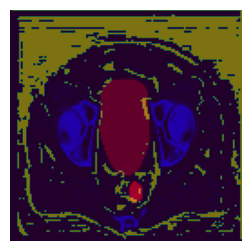

In [134]:
imgs_val, masks_val = next(iter(val_loader))
imgs_val = imgs_val.to(device, dtype = torch.float32)
model = model.to(device)
with torch.no_grad():
    scores = model(imgs_val)
    preds = torch.argmax(scores, dim=1).float()

imgs_val = imgs_val.cpu()
preds = preds.cpu()
plot_mini_batch(imgs_val, preds.unsqueeze(1))

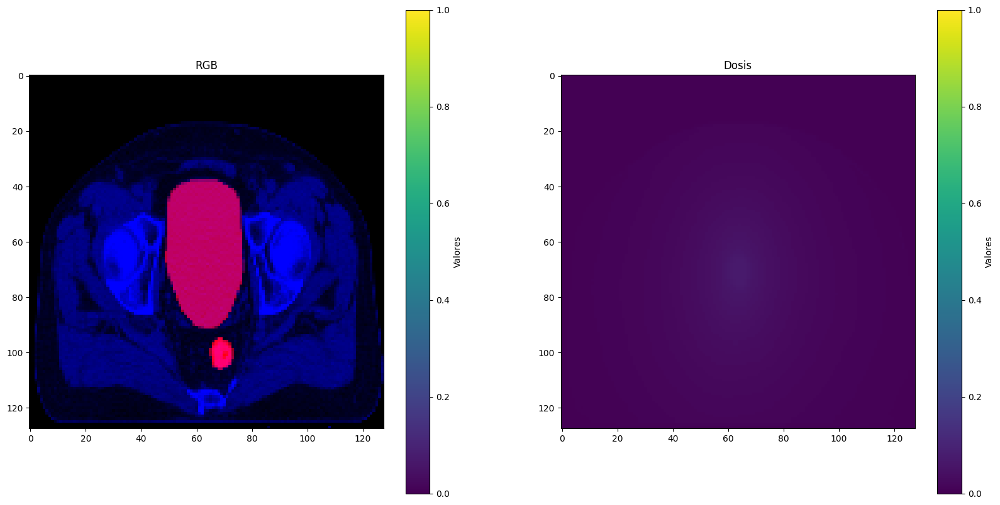

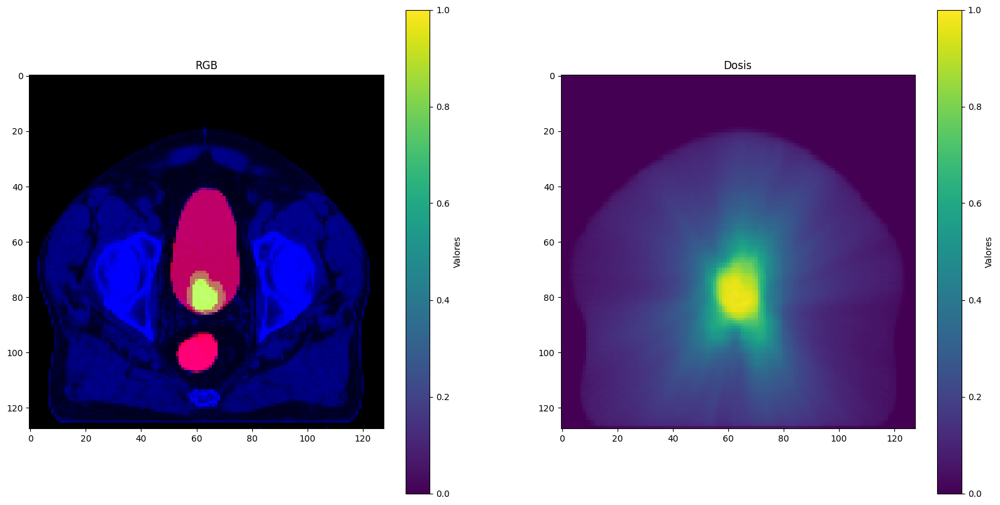

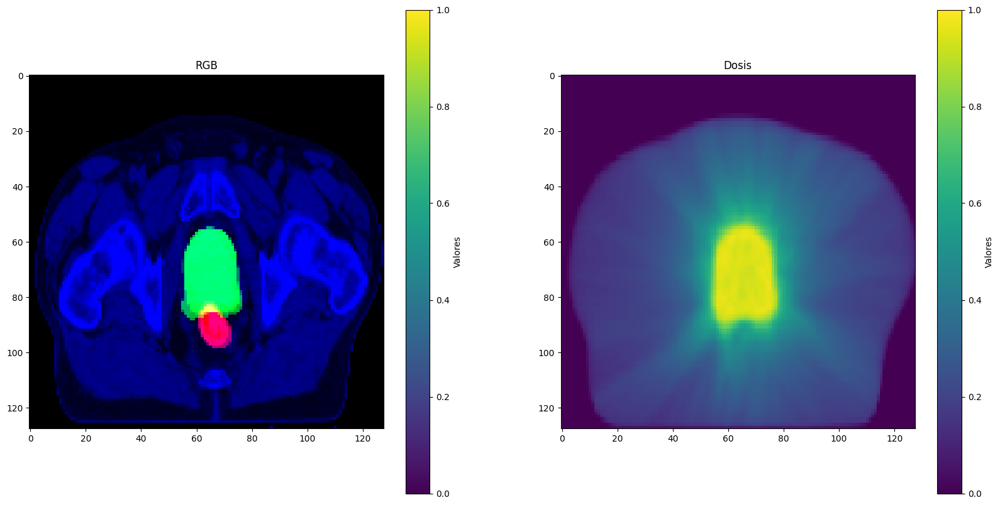

In [137]:
for train_features, train_labels in val_loader: 
    img = train_features[0]
    label = train_labels[0]


    img = img.to(device, dtype = torch.float32)
    img = img.unsqueeze(0)
    model = model.to(device)
    with torch.no_grad():
        scores = model(img)
        #preds = torch.argmax(scores, dim=1).float()

    img = img.cpu()
    scores = scores.cpu()
    #print(f"Feature batch shape: {img.size()}")
    #print(f"Labels batch shape: {label.size()}")
    img = img.squeeze(0)
    img = img.permute(1,2,3,0)
    label = label.permute(1,2,3,0)
    
    img = (img+1)/2
    label = (label+1)/2
    
    img = img[50].numpy()
    label = label[50].numpy()
    
    # Calcular los valores mínimos y máximos para ambas imágenes
    min_value = min(img.min(), label.min())
    max_value = max(img.max(), label.max())
    
    # Crear las figuras y los ejes
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))  # Ajusta el tamaño de la figura
        
    # Mostrar la primera imagen
    im1 = axs[0].imshow(img, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[0].set_title('RGB')
    
    # Añadir una barra de color vertical para la primera imagen
    cbar1 = fig.colorbar(im1, ax=axs[0])
    cbar1.set_label('Valores')
        
    # Mostrar la segunda imagen
    im2 = axs[1].imshow(label, cmap='viridis', vmin=min_value, vmax=max_value)
    axs[1].set_title('Dosis')
    
    # Añadir una barra de color vertical para la segunda imagen
    cbar2 = fig.colorbar(im2, ax=axs[1])
    cbar2.set_label('Valores')
    
    # Mostrar las imágenes
    plt.show()